In [1]:
import xarray as xr
import geopandas as gpd
import rioxarray
import pandas as pd
from pathlib import Path
import dask
import dask.array as da
from dask.diagnostics import ProgressBar
import numcodecs
import pickle
import numpy as np
import calendar
import gc
import os
import matplotlib.pyplot as plt

Notes from meeting with Scott:  
- Update vscode, and then select which model copilot uses in chat to claude sonnet 4.5  
- after reading in the reanalysis with open mf dataset, then I can select a smaller subsection of the data, which will eliminate dask, and write my code for calculating correlation on that.  
- then once i have code that works on a small area, feed that to chat or copilot and ask it to scale up to something doable with my computing resources.  
- running with xr.corr crashed the kernel no matter how ChatGPT sliced and diced. It now suggests first normalizing and then computing a dot product on the resultant matrices. To confirm that this is doing what I want it to do, I will:  
        - load in all the data (with auto chunking). 
        - select a subset of the large data that I can test out methods on  
        - run both xr.corr and the manual pearsons r calculations. 
        - check if these two products are the same


In [3]:
example_basefile = xr.open_dataset('../swe_reanalysis_pca/data/download/1985/SD_POST_1985.nc')

In [4]:
example_basefile

<xarray.Dataset> Size: 3GB
Dimensions:      (y: 1575, x: 1125, time: 365)
Coordinates:
  * y            (y) float32 6kB 34.0 34.01 34.01 34.02 ... 40.99 40.99 41.0
  * x            (x) float32 4kB -122.0 -122.0 -122.0 ... -117.0 -117.0 -117.0
  * time         (time) datetime64[ns] 3kB 1984-10-01 1984-10-02 ... 1985-09-30
    spatial_ref  int64 8B ...
Data variables:
    SD_Post      (y, x, time) float32 3GB ...

In [3]:
example_daily_sd = xr.open_dataset('../data/reanalysis/daily_SD_files_doy/1985/day_001.nc')

In [4]:
example_daily_sd

<xarray.Dataset> Size: 5MB
Dimensions:      (y: 1267, x: 919)
Coordinates:
  * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
  * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    time         datetime64[ns] 8B ...
    spatial_ref  int64 8B ...
Data variables:
    SD_Post      (y, x) float32 5MB ...

### Write a function for converting datetime to day of water year:

In [2]:
def date_to_wy_day(date):
    """
    Convert a date to day of water year.
    Water year starts Oct 1, so Oct 1 = day 1.
    
    Parameters:
    -----------
    date : pd.Timestamp or datetime
        The date to convert
        
    Returns:
    --------
    tuple : (water_year, wy_day)
        water_year: The water year (e.g., WY 2019 runs Oct 2018 - Sep 2019)
        wy_day: Day of water year (1-366)
    """
    date = pd.Timestamp(date)
    # Determine water year
    if date.month >= 10:  # Oct-Dec
        water_year = date.year + 1
        wy_start = pd.Timestamp(f"{date.year}-10-01")
    else:  # Jan-Sep
        water_year = date.year
        wy_start = pd.Timestamp(f"{date.year - 1}-10-01")
    
    wy_day = (date - wy_start).days + 1
    return water_year, wy_day

### Write a function for saving all the variables as daily files:

In [5]:
def process_yearly_files_to_daily(input_base_dir, output_base_dir, polygon_path, variable='SCA_Post', file_pattern='*SWE_SCA_POST_{year}.nc'):
    """
    Read yearly .nc files, clip to polygon, stack spatial dims, save each day as 1D array.
    Files are saved by WATER YEAR and day of water year (Oct 1 = day 1).
    Memory-efficient: processes one day at a time to minimize memory footprint.
    Auto-resumes: skips years that have already been fully processed.
    
    Parameters:
    -----------
    input_base_dir : str
        Base directory containing {year}/ subdirectories with yearly .nc files
    output_base_dir : str
        Base directory where output will be saved as {water_year}/ subdirectories
    polygon_path : str
        Path to polygon geojson file for clipping
    variable : str
        Variable name to extract (default 'SCA_Post')
    file_pattern : str
        Glob pattern for input files. Use {year} as placeholder for year.
    """
    input_base = Path(input_base_dir)
    output_base = Path(output_base_dir)
    
    # Load polygon once
    poly = gpd.read_file(polygon_path)
    
    # Find all years with data
    all_years = sorted([int(d.name) for d in input_base.iterdir() if d.is_dir()])
    
    print(f"Found {len(all_years)} years with data ({all_years[0]}-{all_years[-1]})")
    print(f"Using file pattern: {file_pattern}")
    print(f"Extracting variable: {variable}")
    print(f"Output naming: Water year folders with day-of-water-year files")
    
    # Track which water year days we've saved
    saved_days = {}  # {water_year: set of wy_days}
    
    for year in all_years:
        print(f"\n{'='*60}")
        print(f"Processing calendar year {year}")
        print(f"{'='*60}")
        
        # Find .nc file for this year using the pattern
        year_dir = input_base / str(year)
        pattern = file_pattern.format(year=year)
        nc_files = list(year_dir.glob(pattern))
        
        if not nc_files:
            print(f"  ⚠️ No files matching {pattern} found in {year_dir}")
            continue
        
        nc_file = nc_files[0]
        print(f"  Reading: {nc_file.name}")
        
        try:
            # Read and prepare dataset (lazy loading)
            ds = xr.open_dataset(nc_file)
            ds = ds.rio.write_crs("EPSG:4326", inplace=False)
            
            # Handle coordinate naming flexibly
            rename_dict = {}
            if ('Latitude' in ds.dims or 'Latitude' in ds.coords) and 'y' not in ds.dims and 'y' not in ds.coords:
                rename_dict['Latitude'] = 'y'
            if ('Longitude' in ds.dims or 'Longitude' in ds.coords) and 'x' not in ds.dims and 'x' not in ds.coords:
                rename_dict['Longitude'] = 'x'
            if rename_dict:
                ds = ds.rename(rename_dict)
            ds = ds.rio.set_spatial_dims(x_dim="x", y_dim="y", inplace=False)
            
            # Clip to polygon
            poly_crs = poly.to_crs(ds.rio.crs)
            ds_clip = ds.rio.clip(poly_crs.geometry, poly_crs.crs, drop=True)
            
            # Process each time step individually to save memory
            time_values = ds_clip.time.values
            n_times = len(time_values)
            
            for i, time_val in enumerate(time_values):
                # Convert to water year day
                ts = pd.Timestamp(time_val)
                water_year, wy_day = date_to_wy_day(ts)
                
                # Create output directory for this water year if needed
                output_wy_dir = output_base / str(water_year)
                output_wy_dir.mkdir(parents=True, exist_ok=True)
                
                # Check if this day already exists
                filename = f"day_{wy_day:03d}.nc"
                filepath = output_wy_dir / filename
                
                if filepath.exists():
                    continue  # Skip if already saved
                
                # Extract and process only this day's data
                day_data = ds_clip[variable].isel(time=i)
                
                # Stack spatial dimensions, reset index, drop coords
                day_stacked = day_data.stack(space=('y', 'x')).reset_index('space').drop_vars(['x', 'y'], errors='ignore')
                
                # Save as netcdf file
                day_stacked.to_dataset(name=variable).to_netcdf(filepath)
                
                # Clean up this iteration's data
                del day_data, day_stacked
                
                if (i + 1) % max(1, n_times // 5) == 0 or i == n_times - 1:
                    print(f"    Saved {i + 1}/{n_times} days (WY {water_year}, day {wy_day})", end='\r')
            
            print(f"    ✓ Calendar year {year} complete: {n_times} days processed")
            
        finally:
            ds.close()
            ds_clip = None
            del ds, ds_clip
            gc.collect()
    
    print(f"\n{'='*60}")
    print("All years processed!")
    print(f"{'='*60}")

In [6]:
def process_yearly_files_to_daily_2d(input_base_dir, output_base_dir, polygon_path, variable='SD_Post', file_pattern='SD_POST_{year}.nc'):
    """
    Read yearly .nc files, clip to polygon, save each day as 2D array (keeps spatial dimensions).
    Files are saved by WATER YEAR and day of water year (Oct 1 = day 1).
    Memory-efficient: processes one day at a time.
    Auto-resumes: skips files that already exist.
    
    Parameters:
    -----------
    input_base_dir : str
        Base directory containing {year}/ subdirectories with yearly .nc files
    output_base_dir : str
        Base directory where output will be saved as {water_year}/ subdirectories
    polygon_path : str
        Path to polygon geojson file for clipping
    variable : str
        Variable name to extract (default 'SD_Post')
    file_pattern : str
        Glob pattern for input files. Use {year} as placeholder for year.
    """
    input_base = Path(input_base_dir)
    output_base = Path(output_base_dir)
    
    # Load polygon once
    poly = gpd.read_file(polygon_path)
    
    # Find all years with data
    all_years = sorted([int(d.name) for d in input_base.iterdir() if d.is_dir()])
    
    print(f"Found {len(all_years)} years with data ({all_years[0]}-{all_years[-1]})")
    print(f"Using file pattern: {file_pattern}")
    print(f"Extracting variable: {variable}")
    print(f"Output format: 2D (y, x)")
    print(f"Output naming: Water year folders with day-of-water-year files")
    
    for year in all_years:
        print(f"\n{'='*60}")
        print(f"Processing calendar year {year}")
        print(f"{'='*60}")
        
        # Find .nc file for this year using the pattern
        year_dir = input_base / str(year)
        pattern = file_pattern.format(year=year)
        nc_files = list(year_dir.glob(pattern))
        
        if not nc_files:
            print(f"  ⚠️ No files matching {pattern} found in {year_dir}")
            continue
        
        nc_file = nc_files[0]
        print(f"  Reading: {nc_file.name}")
        
        try:
            # Read and prepare dataset (lazy loading)
            ds = xr.open_dataset(nc_file)
            ds = ds.rio.write_crs("EPSG:4326", inplace=False)
            
            # Handle coordinate naming flexibly
            rename_dict = {}
            if ('Latitude' in ds.dims or 'Latitude' in ds.coords) and 'y' not in ds.dims and 'y' not in ds.coords:
                rename_dict['Latitude'] = 'y'
            if ('Longitude' in ds.dims or 'Longitude' in ds.coords) and 'x' not in ds.dims and 'x' not in ds.coords:
                rename_dict['Longitude'] = 'x'
            if rename_dict:
                ds = ds.rename(rename_dict)
            ds = ds.rio.set_spatial_dims(x_dim="x", y_dim="y", inplace=False)
            
            # Clip to polygon
            poly_crs = poly.to_crs(ds.rio.crs)
            ds_clip = ds.rio.clip(poly_crs.geometry, poly_crs.crs, drop=True)
            
            # Process each time step individually to save memory
            time_values = ds_clip.time.values
            n_times = len(time_values)
            
            for i, time_val in enumerate(time_values):
                # Convert to water year day
                ts = pd.Timestamp(time_val)
                water_year, wy_day = date_to_wy_day(ts)
                
                # Create output directory for this water year if needed
                output_wy_dir = output_base / str(water_year)
                output_wy_dir.mkdir(parents=True, exist_ok=True)
                
                # Check if this day already exists
                filename = f"day_{wy_day:03d}.nc"
                filepath = output_wy_dir / filename
                
                if filepath.exists():
                    continue  # Skip if already saved
                
                # Extract this day's data as 2D (keep spatial dimensions)
                day_data = ds_clip[variable].isel(time=i)
                
                # Create dataset with the day's data (keeps x, y dimensions)
                day_ds = day_data.to_dataset(name=variable)
                
                # Add time as a scalar coordinate
                day_ds = day_ds.assign_coords(time=ts)
                
                # Save as netcdf file
                day_ds.to_netcdf(filepath)
                
                # Clean up this iteration's data
                del day_data, day_ds
                
                if (i + 1) % max(1, n_times // 5) == 0 or i == n_times - 1:
                    print(f"    Saved {i + 1}/{n_times} days (WY {water_year}, day {wy_day})", end='\r')
            
            print(f"    ✓ Calendar year {year} complete: {n_times} days processed")
            
        finally:
            ds.close()
            ds_clip = None
            del ds, ds_clip
            gc.collect()
    
    print(f"\n{'='*60}")
    print("All years processed!")
    print(f"{'='*60}")

In [8]:
process_yearly_files_to_daily_2d(
    input_base_dir='../swe_reanalysis_pca/data/download',
    output_base_dir='../data/reanalysis/daily_SD_files',
    polygon_path='../data/misc/sierra_simplified.geojson',
    variable='SD_Post',
    file_pattern='SD_POST_{year}.nc'
)

Found 37 years with data (1985-2021)
Using file pattern: SD_POST_{year}.nc
Extracting variable: SD_Post
Output format: 2D (y, x)
Output naming: Water year folders with day-of-water-year files

Processing calendar year 1985
  Reading: SD_POST_1985.nc
    ✓ Calendar year 1985 complete: 365 days processed

Processing calendar year 1986
  Reading: SD_POST_1986.nc
    ✓ Calendar year 1986 complete: 365 days processed

Processing calendar year 1987
  Reading: SD_POST_1987.nc
    ✓ Calendar year 1987 complete: 365 days processed

Processing calendar year 1988
  Reading: SD_POST_1988.nc
    ✓ Calendar year 1988 complete: 366 days processed

Processing calendar year 1989
  Reading: SD_POST_1989.nc
    ✓ Calendar year 1989 complete: 365 days processed

Processing calendar year 1990
  Reading: SD_POST_1990.nc
    ✓ Calendar year 1990 complete: 365 days processed

Processing calendar year 1991
  Reading: SD_POST_1991.nc
    ✓ Calendar year 1991 complete: 365 days processed

Processing calendar yea

In [21]:
# NOTE: process_yearly_sd_to_daily has been consolidated into process_yearly_files_to_daily
# Use with: file_pattern='SD_POST_{year}.nc', variable='SD_Post'
#
# Example usage for different variables:
# SCA: process_yearly_files_to_daily(..., variable='SCA_Post', file_pattern='*SWE_SCA_POST_{year}.nc')
# SD:  process_yearly_files_to_daily(..., variable='SD_Post', file_pattern='SD_POST_{year}.nc')
# SWE: process_yearly_files_to_daily(..., variable='SWE_Post', file_pattern='*SWE_SCA_POST_{year}.nc')

### Create daily files for SCA variable:

In [10]:
# Usage:
process_yearly_files_to_daily(
    input_base_dir='../swe_reanalysis_pca/data/download',
    output_base_dir='../data/reanalysis/daily_SCA_files',
    polygon_path='../data/misc/sierras_polygon_gmba.geojson',
    variable='SCA_Post',
    file_pattern='SWE_SCA_POST_{year}.nc'
)

Found 37 years with data (1985-2021)
Using file pattern: SWE_SCA_POST_{year}.nc
Extracting variable: SCA_Post
Output naming: Water year folders with day-of-water-year files

Processing calendar year 1985
  Reading: SWE_SCA_POST_1985.nc
    ✓ Calendar year 1985 complete: 365 days processed

Processing calendar year 1986
  Reading: SWE_SCA_POST_1986.nc
    ✓ Calendar year 1986 complete: 365 days processed

Processing calendar year 1987
  Reading: SWE_SCA_POST_1987.nc
    ✓ Calendar year 1987 complete: 365 days processed

Processing calendar year 1988
  Reading: SWE_SCA_POST_1988.nc
    ✓ Calendar year 1988 complete: 366 days processed

Processing calendar year 1989
  Reading: SWE_SCA_POST_1989.nc
    ✓ Calendar year 1989 complete: 365 days processed

Processing calendar year 1990
  Reading: SWE_SCA_POST_1990.nc
    ✓ Calendar year 1990 complete: 365 days processed

Processing calendar year 1991
  Reading: SWE_SCA_POST_1991.nc
    ✓ Calendar year 1991 complete: 365 days processed

Process

### Create daily files for SD variable:

In [ ]:
# # Step 1: Create daily SD files WITH spatial coordinates
# process_yearly_files_to_daily(
#     input_base_dir='../swe_reanalysis_pca/data/download',
#     output_base_dir='../data/reanalysis/daily_SD_files',
#     polygon_path='../data/misc/sierras_polygon_gmba.geojson',
#     variable='SD_Post',
#     file_pattern='SD_POST_{year}.nc'
# )

Found 37 years with data (1985-2021)

Processing year 1985
    ✓ Year 1985 complete: 365 days saved

Processing year 1986
    ✓ Year 1986 complete: 365 days saved

Processing year 1987
    ✓ Year 1987 complete: 365 days saved

Processing year 1988
    ✓ Year 1988 complete: 366 days saved

Processing year 1989
    ✓ Year 1989 complete: 365 days saved

Processing year 1990
    ✓ Year 1990 complete: 365 days saved

Processing year 1991
    ✓ Year 1991 complete: 365 days saved

Processing year 1992
    ✓ Year 1992 complete: 366 days saved

Processing year 1993
    ✓ Year 1993 complete: 365 days saved

Processing year 1994
    ✓ Year 1994 complete: 365 days saved

Processing year 1995
    ✓ Year 1995 complete: 365 days saved

Processing year 1996
    ✓ Year 1996 complete: 366 days saved

Processing year 1997
    ✓ Year 1997 complete: 365 days saved

Processing year 1998
    ✓ Year 1998 complete: 365 days saved

Processing year 1999
    ✓ Year 1999 complete: 365 days saved

Processing year 2

### Create daily files for SWE variable:

In [9]:
# Step 1: Create daily SD files WITH spatial coordinates
process_yearly_files_to_daily(
    input_base_dir='../swe_reanalysis_pca/data/download',
    output_base_dir='../data/reanalysis/daily_SWE_files',
    polygon_path='../data/misc/sierras_polygon_gmba.geojson',
    variable='SWE_Post',
    file_pattern='*SWE_SCA_POST_{year}.nc'
)

Found 37 years with data (1985-2021)
Using file pattern: *SWE_SCA_POST_{year}.nc
Extracting variable: SWE_Post
Output naming: Water year folders with day-of-water-year files

Processing calendar year 1985
  Reading: SWE_SCA_POST_1985.nc
    ✓ Calendar year 1985 complete: 365 days processed

Processing calendar year 1986
  Reading: SWE_SCA_POST_1986.nc
    ✓ Calendar year 1986 complete: 365 days processed

Processing calendar year 1987
  Reading: SWE_SCA_POST_1987.nc
    ✓ Calendar year 1987 complete: 365 days processed

Processing calendar year 1988
  Reading: SWE_SCA_POST_1988.nc
    ✓ Calendar year 1988 complete: 366 days processed

Processing calendar year 1989
  Reading: SWE_SCA_POST_1989.nc
    ✓ Calendar year 1989 complete: 365 days processed

Processing calendar year 1990
  Reading: SWE_SCA_POST_1990.nc
    ✓ Calendar year 1990 complete: 365 days processed

Processing calendar year 1991
  Reading: SWE_SCA_POST_1991.nc
    ✓ Calendar year 1991 complete: 365 days processed

Proces

### Load and process ICESat-2 data:

In [ ]:
# read in the icesat2 data:
atl06sr_gdf = pickle.load(open('../data/icesat2/sierras_gdf_2018_2021_sa_processed_snowy_20slope.pkl', 'rb'))

# subset by slope and snow cover:
atl06sr_gdf_snowy_slope = atl06sr_gdf.loc[(atl06sr_gdf['reanalysis_sca'] > 0.9) & (atl06sr_gdf['slope'] < 20)]
# calculate the updated number of icesat2 points per date, now that it's been subset: 
atl06sr_gdf_snowy_slope['n'] = atl06sr_gdf_snowy_slope.groupby('acqdate')['acqdate'].transform('count')
# only keep the dates with sample size greater than 100:
atl06sr_gdf_snowy_slope_n = atl06sr_gdf_snowy_slope.loc[atl06sr_gdf_snowy_slope['n'] > 100]
# save a column as a datetime of acqdate:
atl06sr_gdf_snowy_slope_n['acqdate_dt']=pd.to_datetime(atl06sr_gdf_snowy_slope_n['acqdate'])

/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


### Calculate the correlation of the fsca map from an icesat2 date to all other spring dates:

In [ ]:
def calculate_daily_correlations(atl06sr_gdf, daily_files_dir, output_dir, variable='SCA_Post'):
    """
    For each date in atl06sr_gdf (March 1 - May 31 only), calculate correlation with all other 
    March-May days (excluding same year).
    
    Parameters:
    -----------
    atl06sr_gdf : GeoDataFrame
        DataFrame containing dates of interest (must have 'acqdate' or other date column)
    daily_files_dir : str
        Path to daily_files directory containing {year}/day_XXX.nc files
    output_dir : str
        Path to save correlation results
    variable : str
        Variable name in the daily files
    """
    import scipy.stats as stats
    
    daily_files_dir = Path(daily_files_dir)
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Extract unique dates from atl06sr_gdf - check for 'acqdate' first
    if 'acqdate' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date.unique()
    elif 'date' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['date']).dt.date.unique()
    elif 'time' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['time']).dt.date.unique()
    elif isinstance(atl06sr_gdf.index, pd.DatetimeIndex):
        dates_of_interest = atl06sr_gdf.index.date.unique()
    else:
        raise ValueError("Could not find 'acqdate', 'date', 'time' column or datetime index in atl06sr_gdf")
    
    # Filter to March 1 - May 31 only
    dates_of_interest = [d for d in dates_of_interest if 3 <= d.month <= 5]
    dates_of_interest = sorted(dates_of_interest)
    print(f"Found {len(dates_of_interest)} dates of interest (March 1 - May 31)")
    
    # Build index of all available daily files (March 1 - May 31 only)
    all_files = {}
    for year_dir in sorted(daily_files_dir.iterdir()):
        if not year_dir.is_dir():
            continue
        year = int(year_dir.name)
        for daily_file in year_dir.glob('day_*.nc'):
            doy = int(daily_file.stem.split('_')[1])
            # Reconstruct date from year and day of year
            date = pd.Timestamp(year=year, month=1, day=1) + pd.Timedelta(days=doy-1)
            # Only include March 1 - May 31
            if 3 <= date.month <= 5:
                all_files[date.date()] = daily_file
    
    print(f"Found {len(all_files)} total daily files (March 1 - May 31)")
    
    # Process each date of interest
    for date_of_interest in dates_of_interest:
        if date_of_interest not in all_files:
            print(f"⚠️ Skipping {date_of_interest}: file not found")
            continue
        
        year_of_interest = date_of_interest.year
        date_str = date_of_interest.strftime('%Y-%m-%d')
        output_file = output_dir / f"correlation_{date_str}.nc"
        
        if output_file.exists():
            print(f"✓ {date_of_interest}: already processed")
            continue
        
        print(f"Processing {date_of_interest}...")
        
        # Load reference day (files are saved as datasets, not dataarrays)
        ref_ds = xr.open_dataset(all_files[date_of_interest])
        ref_values = ref_ds[variable].values
        ref_ds.close()
        
        # Filter files: exclude same year, only March-May dates
        comparison_dates = [d for d in all_files.keys() 
                           if d.year != year_of_interest and 3 <= d.month <= 5]
        
        # Calculate correlations
        correlations = []
        dates_list = []
        
        for comp_date in comparison_dates:
            comp_ds = xr.open_dataset(all_files[comp_date])
            comp_values = comp_ds[variable].values
            comp_ds.close()  # Explicitly close to free file handle
            
            # Calculate Pearson's r (handle NaNs by using valid pairs only)
            valid_mask = ~(np.isnan(ref_values) | np.isnan(comp_values))
            if valid_mask.sum() > 0:
                r, _ = stats.pearsonr(ref_values[valid_mask], comp_values[valid_mask])
            else:
                r = np.nan
            
            correlations.append(r)
            dates_list.append(comp_date)
        
        # Create xarray with results
        result = xr.DataArray(
            correlations,
            coords={'time': pd.to_datetime(dates_list)},
            dims=['time'],
            name='correlation',
            attrs={
                'long_name': f'Pearson correlation with {date_of_interest}',
                'reference_date': str(date_of_interest),
                'excluded_year': year_of_interest
            }
        )
        
        # Save
        result.to_netcdf(output_file)
        print(f"  ✓ Saved: {len(correlations)} correlations")
    
    print(f"\n{'='*60}")
    print("All correlations calculated!")
    print(f"{'='*60}")

In [ ]:
# Calculate correlations for all dates in atl06sr_gdf
calculate_daily_correlations(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n,
    daily_files_dir='../data/reanalysis/daily_SCA_files',
    output_dir='../data/reanalysis/fsca_correlation',
    variable='SCA_Post'
)

Found 50 dates of interest (March 1 - May 31)
Found 3404 total daily files (March 1 - May 31)
✓ 2019-03-04: already processed
✓ 2019-03-08: already processed
✓ 2019-03-09: already processed
✓ 2019-03-12: already processed
✓ 2019-03-16: already processed
✓ 2019-03-17: already processed
✓ 2019-03-21: already processed
✓ 2019-04-06: already processed
✓ 2019-04-10: already processed
✓ 2019-04-11: already processed
✓ 2019-04-14: already processed
✓ 2019-04-15: already processed
✓ 2019-04-18: already processed
✓ 2019-04-19: already processed
✓ 2019-04-22: already processed
✓ 2019-04-23: already processed
✓ 2019-05-05: already processed
✓ 2019-05-09: already processed
✓ 2019-05-13: already processed
✓ 2019-05-14: already processed
✓ 2019-05-18: already processed
✓ 2020-03-05: already processed
✓ 2020-03-06: already processed
✓ 2020-03-09: already processed
✓ 2020-03-10: already processed
✓ 2020-03-13: already processed
✓ 2020-04-03: already processed
Processing 2020-04-07...
  ✓ Saved: 3312 c

### Calculate the median absolute error between each median snow depth from an icesat2 date and sampled reanalysis from every other spring date:

In [ ]:
def calculate_snow_depth_mae_from_daily(
    atl06sr_gdf,
    daily_files_base_dir,
    output_base_dir,
    variable='SD_Post',
    start_month=3,
    end_month=5
):
    """
    Calculate MAE between ICESat-2 and reanalysis using daily files.
    Simply loops through reference dates, loads all comparison daily files, and calculates MAE.
    
    Parameters:
    -----------
    atl06sr_gdf : GeoDataFrame
        Contains 'acqdate', geometry (Point), and 'icesat2_3dep_dif' columns
    daily_files_base_dir : str or Path
        Base directory containing daily 2D grid files: {year}/day_{doy:03d}.nc
    output_base_dir : str or Path
        Directory to save MAE results
    variable : str
        Variable name in the files (default: 'SD_Post')
    start_month, end_month : int
        Filter to process only dates within these months (inclusive)
    """
    daily_base = Path(daily_files_base_dir)
    output_base = Path(output_base_dir)
    output_base.mkdir(parents=True, exist_ok=True)
    
    # Extract unique reference dates
    if 'acqdate' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date.unique()
    else:
        raise ValueError("Could not find 'acqdate' column")
    
    # Filter to desired months
    dates_of_interest = [d for d in dates_of_interest if start_month <= d.month <= end_month]
    dates_of_interest = sorted(dates_of_interest)
    print(f"Found {len(dates_of_interest)} reference dates (March-May)")
    
    # Build index of all available March-May daily files
    all_daily_files = {}
    for year_dir in sorted(daily_base.iterdir()):
        if not year_dir.is_dir():
            continue
        year = int(year_dir.name)
        
        for day_file in year_dir.glob('day_*.nc'):
            doy = int(day_file.stem.split('_')[1])
            date = pd.Timestamp(year=year, month=1, day=1) + pd.Timedelta(days=doy-1)
            if start_month <= date.month <= end_month:
                all_daily_files[date.date()] = day_file
    
    print(f"Found {len(all_daily_files)} daily files (March-May, all years)")
    
    # Process each reference date
    for date_of_interest in dates_of_interest:
        date_str = date_of_interest.strftime('%Y-%m-%d')
        output_file = output_base / f"sd_mae_{date_str}.nc"
        
        if output_file.exists():
            print(f"✓ {date_of_interest}: already processed, skipping")
            continue
        
        print(f"\nProcessing {date_of_interest}...")
        
        # Get points for this reference date
        date_mask = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date == date_of_interest
        points = atl06sr_gdf[date_mask].copy()
        
        if len(points) == 0:
            print(f"  ⚠️ No points found for {date_of_interest}")
            continue
        
        # Extract reference values and coordinates
        reference_values = points['icesat2_3dep_dif'].values
        lons = points.geometry.x.values
        lats = points.geometry.y.values
        ref_year = date_of_interest.year
        
        print(f"  {len(points)} points, comparing against {len(all_daily_files)-1} dates")
        
        # Calculate MAE for all comparison dates (excluding same year)
        mae_results = []
        comparison_dates = []
        
        for comp_date, day_file in all_daily_files.items():
            # Skip same year
            if comp_date.year == ref_year:
                continue
            
            # Load daily file
            ds = xr.open_dataset(day_file)
            
            # Vectorized sampling at all points
            sampled_values = ds[variable].sel(
                x=xr.DataArray(lons),
                y=xr.DataArray(lats),
                method='nearest'
            ).values
            
            ds.close()
            
            # Calculate MAE
            abs_diff = np.abs(sampled_values - reference_values)
            valid_mask = ~np.isnan(abs_diff)
            
            if valid_mask.sum() > 0:
                mae = np.median(abs_diff[valid_mask])
            else:
                mae = np.nan
            
            mae_results.append(mae)
            comparison_dates.append(comp_date)
        
        # Save results
        result = xr.DataArray(
            mae_results,
            coords={'time': pd.to_datetime(comparison_dates)},
            dims=['time'],
            name='median_absolute_error',
            attrs={
                'long_name': f'Median absolute error for {date_of_interest}',
                'reference_date': str(date_of_interest),
                'excluded_year': ref_year,
                'n_points': len(points),
                'description': 'Median of |sampled_SD - icesat2_3dep_dif| for all March-May dates'
            }
        )
        
        result.to_netcdf(output_file)
        print(f"  ✓ Saved: {len(mae_results)} comparison dates")
    
    print(f"\n{'='*60}")
    print("All MAE calculations complete!")
    print(f"{'='*60}")

### Load and process ICESat-2 data:

In [11]:
# read in the icesat2 data:
atl06sr_gdf = pickle.load(open('../data/icesat2/sierras_gdf_2018_2021_sa_processed_snowy_20slope.pkl', 'rb'))

# subset by slope and snow cover:
atl06sr_gdf_snowy_slope = atl06sr_gdf.loc[(atl06sr_gdf['reanalysis_sca'] > 0.9) & (atl06sr_gdf['slope'] < 20)]
# calculate the updated number of icesat2 points per date, now that it's been subset: 
atl06sr_gdf_snowy_slope['n'] = atl06sr_gdf_snowy_slope.groupby('acqdate')['acqdate'].transform('count')
# only keep the dates with sample size greater than 100:
atl06sr_gdf_snowy_slope_n = atl06sr_gdf_snowy_slope.loc[atl06sr_gdf_snowy_slope['n'] > 100]
# save a column as a datetime of acqdate:
atl06sr_gdf_snowy_slope_n['acqdate_dt']=pd.to_datetime(atl06sr_gdf_snowy_slope_n['acqdate'])

/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


### Calculate the correlation of the fsca map from an icesat2 date to all other spring dates:

In [12]:
def calculate_daily_correlations(atl06sr_gdf, daily_files_dir, output_dir, variable='SCA_Post'):
    """
    For each date in atl06sr_gdf (March 1 - May 31 only), calculate correlation with all other 
    March-May days (excluding same year).
    
    Parameters:
    -----------
    atl06sr_gdf : GeoDataFrame
        DataFrame containing dates of interest (must have 'acqdate' or other date column)
    daily_files_dir : str
        Path to daily_files directory containing {year}/day_XXX.nc files
    output_dir : str
        Path to save correlation results
    variable : str
        Variable name in the daily files
    """
    import scipy.stats as stats
    
    daily_files_dir = Path(daily_files_dir)
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Extract unique dates from atl06sr_gdf - check for 'acqdate' first
    if 'acqdate' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date.unique()
    elif 'date' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['date']).dt.date.unique()
    elif 'time' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['time']).dt.date.unique()
    elif isinstance(atl06sr_gdf.index, pd.DatetimeIndex):
        dates_of_interest = atl06sr_gdf.index.date.unique()
    else:
        raise ValueError("Could not find 'acqdate', 'date', 'time' column or datetime index in atl06sr_gdf")
    
    # Filter to March 1 - May 31 only
    dates_of_interest = [d for d in dates_of_interest if 3 <= d.month <= 5]
    dates_of_interest = sorted(dates_of_interest)
    print(f"Found {len(dates_of_interest)} dates of interest (March 1 - May 31)")
    
    # Build index of all available daily files (March 1 - May 31 only)
    all_files = {}
    for year_dir in sorted(daily_files_dir.iterdir()):
        if not year_dir.is_dir():
            continue
        year = int(year_dir.name)
        for daily_file in year_dir.glob('day_*.nc'):
            doy = int(daily_file.stem.split('_')[1])
            # Reconstruct date from year and day of year
            date = pd.Timestamp(year=year, month=1, day=1) + pd.Timedelta(days=doy-1)
            # Only include March 1 - May 31
            if 3 <= date.month <= 5:
                all_files[date.date()] = daily_file
    
    print(f"Found {len(all_files)} total daily files (March 1 - May 31)")
    
    # Process each date of interest
    for date_of_interest in dates_of_interest:
        if date_of_interest not in all_files:
            print(f"⚠️ Skipping {date_of_interest}: file not found")
            continue
        
        year_of_interest = date_of_interest.year
        date_str = date_of_interest.strftime('%Y-%m-%d')
        output_file = output_dir / f"correlation_{date_str}.nc"
        
        if output_file.exists():
            print(f"✓ {date_of_interest}: already processed")
            continue
        
        print(f"Processing {date_of_interest}...")
        
        # Load reference day (files are saved as datasets, not dataarrays)
        ref_ds = xr.open_dataset(all_files[date_of_interest])
        ref_values = ref_ds[variable].values
        ref_ds.close()
        
        # Filter files: exclude same year, only March-May dates
        comparison_dates = [d for d in all_files.keys() 
                           if d.year != year_of_interest and 3 <= d.month <= 5]
        
        # Calculate correlations
        correlations = []
        dates_list = []
        
        for comp_date in comparison_dates:
            comp_ds = xr.open_dataset(all_files[comp_date])
            comp_values = comp_ds[variable].values
            comp_ds.close()  # Explicitly close to free file handle
            
            # Calculate Pearson's r (handle NaNs by using valid pairs only)
            valid_mask = ~(np.isnan(ref_values) | np.isnan(comp_values))
            if valid_mask.sum() > 0:
                r, _ = stats.pearsonr(ref_values[valid_mask], comp_values[valid_mask])
            else:
                r = np.nan
            
            correlations.append(r)
            dates_list.append(comp_date)
        
        # Create xarray with results
        result = xr.DataArray(
            correlations,
            coords={'time': pd.to_datetime(dates_list)},
            dims=['time'],
            name='correlation',
            attrs={
                'long_name': f'Pearson correlation with {date_of_interest}',
                'reference_date': str(date_of_interest),
                'excluded_year': year_of_interest
            }
        )
        
        # Save
        result.to_netcdf(output_file)
        print(f"  ✓ Saved: {len(correlations)} correlations")
    
    print(f"\n{'='*60}")
    print("All correlations calculated!")
    print(f"{'='*60}")

In [61]:
# Calculate correlations for all dates in atl06sr_gdf
calculate_daily_correlations(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n,
    daily_files_dir='../data/reanalysis/daily_SCA_files',
    output_dir='../data/reanalysis/fsca_correlation',
    variable='SCA_Post'
)

Found 50 dates of interest (March 1 - May 31)
Found 3404 total daily files (March 1 - May 31)
✓ 2019-03-04: already processed
✓ 2019-03-08: already processed
✓ 2019-03-09: already processed
✓ 2019-03-12: already processed
✓ 2019-03-16: already processed
✓ 2019-03-17: already processed
✓ 2019-03-21: already processed
✓ 2019-04-06: already processed
✓ 2019-04-10: already processed
✓ 2019-04-11: already processed
✓ 2019-04-14: already processed
✓ 2019-04-15: already processed
✓ 2019-04-18: already processed
✓ 2019-04-19: already processed
✓ 2019-04-22: already processed
✓ 2019-04-23: already processed
✓ 2019-05-05: already processed
✓ 2019-05-09: already processed
✓ 2019-05-13: already processed
✓ 2019-05-14: already processed
✓ 2019-05-18: already processed
✓ 2020-03-05: already processed
✓ 2020-03-06: already processed
✓ 2020-03-09: already processed
✓ 2020-03-10: already processed
✓ 2020-03-13: already processed
✓ 2020-04-03: already processed
Processing 2020-04-07...
  ✓ Saved: 3312 c

### Calculate the median absolute error between each median snow depth from an icesat2 date and sampled reanalysis from every other spring date:

In [42]:
def calculate_snow_depth_mae_from_daily(
    atl06sr_gdf,
    daily_files_base_dir,
    output_base_dir,
    variable='SD_Post',
    start_month=3,
    end_month=5
):
    """
    Calculate MAE between ICESat-2 and reanalysis using daily files.
    Simply loops through reference dates, loads all comparison daily files, and calculates MAE.
    
    Parameters:
    -----------
    atl06sr_gdf : GeoDataFrame
        Contains 'acqdate', geometry (Point), and 'icesat2_3dep_dif' columns
    daily_files_base_dir : str or Path
        Base directory containing daily 2D grid files: {year}/day_{doy:03d}.nc
    output_base_dir : str or Path
        Directory to save MAE results
    variable : str
        Variable name in the files (default: 'SD_Post')
    start_month, end_month : int
        Filter to process only dates within these months (inclusive)
    """
    daily_base = Path(daily_files_base_dir)
    output_base = Path(output_base_dir)
    output_base.mkdir(parents=True, exist_ok=True)
    
    # Extract unique reference dates
    if 'acqdate' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date.unique()
    else:
        raise ValueError("Could not find 'acqdate' column")
    
    # Filter to desired months
    dates_of_interest = [d for d in dates_of_interest if start_month <= d.month <= end_month]
    dates_of_interest = sorted(dates_of_interest)
    print(f"Found {len(dates_of_interest)} reference dates (March-May)")
    
    # Build index of all available March-May daily files
    all_daily_files = {}
    for year_dir in sorted(daily_base.iterdir()):
        if not year_dir.is_dir():
            continue
        year = int(year_dir.name)
        
        for day_file in year_dir.glob('day_*.nc'):
            doy = int(day_file.stem.split('_')[1])
            date = pd.Timestamp(year=year, month=1, day=1) + pd.Timedelta(days=doy-1)
            if start_month <= date.month <= end_month:
                all_daily_files[date.date()] = day_file
    
    print(f"Found {len(all_daily_files)} daily files (March-May, all years)")
    
    # Process each reference date
    for date_of_interest in dates_of_interest:
        date_str = date_of_interest.strftime('%Y-%m-%d')
        output_file = output_base / f"sd_mae_{date_str}.nc"
        
        if output_file.exists():
            print(f"✓ {date_of_interest}: already processed, skipping")
            continue
        
        print(f"\nProcessing {date_of_interest}...")
        
        # Get points for this reference date
        date_mask = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date == date_of_interest
        points = atl06sr_gdf[date_mask].copy()
        
        if len(points) == 0:
            print(f"  ⚠️ No points found for {date_of_interest}")
            continue
        
        # Extract reference values and coordinates
        reference_values = points['icesat2_3dep_dif'].values
        lons = points.geometry.x.values
        lats = points.geometry.y.values
        ref_year = date_of_interest.year
        
        print(f"  {len(points)} points, comparing against {len(all_daily_files)-1} dates")
        
        # Calculate MAE for all comparison dates (excluding same year)
        mae_results = []
        comparison_dates = []
        
        for comp_date, day_file in all_daily_files.items():
            # Skip same year
            if comp_date.year == ref_year:
                continue
            
            # Load daily file
            ds = xr.open_dataset(day_file)
            
            # Vectorized sampling at all points
            sampled_values = ds[variable].sel(
                x=xr.DataArray(lons),
                y=xr.DataArray(lats),
                method='nearest'
            ).values
            
            ds.close()
            
            # Calculate MAE
            abs_diff = np.abs(sampled_values - reference_values)
            valid_mask = ~np.isnan(abs_diff)
            
            if valid_mask.sum() > 0:
                mae = np.median(abs_diff[valid_mask])
            else:
                mae = np.nan
            
            mae_results.append(mae)
            comparison_dates.append(comp_date)
        
        # Save results
        result = xr.DataArray(
            mae_results,
            coords={'time': pd.to_datetime(comparison_dates)},
            dims=['time'],
            name='median_absolute_error',
            attrs={
                'long_name': f'Median absolute error for {date_of_interest}',
                'reference_date': str(date_of_interest),
                'excluded_year': ref_year,
                'n_points': len(points),
                'description': 'Median of |sampled_SD - icesat2_3dep_dif| for all March-May dates'
            }
        )
        
        result.to_netcdf(output_file)
        print(f"  ✓ Saved: {len(mae_results)} comparison dates")
    
    print(f"\n{'='*60}")
    print("All MAE calculations complete!")
    print(f"{'='*60}")

#### Example Usage:

In [46]:
# Step 2: Calculate MAE using daily files
calculate_snow_depth_mae_from_daily(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n,
    daily_files_base_dir='../data/reanalysis/daily_SD_files',
    output_base_dir='../data/reanalysis/sd_mae',
    variable='SD_Post',
    start_month=3,
    end_month=5
)

Found 50 reference dates (March-May)
Found 3404 daily files (March-May, all years)
✓ 2019-03-04: already processed, skipping

Processing 2019-03-08...
  445 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

Processing 2019-03-09...
  2206 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

Processing 2019-03-12...
  10435 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

Processing 2019-03-16...
  2461 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

Processing 2019-03-17...
  10629 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

Processing 2019-03-21...
  275 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

Processing 2019-04-06...
  6658 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

Processing 2019-04-10...
  10856 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

Processing 2019-04-11...
  5609 points, comparing

In [26]:
# Create spatial_coords.nc for mini region
# This maps the 'space' index to x,y coordinates

# Load the mini region polygon
mini_polygon = gpd.read_file('../data/misc/test_mini.geojson').to_crs('EPSG:4326')

# Load a sample source file to get the original grid coordinates
sample_file = '../swe_reanalysis_pca/data/download/2019/SD_POST_2019.nc'
ds = xr.open_dataset(sample_file)
ds = ds.rio.write_crs("EPSG:4326", inplace=False)

# Rename coordinates if needed (same logic as process_yearly_files_to_daily)
if 'Latitude' in ds.coords and 'y' not in ds.coords:
    ds = ds.rename({'Latitude': 'y', 'Longitude': 'x'})

# Clip to mini region
ds_clipped = ds.rio.clip(mini_polygon.geometry, all_touched=True)

# Stack to 1D (same as daily files)
ds_stacked = ds_clipped.stack(space=('y', 'x'))

# Get x,y coordinates for each space index
x_coords = ds_stacked['x'].values
y_coords = ds_stacked['y'].values

# Create spatial coords dataset
spatial_coords = xr.Dataset({
    'x': (['space'], x_coords),
    'y': (['space'], y_coords)
})

# Save
output_path = '../data/reanalysis/daily_SD_files_mini/spatial_coords.nc'
spatial_coords.to_netcdf(output_path)
print(f"Created spatial_coords.nc for mini region with {len(x_coords)} grid points")
print(f"Saved to: {output_path}")

ds.close()

Created spatial_coords.nc for mini region with 9 grid points
Saved to: ../data/reanalysis/daily_SD_files_mini/spatial_coords.nc


### Calculate the median absolute error and volume percent error for SWE maps from each icesat2 date and every other spring date:

In [22]:
def calculate_swe_metrics_from_daily(
    atl06sr_gdf,
    daily_files_base_dir,
    output_base_dir,
    variable='SWE_Post',
    start_month=3,
    end_month=5
):
    """
    Calculate MAE and volume percent error for SWE between all grid cells on reference dates
    and comparison dates (March 1 - May 31 only, excluding same year).
    
    Assumes fixed grid cell size of 500m × 500m = 250,000 m² for volume calculations.
    
    Parameters:
    -----------
    atl06sr_gdf : GeoDataFrame
        DataFrame containing dates of interest (must have 'acqdate' or other date column)
    daily_files_base_dir : str or Path
        Base directory containing daily 2D grid files: {year}/day_{doy:03d}.nc
    output_base_dir : str
        Path to save results
    variable : str
        Variable name in the daily files (default: 'SWE_Post')
    start_month, end_month : int
        Filter to process only dates within these months (inclusive)
    """
    daily_files_dir = Path(daily_files_base_dir)
    output_dir = Path(output_base_dir)
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Extract unique dates from atl06sr_gdf
    if 'acqdate' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date.unique()
    elif 'date' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['date']).dt.date.unique()
    else:
        raise ValueError("Could not find 'acqdate' or 'date' column in atl06sr_gdf")
    
    # Filter to March 1 - May 31 only
    dates_of_interest = [d for d in dates_of_interest if start_month <= d.month <= end_month]
    dates_of_interest = sorted(dates_of_interest)
    print(f"Found {len(dates_of_interest)} dates of interest (March 1 - May 31)")
    
    # Build index of all available daily files (March 1 - May 31 only)
    all_files = {}
    for year_dir in sorted(daily_files_dir.iterdir()):
        if not year_dir.is_dir():
            continue
        year = int(year_dir.name)
        for daily_file in year_dir.glob('day_*.nc'):
            doy = int(daily_file.stem.split('_')[1])
            date = pd.Timestamp(year=year, month=1, day=1) + pd.Timedelta(days=doy-1)
            if start_month <= date.month <= end_month:
                all_files[date.date()] = daily_file
    
    print(f"Found {len(all_files)} total daily files (March 1 - May 31)")
    
    # Process each date of interest
    for date_of_interest in dates_of_interest:
        if date_of_interest not in all_files:
            print(f"⚠️ Skipping {date_of_interest}: file not found")
            continue
        
        year_of_interest = date_of_interest.year
        date_str = date_of_interest.strftime('%Y-%m-%d')
        output_file = output_dir / f"swe_metrics_{date_str}.nc"
        
        if output_file.exists():
            print(f"✓ {date_of_interest}: already processed")
            continue
        
        print(f"Processing {date_of_interest}...")
        
        # Fixed grid cell area assumption: 500m × 500m = 250,000 m²
        cell_area = 250000  # m²
        
        # Load reference day
        ref_ds = xr.open_dataset(all_files[date_of_interest])
        ref_values = ref_ds[variable].values.flatten()
        # Volume = SWE (m) × cell_area (m²) × number_of_cells = sum(SWE) × cell_area
        ref_volume = np.nansum(ref_ds[variable].values) * cell_area  # m³
        ref_ds.close()
        
        # Filter files: exclude same year, only March-May dates
        comparison_dates = [d for d in all_files.keys() 
                           if d.year != year_of_interest and start_month <= d.month <= end_month]
        
        # Calculate metrics
        mae_list = []
        volume_pct_error_list = []
        dates_list = []
        
        for comp_date in comparison_dates:
            comp_ds = xr.open_dataset(all_files[comp_date])
            comp_values = comp_ds[variable].values.flatten()
            comp_volume = np.nansum(comp_ds[variable].values) * cell_area  # m³
            comp_ds.close()
            
            # Calculate MAE (all grid cells)
            valid_mask = ~(np.isnan(ref_values) | np.isnan(comp_values))
            if valid_mask.sum() > 0:
                mae = np.median(np.abs(ref_values[valid_mask] - comp_values[valid_mask]))
            else:
                mae = np.nan
            
            # Calculate volume percent error
            if ref_volume > 0:
                volume_pct_error = ((comp_volume - ref_volume) / ref_volume) * 100
            else:
                volume_pct_error = np.nan
            
            mae_list.append(mae)
            volume_pct_error_list.append(volume_pct_error)
            dates_list.append(comp_date)
        
        # Create xarray dataset with results
        result = xr.Dataset(
            {
                'mae': (['time'], mae_list),
                'volume_pct_error': (['time'], volume_pct_error_list)
            },
            coords={'time': pd.to_datetime(dates_list)},
            attrs={
                'reference_date': str(date_of_interest),
                'excluded_year': year_of_interest,
                'variable': variable,
                'reference_volume': ref_volume,
                'description': 'MAE and volume percent error for all grid cells'
            }
        )
        
        # Save
        result.to_netcdf(output_file)
        print(f"  ✓ Saved: {len(mae_list)} comparisons (MAE + volume % error)")
    
    print(f"\n{'='*60}")
    print("All SWE metrics calculated!")
    print(f"{'='*60}")

In [90]:
# Calculate SWE metrics (MAE and volume % error) using daily files
calculate_swe_metrics_from_daily(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n,
    daily_files_base_dir='../data/reanalysis/daily_SWE_files',
    output_base_dir='../data/reanalysis/swe_metrics',
    variable='SWE_Post',
    start_month=3,
    end_month=5
)

Found 50 dates of interest (March 1 - May 31)
Found 3404 total daily files (March 1 - May 31)
✓ 2019-03-04: already processed
✓ 2019-03-08: already processed
✓ 2019-03-09: already processed
✓ 2019-03-12: already processed
✓ 2019-03-16: already processed
✓ 2019-03-17: already processed
✓ 2019-03-21: already processed
✓ 2019-04-06: already processed
✓ 2019-04-10: already processed
✓ 2019-04-11: already processed
✓ 2019-04-14: already processed
✓ 2019-04-15: already processed
✓ 2019-04-18: already processed
✓ 2019-04-19: already processed
✓ 2019-04-22: already processed
✓ 2019-04-23: already processed
✓ 2019-05-05: already processed
Processing 2019-05-09...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-05-13...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-05-14...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-05-18...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2020-03-05...
  ✓ Saved: 3312 comparisons (MAE 

### Test the results of the code above using a small subsample of the sierras:

In [5]:
min_x = -118.89
min_y = 37.187
max_x = -118.88
max_y = 37.198

region = [  {"lon": min_x, "lat": min_y},
            {"lon": max_x, "lat": min_y},
            {"lon": max_x, "lat": max_y},
            {"lon": min_x, "lat": max_y},
            {"lon": min_x, "lat": min_y}  ]

# region_lon = [e["lon"] for e in region]
# region_lat = [e["lat"] for e in region]

# Create polygon from region for clipping xarray data
from shapely.geometry import Polygon
region_polygon = Polygon([(e["lon"], e["lat"]) for e in region])
region_gdf = gpd.GeoDataFrame(geometry=[region_polygon], crs="EPSG:4326")

In [7]:
region_gdf.to_file('../data/misc/test_mini.geojson', driver='GeoJSON')

#### Create mini fsca daily files:

In [8]:
# Save fsca files of the mini region:
process_yearly_files_to_daily(
    input_base_dir='../swe_reanalysis_pca/data/download',
    output_base_dir='../data/reanalysis/daily_SCA_files_mini',
    polygon_path='../data/misc/test_mini.geojson',
    variable='SCA_Post',
    file_pattern='*SWE_SCA_POST_{year}.nc'
)

Found 37 years with data (1985-2021)

Processing year 1985
  Reading: SWE_SCA_POST_1985.nc
  Output directory: ../data/reanalysis/daily_files_mini/1985
    ✓ Year 1985 complete: 365 days saved

Processing year 1986
  Reading: SWE_SCA_POST_1986.nc
  Output directory: ../data/reanalysis/daily_files_mini/1986
    ✓ Year 1986 complete: 365 days saved

Processing year 1987
  Reading: SWE_SCA_POST_1987.nc
  Output directory: ../data/reanalysis/daily_files_mini/1987
    ✓ Year 1987 complete: 365 days saved

Processing year 1988
  Reading: SWE_SCA_POST_1988.nc
  Output directory: ../data/reanalysis/daily_files_mini/1988
    ✓ Year 1988 complete: 366 days saved

Processing year 1989
  Reading: SWE_SCA_POST_1989.nc
  Output directory: ../data/reanalysis/daily_files_mini/1989
    ✓ Year 1989 complete: 365 days saved

Processing year 1990
  Reading: SWE_SCA_POST_1990.nc
  Output directory: ../data/reanalysis/daily_files_mini/1990
    ✓ Year 1990 complete: 365 days saved

Processing year 1991
  Rea

In [16]:
# Save SWE files of the mini region:
process_yearly_files_to_daily(
    input_base_dir='../swe_reanalysis_pca/data/download',
    output_base_dir='../data/reanalysis/daily_SWE_files_mini',
    polygon_path='../data/misc/test_mini.geojson',
    variable='SWE_Post',
    file_pattern='SWE_SCA_POST_{year}.nc'
)

Found 37 years with data (1985-2021)
Using file pattern: *SWE_SCA_POST_{year}.nc
Extracting variable: SWE_Post

Processing year 1985
  Reading: SWE_SCA_POST_1985.nc
  Output directory: ../data/reanalysis/daily_SWE_files_mini/1985
    ✓ Year 1985 complete: 365 days saved
All years processed!


Processing year 1986
  Reading: SWE_SCA_POST_1986.nc
  Output directory: ../data/reanalysis/daily_SWE_files_mini/1986
    ✓ Year 1986 complete: 365 days saved
All years processed!


Processing year 1987
  Reading: SWE_SCA_POST_1987.nc
  Output directory: ../data/reanalysis/daily_SWE_files_mini/1987
    ✓ Year 1987 complete: 365 days saved
All years processed!


Processing year 1988
  Reading: SWE_SCA_POST_1988.nc
  Output directory: ../data/reanalysis/daily_SWE_files_mini/1988
    ✓ Year 1988 complete: 366 days saved
All years processed!


Processing year 1989
  Reading: SWE_SCA_POST_1989.nc
  Output directory: ../data/reanalysis/daily_SWE_files_mini/1989
    ✓ Year 1989 complete: 365 days saved
A

In [20]:
# Save sd files of the mini region:
process_yearly_files_to_daily(
    input_base_dir='../swe_reanalysis_pca/data/download',
    output_base_dir='../data/reanalysis/daily_SD_files_mini',
    polygon_path='../data/misc/test_mini.geojson',
    variable='SD_Post',
    file_pattern='SD_POST_{year}.nc'
)

Found 37 years with data (1985-2021)
Using file pattern: SD_POST_{year}.nc
Extracting variable: SD_Post

Processing year 1985
  Reading: SD_POST_1985.nc
  Output directory: ../data/reanalysis/daily_SD_files_mini/1985
    ✓ Year 1985 complete: 365 days saved
All years processed!


Processing year 1986
  Reading: SD_POST_1986.nc
  Output directory: ../data/reanalysis/daily_SD_files_mini/1986
    ✓ Year 1986 complete: 365 days saved
All years processed!


Processing year 1987
  Reading: SD_POST_1987.nc
  Output directory: ../data/reanalysis/daily_SD_files_mini/1987
    ✓ Year 1987 complete: 365 days saved
All years processed!


Processing year 1988
  Reading: SD_POST_1988.nc
  Output directory: ../data/reanalysis/daily_SD_files_mini/1988
    ✓ Year 1988 complete: 366 days saved
All years processed!


Processing year 1989
  Reading: SD_POST_1989.nc
  Output directory: ../data/reanalysis/daily_SD_files_mini/1989
    ✓ Year 1989 complete: 365 days saved
All years processed!


Processing year

In [13]:
# Calculate correlations for all dates in atl06sr_gdf for the mini region:
calculate_daily_correlations(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n,
    daily_files_dir='../data/reanalysis/daily_SCA_files_mini',
    output_dir='../data/reanalysis/fsca_correlation_mini',
    variable='SCA_Post'
)

Found 50 dates of interest (March 1 - May 31)
Found 3404 total daily files (March 1 - May 31)
Processing 2019-03-04...
  ✓ Saved: 3312 correlations
Processing 2019-03-08...
  ✓ Saved: 3312 correlations
Processing 2019-03-09...
  ✓ Saved: 3312 correlations
Processing 2019-03-12...
  ✓ Saved: 3312 correlations
Processing 2019-03-16...
  ✓ Saved: 3312 correlations
Processing 2019-03-17...
  ✓ Saved: 3312 correlations
Processing 2019-03-21...
  ✓ Saved: 3312 correlations
Processing 2019-04-06...
  ✓ Saved: 3312 correlations
Processing 2019-04-10...
  ✓ Saved: 3312 correlations
Processing 2019-04-11...
  ✓ Saved: 3312 correlations
Processing 2019-04-14...
  ✓ Saved: 3312 correlations
Processing 2019-04-15...
  ✓ Saved: 3312 correlations
Processing 2019-04-18...
  ✓ Saved: 3312 correlations
Processing 2019-04-19...
  ✓ Saved: 3312 correlations
Processing 2019-04-22...
  ✓ Saved: 3312 correlations
Processing 2019-04-23...
  ✓ Saved: 3312 correlations
Processing 2019-05-05...
  ✓ Saved: 3312 c

In [29]:
atl06sr_gdf_snowy_slope_n_mini = atl06sr_gdf_snowy_slope_n.clip(mini_polygon.geometry)

In [70]:
def calculate_snow_depth_mae_from_daily_save_samples(
    atl06sr_gdf,
    daily_files_base_dir,
    output_base_dir,
    variable='SD_Post',
    start_month=3,
    end_month=5
):
    """
    Calculate MAE between ICESat-2 and reanalysis using daily files.
    Returns MAE results and all sampled values for each comparison date.
    
    Parameters:
    -----------
    atl06sr_gdf : GeoDataFrame
        Contains 'acqdate', geometry (Point), and 'icesat2_3dep_dif' columns
    daily_files_base_dir : str or Path
        Base directory containing daily 2D grid files: {year}/day_{doy:03d}.nc
    output_base_dir : str or Path
        Directory to save MAE results
    variable : str
        Variable name in the files (default: 'SD_Post')
    start_month, end_month : int
        Filter to process only dates within these months (inclusive)
        
    Returns:
    --------
    result_ds : xr.Dataset
        Dataset with MAE for each comparison date
    samples_ds : xr.Dataset
        Dataset with sampled values at each point for each comparison date
        Dimensions: (time, point)
    reference_values : np.array
        ICESat-2 reference values for the date of interest
    points_gdf : GeoDataFrame
        Points used for sampling (with coordinates)
    """
    daily_base = Path(daily_files_base_dir)
    output_base = Path(output_base_dir)
    output_base.mkdir(parents=True, exist_ok=True)
    
    # Extract unique reference dates
    if 'acqdate' in atl06sr_gdf.columns:
        dates_of_interest = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date.unique()
    else:
        raise ValueError("Could not find 'acqdate' column")
    
    # Filter to desired months
    dates_of_interest = [d for d in dates_of_interest if start_month <= d.month <= end_month]
    dates_of_interest = sorted(dates_of_interest)
    print(f"Found {len(dates_of_interest)} reference dates (March-May)")
    
    # Build index of all available March-May daily files
    all_daily_files = {}
    for year_dir in sorted(daily_base.iterdir()):
        if not year_dir.is_dir():
            continue
        year = int(year_dir.name)
        
        for day_file in year_dir.glob('day_*.nc'):
            doy = int(day_file.stem.split('_')[1])
            date = pd.Timestamp(year=year, month=1, day=1) + pd.Timedelta(days=doy-1)
            if start_month <= date.month <= end_month:
                all_daily_files[date.date()] = day_file
    
    print(f"Found {len(all_daily_files)} daily files (March-May, all years)")
    
    # Process each reference date (for mini region, expecting just one: 2021-04-07)
    for date_of_interest in dates_of_interest:
        date_str = date_of_interest.strftime('%Y-%m-%d')
        
        print(f"\nProcessing {date_of_interest}...")
        
        # Get points for this reference date
        date_mask = pd.to_datetime(atl06sr_gdf['acqdate']).dt.date == date_of_interest
        points = atl06sr_gdf[date_mask].copy()
        
        if len(points) == 0:
            print(f"  ⚠️ No points found for {date_of_interest}")
            continue
        
        # Extract reference values and coordinates
        reference_values = points['icesat2_3dep_dif'].values
        lons = points.geometry.x.values
        lats = points.geometry.y.values
        ref_year = date_of_interest.year
        n_points = len(points)
        
        print(f"  {n_points} points, comparing against {len(all_daily_files)-1} dates")
        
        # Calculate MAE for all comparison dates (excluding same year)
        mae_results = []
        comparison_dates = []
        all_sampled_values = []  # Store sampled values for each comparison date
        
        for comp_date, day_file in all_daily_files.items():
            # Skip same year
            if comp_date.year == ref_year:
                continue
            
            # Load daily file
            ds = xr.open_dataset(day_file)
            
            # Vectorized sampling at all points
            sampled_values = ds[variable].sel(
                x=xr.DataArray(lons),
                y=xr.DataArray(lats),
                method='nearest'
            ).values
            
            ds.close()
            
            # Store sampled values for this comparison date
            all_sampled_values.append(sampled_values)
            
            # Calculate MAE
            abs_diff = np.abs(sampled_values - reference_values)
            valid_mask = ~np.isnan(abs_diff)
            
            if valid_mask.sum() > 0:
                mae = np.median(abs_diff[valid_mask])
            else:
                mae = np.nan
            
            mae_results.append(mae)
            comparison_dates.append(comp_date)
        
        # Create MAE results DataArray
        mae_da = xr.DataArray(
            mae_results,
            coords={'time': pd.to_datetime(comparison_dates)},
            dims=['time'],
            name='median_absolute_error',
            attrs={
                'long_name': f'Median absolute error for {date_of_interest}',
                'reference_date': str(date_of_interest),
                'excluded_year': ref_year,
                'n_points': n_points,
                'description': 'Median of |sampled_SD - icesat2_3dep_dif| for all March-May dates'
            }
        )
        
        # Create sampled values Dataset (time x point)
        samples_array = np.array(all_sampled_values)  # shape: (n_dates, n_points)
        samples_ds = xr.Dataset(
            {
                'sampled_sd': (['time', 'point'], samples_array),
                'point_lon': (['point'], lons),
                'point_lat': (['point'], lats),
            },
            coords={
                'time': pd.to_datetime(comparison_dates),
                'point': np.arange(n_points)
            },
            attrs={
                'reference_date': str(date_of_interest),
                'variable': variable,
                'description': 'Sampled snow depth values at ICESat-2 point locations'
            }
        )
        
        print(f"  ✓ Processed: {len(mae_results)} comparison dates, {n_points} points")
        print(f"  MAE range: {np.nanmin(mae_results):.3f} - {np.nanmax(mae_results):.3f} m")
    
    return mae_da, samples_ds, reference_values, points

In [71]:
# Run the function to get MAE and sampled values for the mini region
mae_da, samples_ds, reference_values, points_gdf = calculate_snow_depth_mae_from_daily_save_samples(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n_mini,
    daily_files_base_dir='../data/reanalysis/daily_SD_files_mini',
    output_base_dir='../data/reanalysis/sd_mae_mini_save_samples',
    variable='SD_Post',
    start_month=3,
    end_month=5
)

Found 1 reference dates (March-May)
Found 3404 daily files (March-May, all years)

Processing 2021-04-07...
  73 points, comparing against 3403 dates
  ✓ Processed: 3312 comparison dates, 73 points
  MAE range: 0.248 - 5.157 m


In [73]:
atl06sr_gdf_snowy_slope_n_mini

,segment_watermask,segment_snowcover,pflags,3dep.value,region,3dep.deriv.slope,gt,n_fit_photons,w_surface_window_final,3dep.fileid,...,acqdate,reanalysis_swe,reanalysis_sca,reanalysis_sd,icesat2_3dep_dif,dif_plus,offset_sd,mask,n,acqdate_dt
time_ns,,,,,,,,,,,,,,,,,,,,,
2021-04-07 04:08:37.599154944,0.0,1.0,0,3052.713787,2,0.883470,40,352,3.000000,137438953472,...,2021-04-07,0.6048,0.9730,1.4186,1.251789,1.306518,-0.112082,1,5689,2021-04-07
2021-04-07 04:08:37.263216384,0.0,1.0,0,3052.019111,2,3.520311,30,69,3.000000,137438953472,...,2021-04-07,0.2612,0.9482,0.6594,1.311455,1.366184,0.706784,1,5689,2021-04-07
2021-04-07 04:08:37.601961216,0.0,1.0,0,3052.734605,2,0.795831,40,357,3.000000,137438953472,...,2021-04-07,0.6048,0.9730,1.4186,1.164809,1.219538,-0.199062,1,5689,2021-04-07
2021-04-07 04:08:37.266026240,0.0,1.0,0,3053.788000,2,1.161102,30,55,3.000000,137438953472,...,2021-04-07,0.2612,0.9482,0.6594,-0.066076,-0.011348,-0.670748,1,5689,2021-04-07
2021-04-07 04:08:37.604763648,0.0,1.0,0,3052.730524,2,0.680750,40,355,3.000000,137438953472,...,2021-04-07,0.6048,0.9730,1.4186,1.160345,1.215074,-0.203526,1,5689,2021-04-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-07 04:08:37.389860352,0.0,1.0,0,3208.080715,2,15.996925,30,42,3.000000,137438953472,...,2021-04-07,0.4680,0.9770,1.1320,-0.914455,-0.859726,-1.991726,1,5689,2021-04-07
2021-04-07 04:08:37.728378368,0.0,1.0,0,3184.921368,2,12.342148,40,144,3.000000,137438953472,...,2021-04-07,0.4680,0.9770,1.1320,1.636982,1.691710,0.559710,1,5689,2021-04-07
2021-04-07 04:08:37.392667648,0.0,1.0,0,3208.693138,2,15.327905,30,17,4.006354,137438953472,...,2021-04-07,0.4680,0.9770,1.1320,-0.182151,-0.127423,-1.259423,1,5689,2021-04-07


In [72]:
# Explore the outputs
print("MAE DataArray:")
print(mae_da)
print(f"\nShape: {mae_da.shape}")
print(f"Min MAE: {float(mae_da.min()):.3f} m")
print(f"Max MAE: {float(mae_da.max()):.3f} m")

MAE DataArray:
<xarray.DataArray 'median_absolute_error' (time: 3312)> Size: 26kB
array([0.88329022, 0.39016324, 0.47483072, ..., 0.7756545 , 1.12742113,
       0.81865449], shape=(3312,))
Coordinates:
  * time     (time) datetime64[ns] 26kB 1985-05-28 1985-04-29 ... 2020-03-29
Attributes:
    long_name:       Median absolute error for 2021-04-07
    reference_date:  2021-04-07
    excluded_year:   2021
    n_points:        73
    description:     Median of |sampled_SD - icesat2_3dep_dif| for all March-...

Shape: (3312,)
Min MAE: 0.248 m
Max MAE: 5.157 m


In [74]:
# Explore the sampled values dataset
print("Sampled Values Dataset:")
print(samples_ds)
print(f"\nSampled SD shape: {samples_ds['sampled_sd'].shape}  (time × points)")
print(f"\nReference ICESat-2 values (n={len(reference_values)}):")
print(reference_values)
print(f"\nPoint locations:")
print(f"  Lon: {samples_ds['point_lon'].values}")
print(f"  Lat: {samples_ds['point_lat'].values}")

Sampled Values Dataset:
<xarray.Dataset> Size: 995kB
Dimensions:     (time: 3312, point: 73)
Coordinates:
  * time        (time) datetime64[ns] 26kB 1985-05-28 1985-04-29 ... 2020-03-29
  * point       (point) int64 584B 0 1 2 3 4 5 6 7 8 ... 65 66 67 68 69 70 71 72
Data variables:
    sampled_sd  (time, point) float32 967kB 0.0938 0.133 0.0938 ... 1.608 1.608
    point_lon   (point) float64 584B -118.9 -118.9 -118.9 ... -118.9 -118.9
    point_lat   (point) float64 584B 37.19 37.19 37.19 37.19 ... 37.2 37.2 37.2
Attributes:
    reference_date:  2021-04-07
    variable:        SD_Post
    description:     Sampled snow depth values at ICESat-2 point locations

Sampled SD shape: (3312, 73)  (time × points)

Reference ICESat-2 values (n=73):
[ 1.25178911  1.31145508  1.16480896 -0.06607633  1.16034548  0.8339795
  1.28282999  1.27285241  1.09524977  1.12847257  1.22602493  1.51583073
  1.15001026  1.13756322  1.22511702  1.17677639  0.40544796  0.55729823
  1.42244931 -0.01164326  0.66332

In [77]:
samples_ds

<xarray.Dataset> Size: 995kB
Dimensions:     (time: 3312, point: 73)
Coordinates:
  * time        (time) datetime64[ns] 26kB 1985-05-28 1985-04-29 ... 2020-03-29
  * point       (point) int64 584B 0 1 2 3 4 5 6 7 8 ... 65 66 67 68 69 70 71 72
Data variables:
    sampled_sd  (time, point) float32 967kB 0.0938 0.133 0.0938 ... 1.608 1.608
    point_lon   (point) float64 584B -118.9 -118.9 -118.9 ... -118.9 -118.9
    point_lat   (point) float64 584B 37.19 37.19 37.19 37.19 ... 37.2 37.2 37.2
Attributes:
    reference_date:  2021-04-07
    variable:        SD_Post
    description:     Sampled snow depth values at ICESat-2 point locations

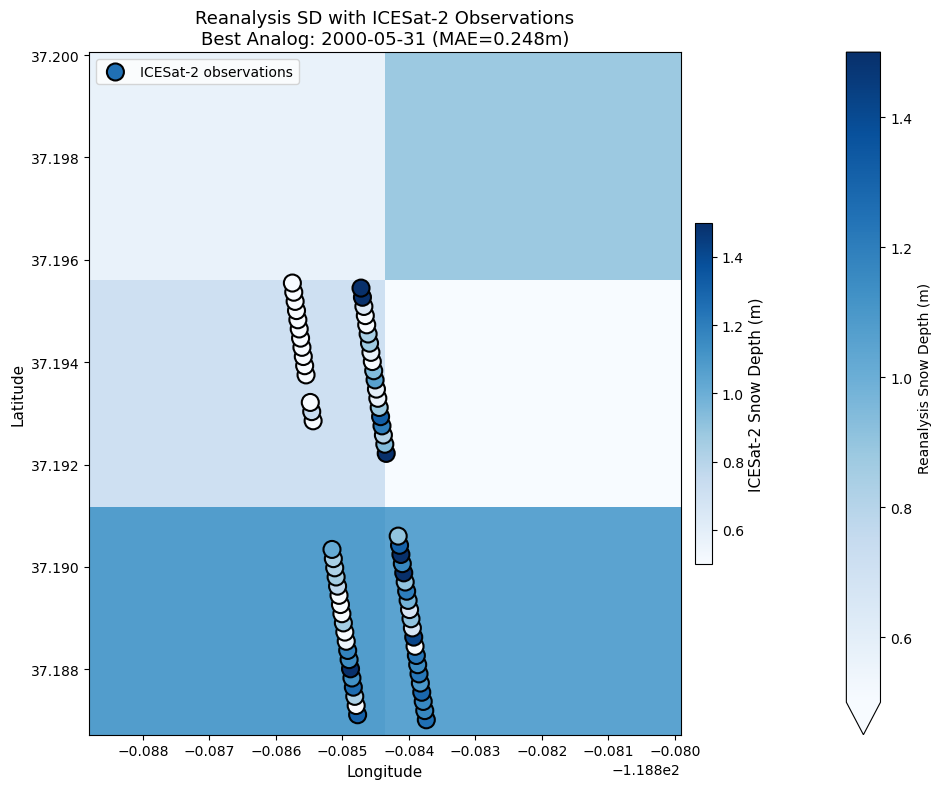

In [81]:
# Plot ICESat-2 observations on top of reanalysis mini data for the best analog date
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the reanalysis background (use the mini SD file for the best analog date)
best_doy = best_date.timetuple().tm_yday
best_year = best_date.year
best_sd_file = f'../data/reanalysis/daily_SD_files_mini/{best_year}/day_{best_doy:03d}.nc'
best_sd = xr.open_dataset(best_sd_file)

# Plot reanalysis as background
im = best_sd['SD_Post'].plot(ax=ax, cmap='Blues', vmin=0.5, vmax=1.5, 
                              cbar_kwargs={'label': 'Reanalysis Snow Depth (m)'})

# Plot ICESat-2 point locations with observed values as colors
lons = atl06sr_gdf_snowy_slope_n_mini.geometry.x.values
lats = atl06sr_gdf_snowy_slope_n_mini.geometry.y.values
icesat2_vals = atl06sr_gdf_snowy_slope_n_mini['icesat2_3dep_dif'].values

scatter = ax.scatter(lons, lats, c=icesat2_vals, cmap='Blues', s=150, 
                     edgecolors='black', linewidth=1.5, vmin=0.5, vmax=1.5,
                     label='ICESat-2 observations')

# Add colorbar for ICESat-2 values
cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.5, pad=0.02)
cbar2.set_label('ICESat-2 Snow Depth (m)', fontsize=11)

ax.set_title(f'Reanalysis SD with ICESat-2 Observations\nBest Analog: {best_date.strftime("%Y-%m-%d")} (MAE={best_mae:.3f}m)', 
             fontsize=13)
ax.set_xlabel('Longitude', fontsize=11)
ax.set_ylabel('Latitude', fontsize=11)
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

best_sd.close()

In [75]:
# Look at sampled values for the best analog date (lowest MAE)
best_idx = int(mae_da.argmin())
best_date = pd.to_datetime(mae_da.time.values[best_idx])
best_mae = float(mae_da.values[best_idx])

print(f"Best analog date: {best_date.strftime('%Y-%m-%d')}")
print(f"MAE: {best_mae:.3f} m\n")

print("Comparison of sampled vs reference values:")
print("-" * 50)
sampled_best = samples_ds['sampled_sd'].isel(time=best_idx).values
for i, (ref, samp) in enumerate(zip(reference_values, sampled_best)):
    diff = samp - ref
    print(f"Point {i}: ICESat-2={ref:.3f}m, Sampled={samp:.3f}m, Diff={diff:+.3f}m")

Best analog date: 2000-05-31
MAE: 0.248 m

Comparison of sampled vs reference values:
--------------------------------------------------
Point 0: ICESat-2=1.252m, Sampled=1.048m, Diff=-0.204m
Point 1: ICESat-2=1.311m, Sampled=1.075m, Diff=-0.236m
Point 2: ICESat-2=1.165m, Sampled=1.048m, Diff=-0.117m
Point 3: ICESat-2=-0.066m, Sampled=1.075m, Diff=+1.141m
Point 4: ICESat-2=1.160m, Sampled=1.048m, Diff=-0.112m
Point 5: ICESat-2=0.834m, Sampled=1.075m, Diff=+0.241m
Point 6: ICESat-2=1.283m, Sampled=1.048m, Diff=-0.235m
Point 7: ICESat-2=1.273m, Sampled=1.075m, Diff=-0.197m
Point 8: ICESat-2=1.095m, Sampled=1.048m, Diff=-0.047m
Point 9: ICESat-2=1.128m, Sampled=1.075m, Diff=-0.053m
Point 10: ICESat-2=1.226m, Sampled=1.048m, Diff=-0.178m
Point 11: ICESat-2=1.516m, Sampled=1.075m, Diff=-0.440m
Point 12: ICESat-2=1.150m, Sampled=1.048m, Diff=-0.102m
Point 13: ICESat-2=1.138m, Sampled=1.075m, Diff=-0.062m
Point 14: ICESat-2=1.225m, Sampled=1.048m, Diff=-0.177m
Point 15: ICESat-2=1.177m, Sampl

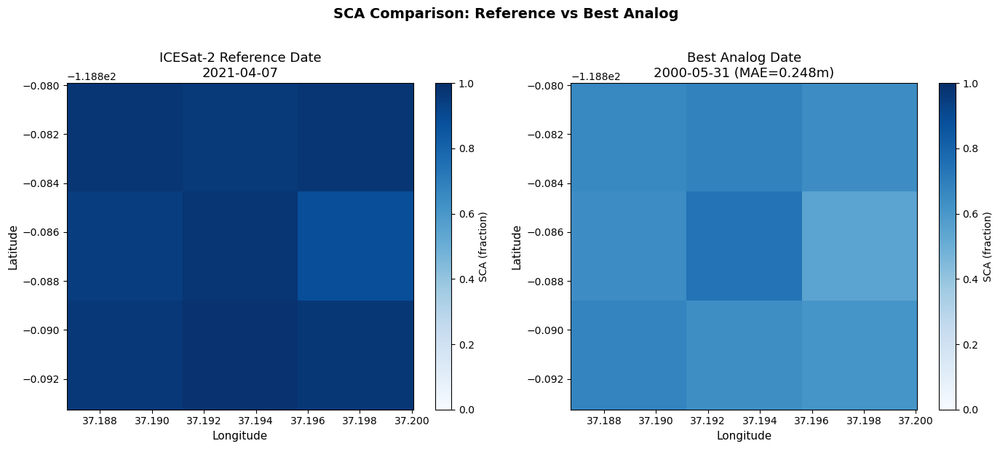

In [83]:
# Compare SCA on best correlated date vs ICESat-2 reference date
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# ICESat-2 reference date (2021-04-07)
ref_date = pd.to_datetime('2021-04-07')
ref_doy = ref_date.timetuple().tm_yday
ref_year = ref_date.year

# Load SCA from yearly files and clip to mini region
# Reference date
ref_sca_yearly = xr.open_dataset(f'../swe_reanalysis_pca/data/download/{ref_year}/SWE_SCA_POST_{ref_year}.nc')
ref_sca_yearly = ref_sca_yearly.rio.write_crs("EPSG:4326", inplace=False)
if 'Latitude' in ref_sca_yearly.coords:
    ref_sca_yearly = ref_sca_yearly.rename({'Latitude': 'y', 'Longitude': 'x'})
ref_sca_clipped = ref_sca_yearly.rio.clip(mini_polygon.geometry, all_touched=True)
ref_sca_day = ref_sca_clipped['SCA_Post'].sel(time=ref_date, method='nearest')

# Best analog date
best_sca_yearly = xr.open_dataset(f'../swe_reanalysis_pca/data/download/{best_year}/SWE_SCA_POST_{best_year}.nc')
best_sca_yearly = best_sca_yearly.rio.write_crs("EPSG:4326", inplace=False)
if 'Latitude' in best_sca_yearly.coords:
    best_sca_yearly = best_sca_yearly.rename({'Latitude': 'y', 'Longitude': 'x'})
best_sca_clipped = best_sca_yearly.rio.clip(mini_polygon.geometry, all_touched=True)
best_sca_day = best_sca_clipped['SCA_Post'].sel(time=best_date, method='nearest')

# Plot reference date SCA
ref_sca_day.plot(ax=axes[0], cmap='Blues', vmin=0, vmax=1, 
                 cbar_kwargs={'label': 'SCA (fraction)'})
axes[0].set_title(f'ICESat-2 Reference Date\n{ref_date.strftime("%Y-%m-%d")}', fontsize=13)
axes[0].set_xlabel('Longitude', fontsize=11)
axes[0].set_ylabel('Latitude', fontsize=11)

# Plot best analog date SCA
best_sca_day.plot(ax=axes[1], cmap='Blues', vmin=0, vmax=1, 
                  cbar_kwargs={'label': 'SCA (fraction)'})
axes[1].set_title(f'Best Analog Date\n{best_date.strftime("%Y-%m-%d")} (MAE={best_mae:.3f}m)', fontsize=13)
axes[1].set_xlabel('Longitude', fontsize=11)
axes[1].set_ylabel('Latitude', fontsize=11)

plt.suptitle('SCA Comparison: Reference vs Best Analog', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

ref_sca_yearly.close()
best_sca_yearly.close()

In [43]:
# Step 2: Calculate MAE using daily files for the mini region:
calculate_snow_depth_mae_from_daily(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n_mini,
    daily_files_base_dir='../data/reanalysis/daily_SD_files_mini',
    output_base_dir='../data/reanalysis/sd_mae_mini',
    variable='SD_Post',
    start_month=3,
    end_month=5
)

Found 1 reference dates (March-May)
Found 3404 daily files (March-May, all years)

Processing 2021-04-07...
  73 points, comparing against 3403 dates
  ✓ Saved: 3312 comparison dates

All MAE calculations complete!


In [69]:
mae_values, sampled_reanalysis = calculate_snow_depth_mae_from_daily_save_samples(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n_mini,
    daily_files_base_dir='../data/reanalysis/daily_SD_files_mini',
    output_base_dir='../data/reanalysis/sd_mae_mini',
    variable='SD_Post',
    start_month=3,
    end_month=5
    )

Found 1 reference dates (March-May)
Found 3404 daily files (March-May, all years)
✓ 2021-04-07: already processed, skipping


UnboundLocalError: cannot access local variable 'result' where it is not associated with a value

In [31]:
# Calculate SWE metrics (MAE and volume % error) using daily files for the mini region:
calculate_swe_metrics_from_daily(
    atl06sr_gdf=atl06sr_gdf_snowy_slope_n,
    daily_files_base_dir='../data/reanalysis/daily_SWE_files_mini',
    output_base_dir='../data/reanalysis/swe_metrics_mini',
    variable='SWE_Post',
    start_month=3,
    end_month=5
)

Found 50 dates of interest (March 1 - May 31)
Found 3404 total daily files (March 1 - May 31)
Processing 2019-03-04...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-03-08...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-03-09...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-03-12...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-03-16...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-03-17...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-03-21...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-04-06...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-04-10...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-04-11...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-04-14...
  ✓ Saved: 3312 comparisons (MAE + volume % error)
Processing 2019-04-15...
  ✓ Saved: 3312 comparisons (MAE + volume % e

In [38]:
# Check current SD daily file structure for both full and mini regions
sd_full = xr.open_dataset('../data/reanalysis/daily_SD_files/2021/day_091.nc')
print("Full region SD daily file structure:")
print(sd_full)
sd_full.close()

print("\n" + "="*60 + "\n")

sd_mini = xr.open_dataset('../data/reanalysis/daily_SD_files_mini/2021/day_091.nc')
print("Mini region SD daily file structure:")
print(sd_mini)
sd_mini.close()

Full region SD daily file structure:
<xarray.Dataset> Size: 5MB
Dimensions:      (y: 1267, x: 919)
Coordinates:
  * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
  * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    time         datetime64[ns] 8B ...
    spatial_ref  int64 8B ...
Data variables:
    SD_Post      (y, x) float32 5MB ...


Mini region SD daily file structure:
<xarray.Dataset> Size: 40B
Dimensions:      (space: 6)
Coordinates:
    time         datetime64[ns] 8B ...
    spatial_ref  int64 8B ...
Dimensions without coordinates: space
Data variables:
    SD_Post      (space) float32 24B ...


### Now explore whether the results are what we expect:  
* note that the snow depth sampling was done differently for the mini region, using kd-tree instead of .sel()

In [50]:
sd_example_mini_kd = xr.open_dataset('../data/reanalysis/sd_mae_mini_kdtree/sd_mae_2021-04-07.nc')
sd_example_mini = xr.open_dataset('../data/reanalysis/sd_mae_mini/sd_mae_2021-04-07.nc')

In [57]:
sd_example_mini_kd.median_absolute_error.values

array([0.88491702, 1.05958744, 1.30541838, ..., 0.80752742, 1.14383674,
       0.84334147], shape=(3312,))

In [58]:
sd_example_mini.median_absolute_error.values

array([0.88329022, 0.39016324, 0.47483072, ..., 0.7756545 , 1.12742113,
       0.81865449], shape=(3312,))

In [59]:
yearly_sd_2021 = xr.open_dataset('../swe_reanalysis_pca/data/download/2021/SD_POST_2021.nc')

In [60]:
reanalysis_mini = yearly_sd_2021.SD_Post.sel(time='2021-04-07').rio.clip(region_gdf.geometry, all_touched=True)

<Axes: title={'center': 'time = 2021-04-07, spatial_ref = 0'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>

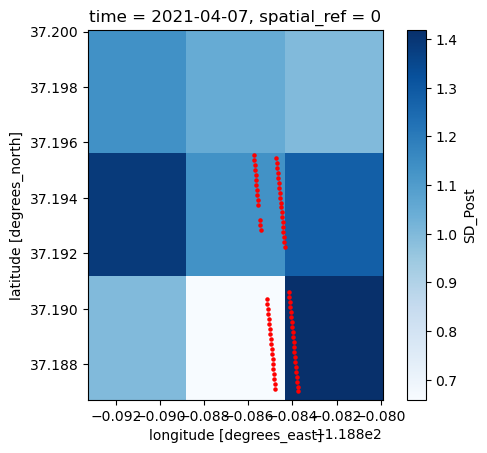

In [65]:
fig, ax = plt.subplots()
reanalysis_mini.plot(ax=ax, cmap='Blues')
atl06sr_gdf_snowy_slope_n_mini.plot(ax=ax, color='red', markersize=5)

In [ ]:
# first function: loads a yearly file; clips to the polygon (mini or sierras); saves each day separately; 
# final product is a 1d array of the values of the SWE or fSCA values in each pixel
# final productis a 2d array of the values of the SD in each pixel

# second funtion (for sd): for each date in the icesat2 gdf, sample each daily file at the icesat2 points; calculate mae between sampled values and icesat2; 
# results in an array with a single value of mae for each date in the icesat2 gdf 

In [48]:
mae_example_03042019 = xr.open_dataarray('../data/reanalysis/sd_mae/sd_mae_2019-03-04.nc')

In [49]:
# Add water year to the correlation data
# Water year runs Oct 1 - Sep 30, named by ending year
# For March-May dates, water year = current year (since Oct-Sep period)
def get_water_year(date):
    if date.month >= 10:
        return date.year + 1
    else:
        return date.year

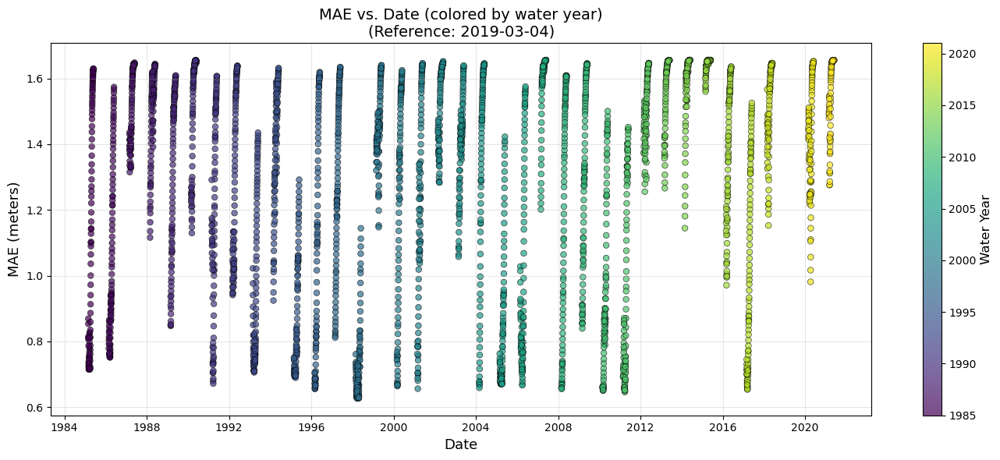

In [50]:
# Timeseries plot with water year coloring
mae_df = pd.DataFrame({
    'mae': mae_example_03042019.values,
    'date': pd.to_datetime(mae_example_03042019.time.values)
})
mae_df['water_year'] = mae_df['date'].apply(get_water_year)

fig, ax = plt.subplots(figsize=(14, 6))
scatter = ax.scatter(mae_df['date'], mae_df['mae'], 
                     c=mae_df['water_year'], cmap='viridis', 
                     alpha=0.7, s=30, edgecolors='black', linewidth=0.5)

ax.set_xlabel('Date', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE vs. Date (colored by water year)\n(Reference: {mae_example_03042019.attrs["reference_date"]})', fontsize=14)
ax.grid(alpha=0.3)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Water Year', fontsize=12)
plt.tight_layout()
plt.show()

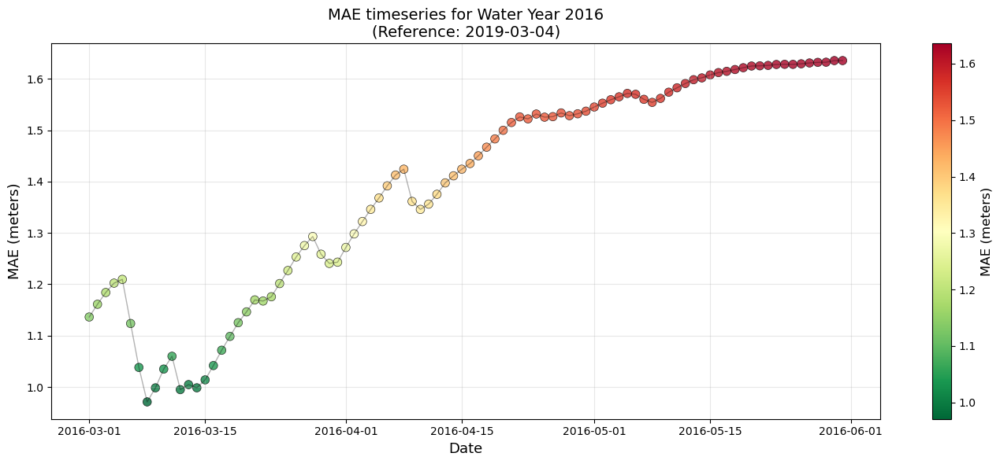

In [51]:
# Focus on one water year
mae_2016 = mae_df[mae_df['water_year'] == 2016].copy().sort_values('date')

fig, ax = plt.subplots(figsize=(14, 6))
ax.scatter(mae_2016['date'], mae_2016['mae'], 
           c=mae_2016['mae'], cmap='RdYlGn_r',  # Red=high error, green=low error
           s=60, alpha=0.8, edgecolors='black', linewidth=0.5)
ax.plot(mae_2016['date'], mae_2016['mae'], 'k-', alpha=0.3, linewidth=1)

ax.set_xlabel('Date', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE timeseries for Water Year 2016\n(Reference: {mae_example_03042019.attrs["reference_date"]})', fontsize=14)
ax.grid(alpha=0.3)

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', 
                           norm=plt.Normalize(vmin=mae_2016['mae'].min(), 
                                             vmax=mae_2016['mae'].max()))
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('MAE (meters)', fontsize=12)
plt.tight_layout()
plt.show()

In [52]:
mae_example_04112021 = xr.open_dataarray('../data/reanalysis/sd_mae/sd_mae_2021-04-11.nc')

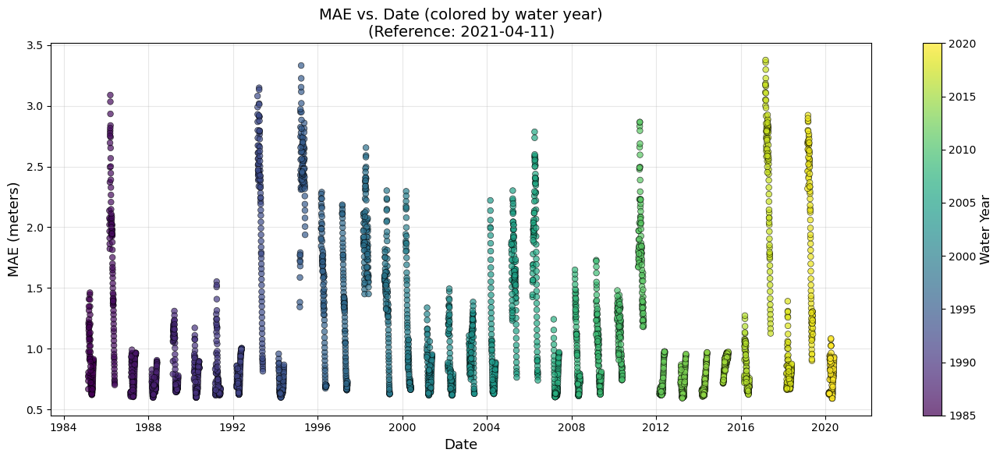

In [53]:
# Timeseries plot with water year coloring
mae_df = pd.DataFrame({
    'mae': mae_example_04112021.values,
    'date': pd.to_datetime(mae_example_04112021.time.values)
})
mae_df['water_year'] = mae_df['date'].apply(get_water_year)

fig, ax = plt.subplots(figsize=(14, 6))
scatter = ax.scatter(mae_df['date'], mae_df['mae'], 
                     c=mae_df['water_year'], cmap='viridis', 
                     alpha=0.7, s=30, edgecolors='black', linewidth=0.5)

ax.set_xlabel('Date', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE vs. Date (colored by water year)\n(Reference: {mae_example_04112021.attrs["reference_date"]})', fontsize=14)
ax.grid(alpha=0.3)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Water Year', fontsize=12)
plt.tight_layout()
plt.show()

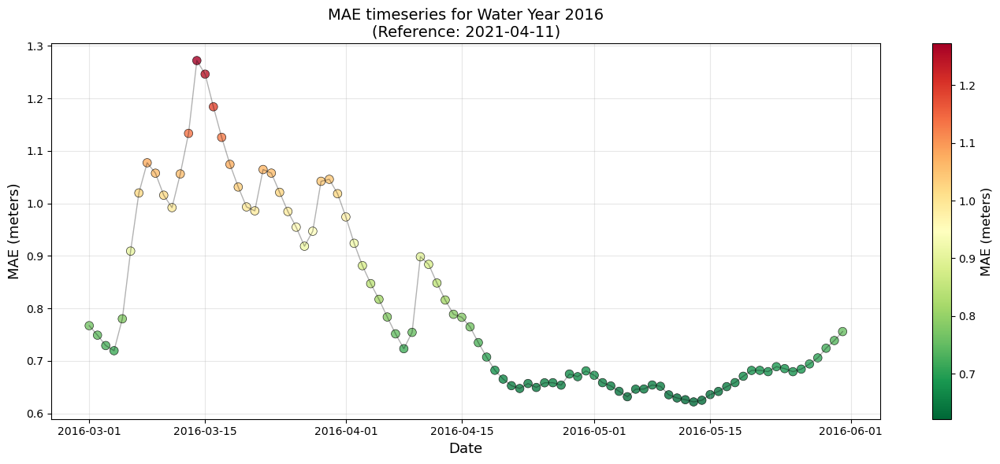

In [54]:
# Focus on one water year
mae_2016 = mae_df[mae_df['water_year'] == 2016].copy().sort_values('date')

fig, ax = plt.subplots(figsize=(14, 6))
ax.scatter(mae_2016['date'], mae_2016['mae'], 
           c=mae_2016['mae'], cmap='RdYlGn_r',  # Red=high error, green=low error
           s=60, alpha=0.8, edgecolors='black', linewidth=0.5)
ax.plot(mae_2016['date'], mae_2016['mae'], 'k-', alpha=0.3, linewidth=1)

ax.set_xlabel('Date', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE timeseries for Water Year 2016\n(Reference: {mae_example_04112021.attrs["reference_date"]})', fontsize=14)
ax.grid(alpha=0.3)

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', 
                           norm=plt.Normalize(vmin=mae_2016['mae'].min(), 
                                             vmax=mae_2016['mae'].max()))
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('MAE (meters)', fontsize=12)
plt.tight_layout()
plt.show()

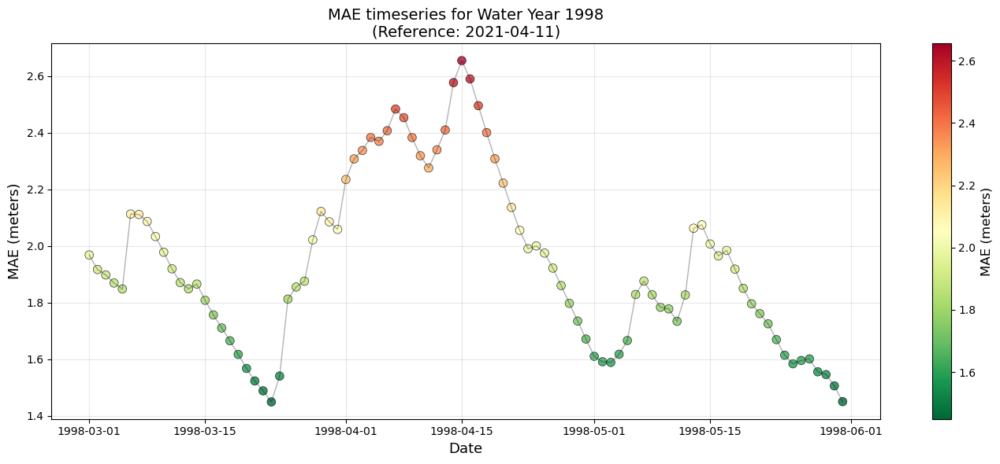

In [55]:
# Focus on one water year
mae_1998 = mae_df[mae_df['water_year'] == 1998].copy().sort_values('date')

fig, ax = plt.subplots(figsize=(14, 6))
ax.scatter(mae_1998['date'], mae_1998['mae'], 
           c=mae_1998['mae'], cmap='RdYlGn_r',  # Red=high error, green=low error
           s=60, alpha=0.8, edgecolors='black', linewidth=0.5)
ax.plot(mae_1998['date'], mae_1998['mae'], 'k-', alpha=0.3, linewidth=1)

ax.set_xlabel('Date', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE timeseries for Water Year 1998\n(Reference: {mae_example_04112021.attrs["reference_date"]})', fontsize=14)
ax.grid(alpha=0.3)

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', 
                           norm=plt.Normalize(vmin=mae_1998['mae'].min(), 
                                             vmax=mae_1998['mae'].max()))
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('MAE (meters)', fontsize=12)
plt.tight_layout()
plt.show()

In [56]:
corr_example = xr.open_dataarray('../data/reanalysis/fsca_correlation/correlation_2019-03-16.nc')

In [57]:
# Add water year to the correlation data
# Water year runs Oct 1 - Sep 30, named by ending year
# For March-May dates, water year = current year (since Oct-Sep period)
def get_water_year(date):
    if date.month >= 10:
        return date.year + 1
    else:
        return date.year

In [58]:


# Convert to DataFrame for easier plotting
import pandas as pd
corr_df = pd.DataFrame({
    'correlation': corr_example.values,
    'date': pd.to_datetime(corr_example.time.values)
})
corr_df['water_year'] = corr_df['date'].apply(get_water_year)

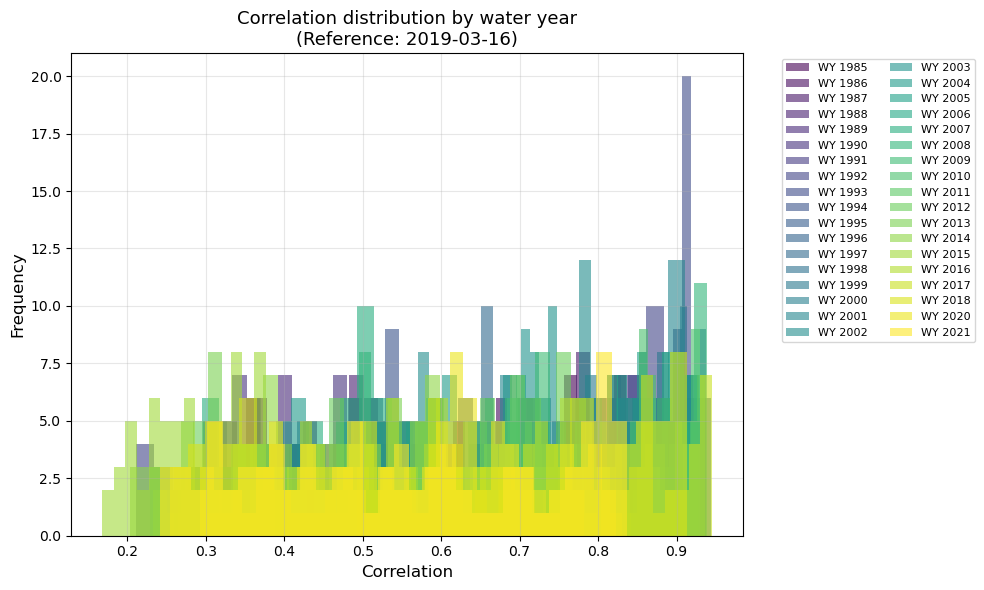

In [60]:
# Histogram colored by water year
fig, ax = plt.subplots(figsize=(10, 6))

# Get unique water years and create colormap
water_years = sorted(corr_df['water_year'].unique())
colors = plt.cm.viridis(np.linspace(0, 1, len(water_years)))

# Plot histogram with different colors for each water year
for i, wy in enumerate(water_years):
    data = corr_df[corr_df['water_year'] == wy]['correlation']
    ax.hist(data, bins=30, alpha=0.6, label=f'WY {wy}', color=colors[i])

ax.set_xlabel('Correlation', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.set_title(f'Correlation distribution by water year\n(Reference: {corr_example.attrs["reference_date"]})', fontsize=13)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

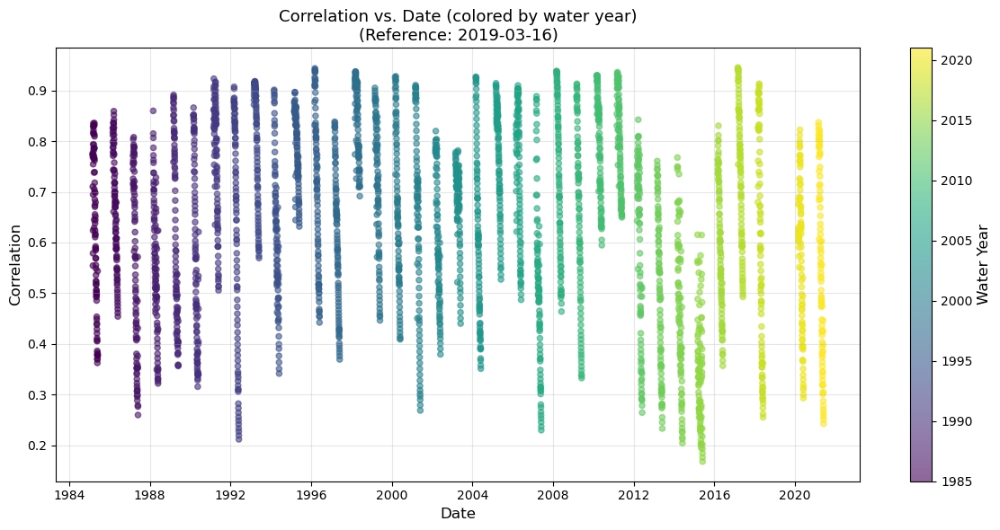

In [62]:
# Scatter plot: correlation vs. date, colored by water year
fig, ax = plt.subplots(figsize=(12, 6))

# Create scatter with color based on water year
scatter = ax.scatter(corr_df['date'], corr_df['correlation'], 
                     c=corr_df['water_year'], cmap='viridis', 
                     alpha=0.6, s=20)

ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Correlation', fontsize=12)
ax.set_title(f'Correlation vs. Date (colored by water year)\n(Reference: {corr_example.attrs["reference_date"]})', fontsize=13)
ax.grid(alpha=0.3)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Water Year', fontsize=12)

plt.tight_layout()
plt.show()

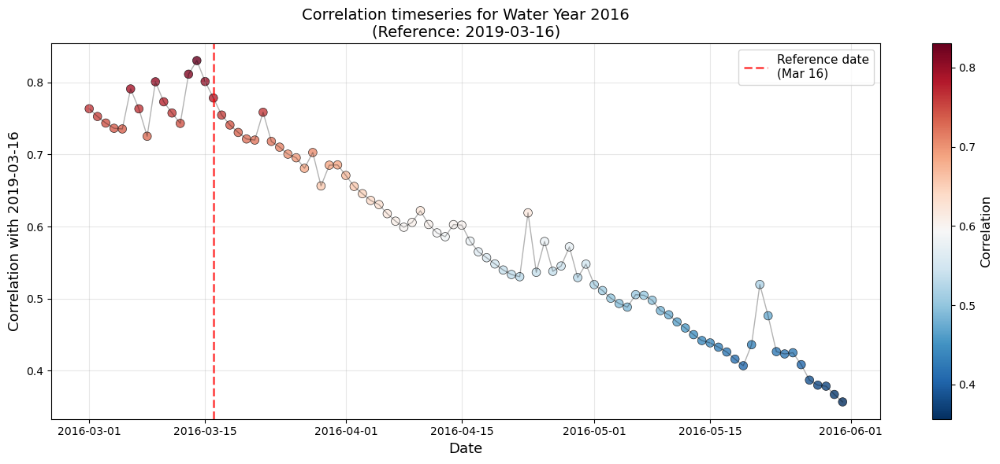

In [63]:
# Filter corr_example (March 16) to just water year 2016 data
corr_2016_mar = corr_df[corr_df['water_year'] == 2016].copy()
corr_2016_mar = corr_2016_mar.sort_values('date')

# Timeseries scatter plot for 2016
fig, ax = plt.subplots(figsize=(14, 6))

ax.scatter(corr_2016_mar['date'], corr_2016_mar['correlation'], 
           c=corr_2016_mar['correlation'], cmap='RdBu_r', 
           s=60, alpha=0.8, edgecolors='black', linewidth=0.5)

# Add line connecting points
ax.plot(corr_2016_mar['date'], corr_2016_mar['correlation'], 
        'k-', alpha=0.3, linewidth=1, zorder=1)

# Add vertical line for reference date (same day/month in 2016)
ref_date_str_mar = corr_example.attrs["reference_date"]  # '2019-03-16'
ref_date_2019_mar = pd.to_datetime(ref_date_str_mar)
ref_date_2016_mar = ref_date_2019_mar.replace(year=2016)  # March 16, 2016
ax.axvline(ref_date_2016_mar, color='red', linestyle='--', linewidth=2, 
           label=f'Reference date\n({ref_date_2019_mar.strftime("%b %d")})', alpha=0.7)

ax.set_xlabel('Date', fontsize=13)
ax.set_ylabel(f'Correlation with {ref_date_str_mar}', fontsize=13)
ax.set_title(f'Correlation timeseries for Water Year 2016\n(Reference: {ref_date_str_mar})', fontsize=14)
ax.legend(fontsize=11)
ax.grid(alpha=0.3, zorder=0)

# Add colorbar
sm = plt.cm.ScalarMappable(cmap='RdBu_r', 
                           norm=plt.Normalize(vmin=corr_2016_mar['correlation'].min(), 
                                             vmax=corr_2016_mar['correlation'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Correlation', fontsize=12)

plt.tight_layout()
plt.show()

### Compare top 10 analog dates: Correlation vs MAE

In [3]:
# Load correlation, MAE, and SWE metrics from the same reference date
ref_date = '2019-03-16'
corr = xr.open_dataarray(f'../data/reanalysis/fsca_correlation/correlation_{ref_date}.nc')
mae = xr.open_dataarray(f'../data/reanalysis/sd_mae/sd_mae_{ref_date}.nc')
swe_metrics = xr.open_dataset(f'../data/reanalysis/swe_metrics/swe_metrics_{ref_date}.nc')

# Align the datasets (ensure same dates)
# Convert to DataFrames
corr_df = pd.DataFrame({
    'date': pd.to_datetime(corr.time.values),
    'correlation': corr.values
})

mae_df = pd.DataFrame({
    'date': pd.to_datetime(mae.time.values),
    'mae': mae.values
})

swe_df = pd.DataFrame({
    'date': pd.to_datetime(swe_metrics.time.values),
    'swe_mae': swe_metrics['mae'].values,
    'volume_pct_error': swe_metrics['volume_pct_error'].values
})

# Merge on date
combined = corr_df.merge(mae_df, on='date', how='inner')
combined = combined.merge(swe_df, on='date', how='inner')

# Get top 10 by correlation (highest)
top_corr = combined.nlargest(10, 'correlation').copy()
top_corr['rank_corr'] = range(1, 11)

# Get top 10 by MAE (lowest)
top_mae = combined.nsmallest(10, 'mae').copy()
top_mae['rank_mae'] = range(1, 11)

print(f"Reference date: {ref_date}")
print(f"\nTop 10 by correlation:")
print(top_corr[['date', 'correlation', 'mae', 'volume_pct_error']].to_string(index=False))
print(f"\nTop 10 by MAE (lowest error):")
print(top_mae[['date', 'correlation', 'mae', 'volume_pct_error']].to_string(index=False))

Reference date: 2019-03-16

Top 10 by correlation:
      date  correlation      mae  volume_pct_error
2017-03-01     0.945463 0.831840          9.629807
2017-03-02     0.943744 0.809863          9.233086
1996-03-08     0.943718 0.622529        -20.441013
2017-03-03     0.941159 0.785601          8.690418
2017-03-04     0.941033 0.770346          8.218680
1996-03-09     0.940982 0.621063        -21.425018
2017-03-09     0.940779 0.850908         12.414706
1996-03-07     0.939996 0.623019        -19.786831
1996-03-12     0.939013 0.627000        -21.100731
2008-03-03     0.938163 0.634376        -17.804865

Top 10 by MAE (lowest error):
      date  correlation      mae  volume_pct_error
2011-03-15     0.913450 0.594584        -24.204746
2011-03-13     0.926926 0.597160        -23.830086
2011-03-16     0.912124 0.599194        -23.415668
2011-03-14     0.923602 0.599727        -23.718479
2011-03-17     0.903914 0.604233        -22.567394
2011-03-12     0.931380 0.604878        -23.276199


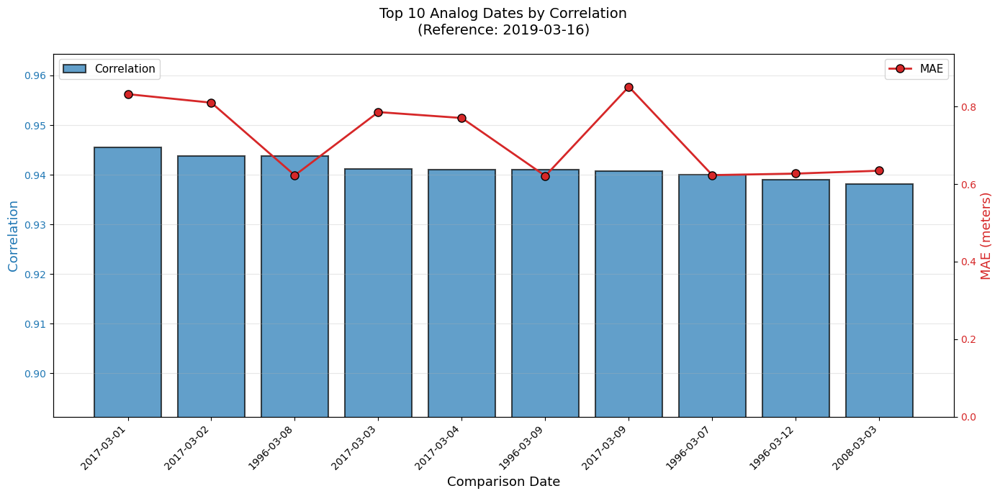

In [76]:
# Dual-axis plot: Top 10 by correlation
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot correlation on left axis
color1 = 'tab:blue'
ax1.set_xlabel('Comparison Date', fontsize=13)
ax1.set_ylabel('Correlation', fontsize=13, color=color1)
bars1 = ax1.bar(range(10), top_corr['correlation'], alpha=0.7, color=color1, 
                label='Correlation', edgecolor='black', linewidth=1.5)
ax1.tick_params(axis='y', labelcolor=color1)
ax1.set_ylim([top_corr['correlation'].min() * 0.95, top_corr['correlation'].max() * 1.02])

# Plot MAE on right axis
ax2 = ax1.twinx()
color2 = 'tab:red'
ax2.set_ylabel('MAE (meters)', fontsize=13, color=color2)
line2 = ax2.plot(range(10), top_corr['mae'], 'o-', color=color2, 
                 linewidth=2, markersize=8, label='MAE', markeredgecolor='black')
ax2.tick_params(axis='y', labelcolor=color2)
ax2.set_ylim([0, top_corr['mae'].max() * 1.1])

# Set x-axis labels
date_labels = [d.strftime('%Y-%m-%d') for d in top_corr['date']]
ax1.set_xticks(range(10))
ax1.set_xticklabels(date_labels, rotation=45, ha='right')

# Add title and legend
ax1.set_title(f'Top 10 Analog Dates by Correlation\n(Reference: {ref_date})', fontsize=14, pad=20)
ax1.legend(loc='upper left', fontsize=11)
ax2.legend(loc='upper right', fontsize=11)

ax1.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

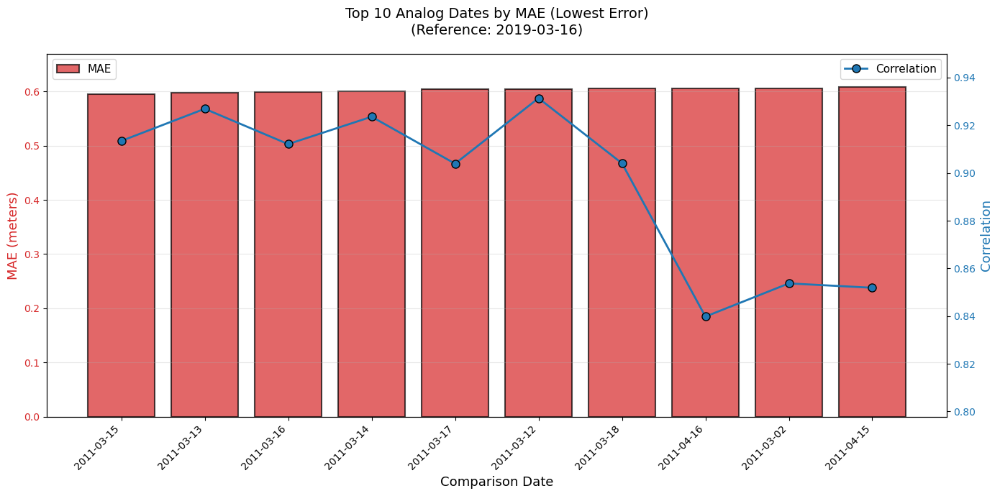

In [77]:
# Dual-axis plot: Top 10 by MAE (lowest error)
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot MAE on left axis
color1 = 'tab:red'
ax1.set_xlabel('Comparison Date', fontsize=13)
ax1.set_ylabel('MAE (meters)', fontsize=13, color=color1)
bars1 = ax1.bar(range(10), top_mae['mae'], alpha=0.7, color=color1, 
                label='MAE', edgecolor='black', linewidth=1.5)
ax1.tick_params(axis='y', labelcolor=color1)
ax1.set_ylim([0, top_mae['mae'].max() * 1.1])

# Plot correlation on right axis
ax2 = ax1.twinx()
color2 = 'tab:blue'
ax2.set_ylabel('Correlation', fontsize=13, color=color2)
line2 = ax2.plot(range(10), top_mae['correlation'], 'o-', color=color2, 
                 linewidth=2, markersize=8, label='Correlation', markeredgecolor='black')
ax2.tick_params(axis='y', labelcolor=color2)
ax2.set_ylim([top_mae['correlation'].min() * 0.95, top_mae['correlation'].max() * 1.02])

# Set x-axis labels
date_labels = [d.strftime('%Y-%m-%d') for d in top_mae['date']]
ax1.set_xticks(range(10))
ax1.set_xticklabels(date_labels, rotation=45, ha='right')

# Add title and legend
ax1.set_title(f'Top 10 Analog Dates by MAE (Lowest Error)\n(Reference: {ref_date})', fontsize=14, pad=20)
ax1.legend(loc='upper left', fontsize=11)
ax2.legend(loc='upper right', fontsize=11)

ax1.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

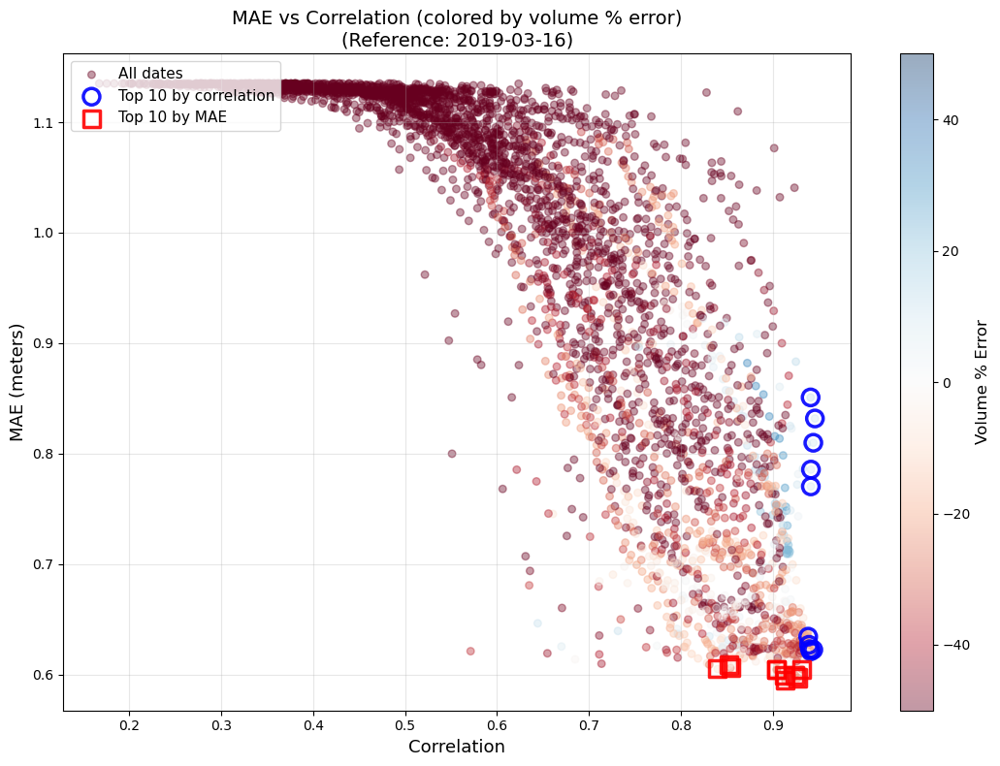


Number of dates in both top 10 lists: 0


In [89]:
# Scatter plot: MAE vs Correlation with volume % error as color
fig, ax = plt.subplots(figsize=(11, 8))

# All dates with volume % error as color
scatter_all = ax.scatter(combined['correlation'], combined['mae'], 
                         c=combined['volume_pct_error'], cmap='RdBu',
                         alpha=0.4, s=30, vmin=-50, vmax=50,
                         label='All dates')

# Highlight top 10 by correlation
ax.scatter(top_corr['correlation'], top_corr['mae'], 
           alpha=0.9, s=150, edgecolors='blue', facecolors='none',
           linewidth=2.5, label='Top 10 by correlation', zorder=5)

# Highlight top 10 by MAE
ax.scatter(top_mae['correlation'], top_mae['mae'], 
           alpha=0.9, s=150, edgecolors='red', facecolors='none',
           linewidth=2.5, label='Top 10 by MAE', marker='s', zorder=5)

# Annotate overlap (dates in both top 10 lists)
overlap = set(top_corr['date']).intersection(set(top_mae['date']))
if overlap:
    overlap_data = combined[combined['date'].isin(overlap)]
    ax.scatter(overlap_data['correlation'], overlap_data['mae'], 
               alpha=0.9, s=200, edgecolors='green', facecolors='none',
               linewidth=3, label=f'Overlap ({len(overlap)})', marker='*', zorder=10)

ax.set_xlabel('Correlation', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE vs Correlation (colored by volume % error)\n(Reference: {ref_date})', fontsize=14)
ax.legend(fontsize=11, loc='upper left')
ax.grid(alpha=0.3)

# Add colorbar for volume % error
cbar = plt.colorbar(scatter_all, ax=ax, label='Volume % Error')
cbar.set_label('Volume % Error', fontsize=12)

plt.tight_layout()
plt.show()

print(f"\nNumber of dates in both top 10 lists: {len(overlap)}")
if overlap:
    print("Dates in both lists:")
    for d in sorted(overlap):
        row = combined[combined['date'] == d].iloc[0]
        print(f"  {d.strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")

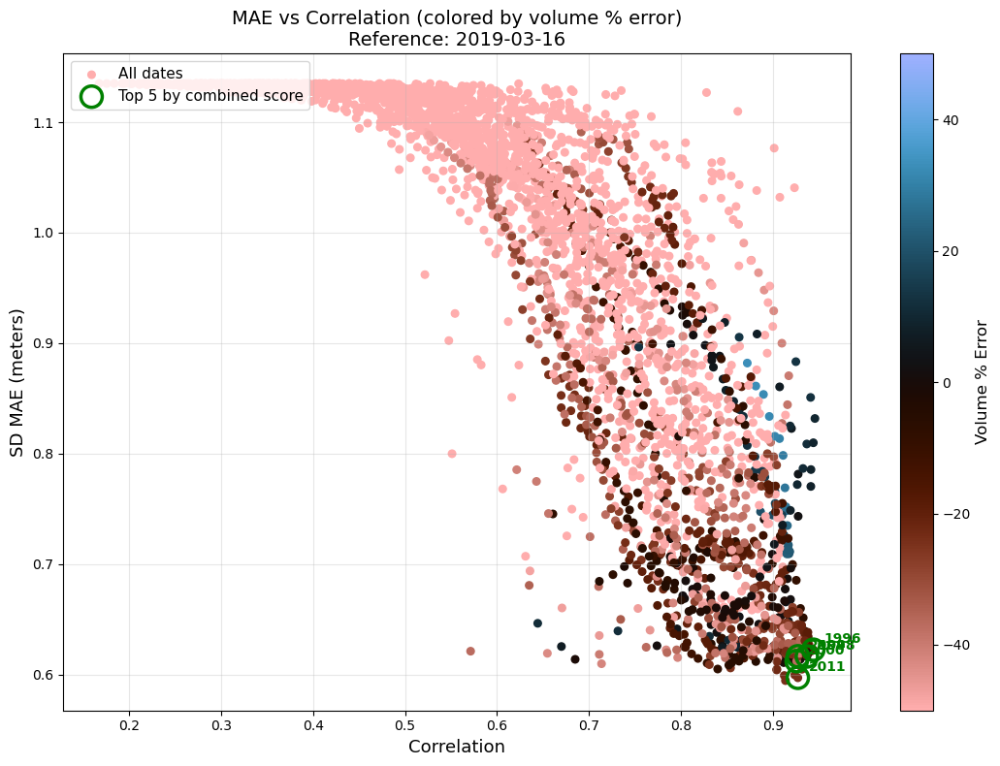


Reference: 2019-03-16 - Top 5 analogs by combined score (one per year):
  1. 2011-03-13 - Corr: 0.927, MAE: 0.597m, Vol%: -23.8%
  2. 1998-03-13 - Corr: 0.937, MAE: 0.616m, Vol%: -1.3%
  3. 1996-03-08 - Corr: 0.944, MAE: 0.623m, Vol%: -20.4%
  4. 2000-03-03 - Corr: 0.926, MAE: 0.612m, Vol%: -37.3%
  5. 2004-03-01 - Corr: 0.927, MAE: 0.617m, Vol%: -25.4%



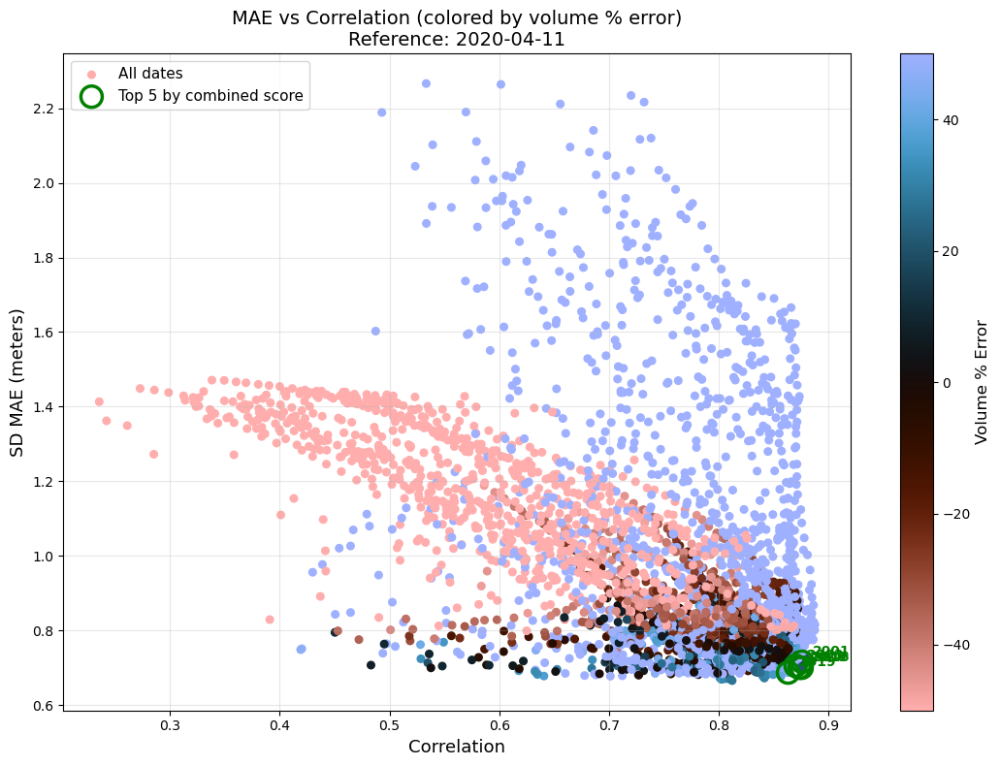


Reference: 2020-04-11 - Top 5 analogs by combined score (one per year):
  1. 2016-03-27 - Corr: 0.875, MAE: 0.700m, Vol%: 21.4%
  2. 2000-04-06 - Corr: 0.873, MAE: 0.700m, Vol%: 41.7%
  3. 2001-04-23 - Corr: 0.876, MAE: 0.716m, Vol%: -0.6%
  4. 2019-05-10 - Corr: 0.863, MAE: 0.687m, Vol%: 42.8%
  5. 2003-03-24 - Corr: 0.870, MAE: 0.705m, Vol%: 15.8%



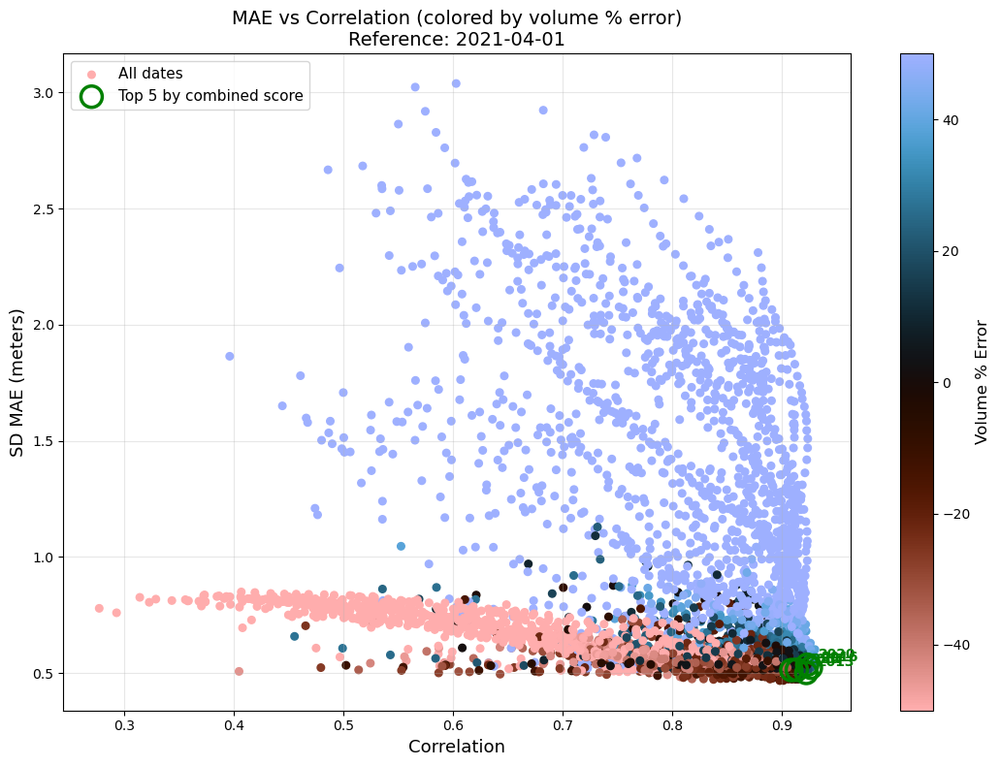


Reference: 2021-04-01 - Top 5 analogs by combined score (one per year):
  1. 2013-03-19 - Corr: 0.922, MAE: 0.500m, Vol%: -5.0%
  2. 2016-04-05 - Corr: 0.926, MAE: 0.523m, Vol%: 23.5%
  3. 2020-04-04 - Corr: 0.923, MAE: 0.535m, Vol%: -4.5%
  4. 2007-03-16 - Corr: 0.914, MAE: 0.514m, Vol%: -16.3%
  5. 1988-03-22 - Corr: 0.909, MAE: 0.512m, Vol%: -5.4%



In [17]:
# MAE vs Correlation plots for all 3 highlight dates with top 5 by combined score circled
ref_dates = ['2019-03-16', '2020-04-11', '2021-04-01']

for ref_date in ref_dates:
    # Load data for this reference date
    corr = xr.open_dataarray(f'../data/reanalysis/fsca_correlation/correlation_{ref_date}.nc')
    mae = xr.open_dataarray(f'../data/reanalysis/sd_mae/sd_mae_{ref_date}.nc')
    swe_metrics = xr.open_dataset(f'../data/reanalysis/swe_metrics/swe_metrics_{ref_date}.nc')
    
    # Convert to DataFrames
    corr_df = pd.DataFrame({
        'date': pd.to_datetime(corr.time.values),
        'correlation': corr.values
    })
    
    mae_df = pd.DataFrame({
        'date': pd.to_datetime(mae.time.values),
        'mae': mae.values
    })
    
    swe_df = pd.DataFrame({
        'date': pd.to_datetime(swe_metrics.time.values),
        'swe_mae': swe_metrics['mae'].values,
        'volume_pct_error': swe_metrics['volume_pct_error'].values
    })
    
    # Merge on date
    combined = corr_df.merge(mae_df, on='date', how='inner')
    combined = combined.merge(swe_df, on='date', how='inner')
    
    # Calculate combined score
    combined['corr_norm'] = (combined['correlation'] - combined['correlation'].min()) / (combined['correlation'].max() - combined['correlation'].min())
    combined['mae_norm'] = 1 - (combined['mae'] - combined['mae'].min()) / (combined['mae'].max() - combined['mae'].min())
    combined['combined_score'] = (combined['corr_norm'] + combined['mae_norm']) / 2
    combined['year'] = combined['date'].dt.year
    
    # Get best analog from each year (by combined score)
    best_per_year = combined.loc[combined.groupby('year')['combined_score'].idxmax()].copy()
    
    # Get top 5 years by combined score
    top5_combined = best_per_year.nlargest(5, 'combined_score').copy()
    
    # Create scatter plot
    fig, ax = plt.subplots(figsize=(11, 8))
    
    # All dates with volume % error as color
    scatter_all = ax.scatter(combined['correlation'], combined['mae'], 
                             c=combined['volume_pct_error'], cmap='berlin_r',
                             s=30, vmin=-50, vmax=50,
                             label='All dates')
    
    # Circle top 5 by combined score (green circles)
    ax.scatter(top5_combined['correlation'], top5_combined['mae'], 
               s=250, facecolors='none', edgecolors='green', 
               linewidth=2.5, label='Top 5 by combined score', zorder=5)
    
    # Annotate top 5 with year
    for idx, row in top5_combined.iterrows():
        ax.annotate(str(row['year']), 
                    (row['correlation'], row['mae']),
                    textcoords='offset points', xytext=(8, 5),
                    fontsize=10, fontweight='bold', color='green')
    
    ax.set_xlabel('Correlation', fontsize=13)
    ax.set_ylabel('SD MAE (meters)', fontsize=13)
    ax.set_title(f'MAE vs Correlation (colored by volume % error)\nReference: {ref_date}', fontsize=14)
    ax.legend(fontsize=11, loc='upper left')
    ax.grid(alpha=0.3)
    
    # Add colorbar for volume % error
    cbar = plt.colorbar(scatter_all, ax=ax, label='Volume % Error')
    cbar.set_label('Volume % Error', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    # Print top 5 info
    print(f"\nReference: {ref_date} - Top 5 analogs by combined score (one per year):")
    for i, (idx, row) in enumerate(top5_combined.iterrows(), 1):
        print(f"  {i}. {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")
    print()
    
    # Close files
    corr.close()
    mae.close()
    swe_metrics.close()

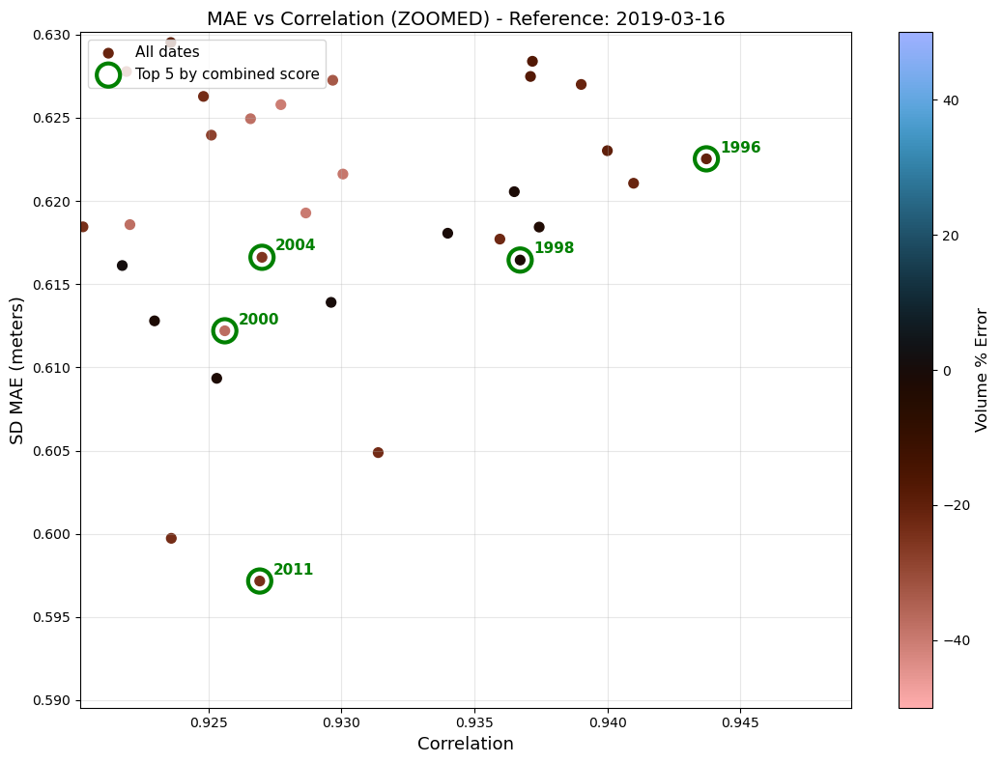


Reference: 2019-03-16 - Top 5 analogs by combined score (one per year):
  1. 2011-03-13 - Corr: 0.927, MAE: 0.597m, Vol%: -23.8%
  2. 1998-03-13 - Corr: 0.937, MAE: 0.616m, Vol%: -1.3%
  3. 1996-03-08 - Corr: 0.944, MAE: 0.623m, Vol%: -20.4%
  4. 2000-03-03 - Corr: 0.926, MAE: 0.612m, Vol%: -37.3%
  5. 2004-03-01 - Corr: 0.927, MAE: 0.617m, Vol%: -25.4%



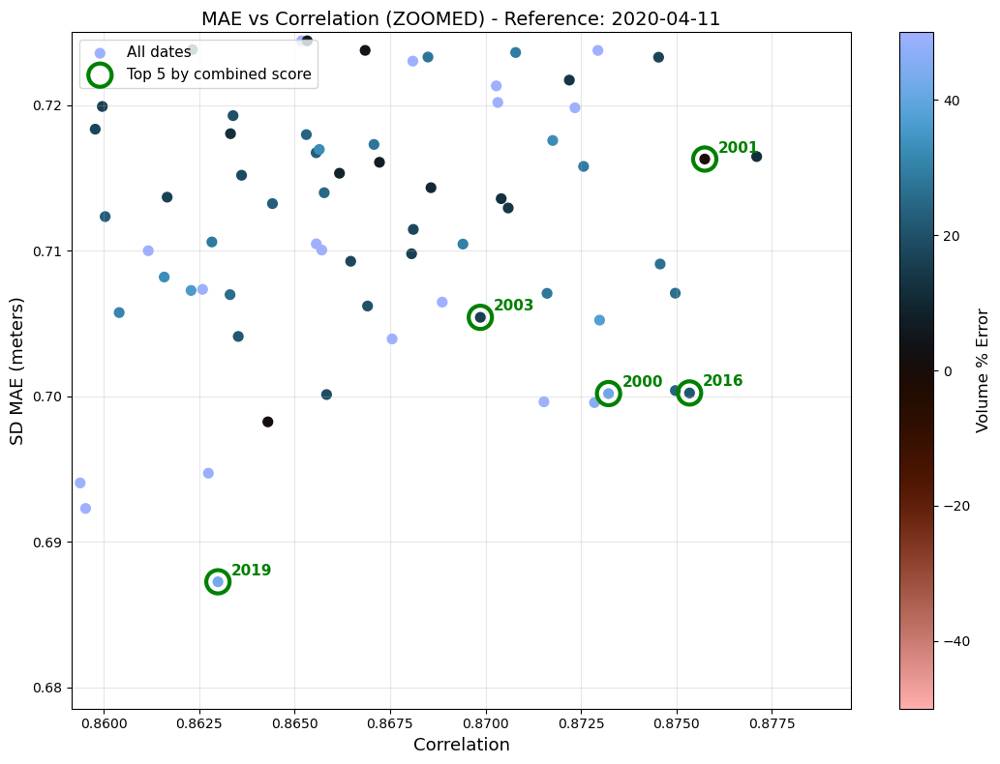


Reference: 2020-04-11 - Top 5 analogs by combined score (one per year):
  1. 2016-03-27 - Corr: 0.875, MAE: 0.700m, Vol%: 21.4%
  2. 2000-04-06 - Corr: 0.873, MAE: 0.700m, Vol%: 41.7%
  3. 2001-04-23 - Corr: 0.876, MAE: 0.716m, Vol%: -0.6%
  4. 2019-05-10 - Corr: 0.863, MAE: 0.687m, Vol%: 42.8%
  5. 2003-03-24 - Corr: 0.870, MAE: 0.705m, Vol%: 15.8%



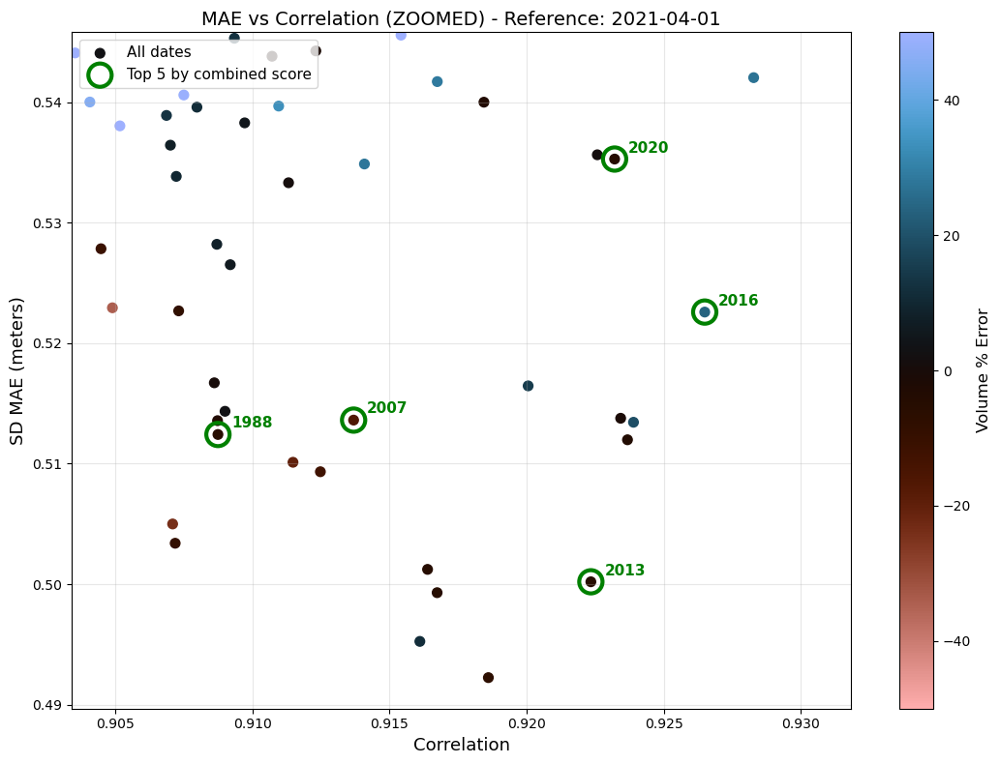


Reference: 2021-04-01 - Top 5 analogs by combined score (one per year):
  1. 2013-03-19 - Corr: 0.922, MAE: 0.500m, Vol%: -5.0%
  2. 2016-04-05 - Corr: 0.926, MAE: 0.523m, Vol%: 23.5%
  3. 2020-04-04 - Corr: 0.923, MAE: 0.535m, Vol%: -4.5%
  4. 2007-03-16 - Corr: 0.914, MAE: 0.514m, Vol%: -16.3%
  5. 1988-03-22 - Corr: 0.909, MAE: 0.512m, Vol%: -5.4%



In [16]:
# MAE vs Correlation plots for all 3 highlight dates - ZOOMED to best analogs area
ref_dates = ['2019-03-16', '2020-04-11', '2021-04-01']

for ref_date in ref_dates:
    # Load data for this reference date
    corr = xr.open_dataarray(f'../data/reanalysis/fsca_correlation/correlation_{ref_date}.nc')
    mae = xr.open_dataarray(f'../data/reanalysis/sd_mae/sd_mae_{ref_date}.nc')
    swe_metrics = xr.open_dataset(f'../data/reanalysis/swe_metrics/swe_metrics_{ref_date}.nc')
    
    # Convert to DataFrames
    corr_df = pd.DataFrame({
        'date': pd.to_datetime(corr.time.values),
        'correlation': corr.values
    })
    
    mae_df = pd.DataFrame({
        'date': pd.to_datetime(mae.time.values),
        'mae': mae.values
    })
    
    swe_df = pd.DataFrame({
        'date': pd.to_datetime(swe_metrics.time.values),
        'swe_mae': swe_metrics['mae'].values,
        'volume_pct_error': swe_metrics['volume_pct_error'].values
    })
    
    # Merge on date
    combined = corr_df.merge(mae_df, on='date', how='inner')
    combined = combined.merge(swe_df, on='date', how='inner')
    
    # Calculate combined score
    combined['corr_norm'] = (combined['correlation'] - combined['correlation'].min()) / (combined['correlation'].max() - combined['correlation'].min())
    combined['mae_norm'] = 1 - (combined['mae'] - combined['mae'].min()) / (combined['mae'].max() - combined['mae'].min())
    combined['combined_score'] = (combined['corr_norm'] + combined['mae_norm']) / 2
    combined['year'] = combined['date'].dt.year
    
    # Get best analog from each year (by combined score)
    best_per_year = combined.loc[combined.groupby('year')['combined_score'].idxmax()].copy()
    
    # Get top 5 years by combined score
    top5_combined = best_per_year.nlargest(5, 'combined_score').copy()
    
    # Calculate zoom limits based on top 5 analogs with some padding
    corr_min = top5_combined['correlation'].min()
    corr_max = top5_combined['correlation'].max()
    mae_min = top5_combined['mae'].min()
    mae_max = top5_combined['mae'].max()
    
    # Add 20% padding on each side
    corr_pad = (corr_max - corr_min) * 0.3
    mae_pad = (mae_max - mae_min) * 0.3
    
    xlim = (corr_min - corr_pad, min(corr_max + corr_pad, 1.0))
    ylim = (max(mae_min - mae_pad, 0), mae_max + mae_pad)
    
    # Create scatter plot
    fig, ax = plt.subplots(figsize=(11, 8))
    
    # Filter data to zoomed area for better visibility
    in_view = (combined['correlation'] >= xlim[0]) & (combined['correlation'] <= xlim[1]) & \
              (combined['mae'] >= ylim[0]) & (combined['mae'] <= ylim[1])
    combined_zoomed = combined[in_view]
    
    # All dates in view with volume % error as color
    scatter_all = ax.scatter(combined_zoomed['correlation'], combined_zoomed['mae'], 
                             c=combined_zoomed['volume_pct_error'], cmap='berlin_r',
                            s=50, vmin=-50, vmax=50,
                             label='All dates')
    
    # Circle top 5 by combined score (green circles)
    ax.scatter(top5_combined['correlation'], top5_combined['mae'], 
               s=300, facecolors='none', edgecolors='green', 
               linewidth=3, label='Top 5 by combined score', zorder=5)
    
    # Annotate top 5 with year
    for idx, row in top5_combined.iterrows():
        ax.annotate(str(row['year']), 
                    (row['correlation'], row['mae']),
                    textcoords='offset points', xytext=(10, 5),
                    fontsize=11, fontweight='bold', color='green')
    
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xlabel('Correlation', fontsize=13)
    ax.set_ylabel('SD MAE (meters)', fontsize=13)
    ax.set_title(f'MAE vs Correlation (ZOOMED) - Reference: {ref_date}', fontsize=14)
    ax.legend(fontsize=11, loc='upper left')
    ax.grid(alpha=0.3)
    
    # Add colorbar for volume % error
    cbar = plt.colorbar(scatter_all, ax=ax, label='Volume % Error')
    cbar.set_label('Volume % Error', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    # Print top 5 info
    print(f"\nReference: {ref_date} - Top 5 analogs by combined score (one per year):")
    for i, (idx, row) in enumerate(top5_combined.iterrows(), 1):
        print(f"  {i}. {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")
    print()
    
    # Close files
    corr.close()
    mae.close()
    swe_metrics.close()

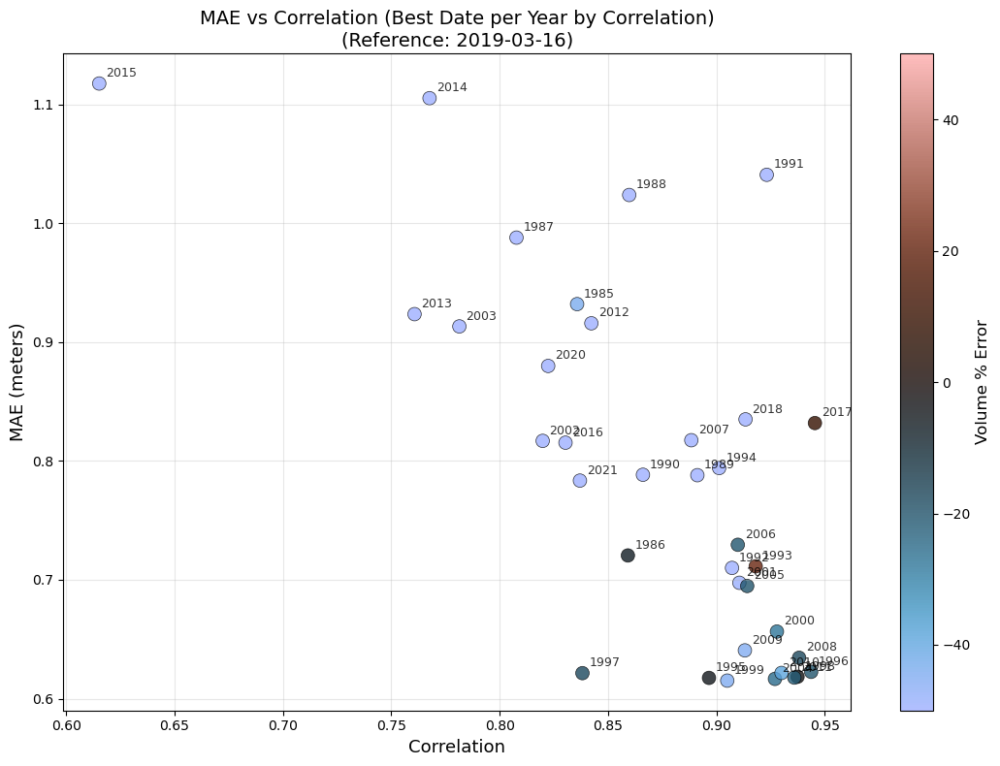


Best date per year by correlation:
  1985: 1985-04-01 - Corr: 0.836, MAE: 0.932m, Vol%: -43.9%
  1986: 1986-03-19 - Corr: 0.859, MAE: 0.720m, Vol%: -6.9%
  1987: 1987-03-14 - Corr: 0.808, MAE: 0.988m, Vol%: -73.9%
  1988: 1988-03-01 - Corr: 0.860, MAE: 1.024m, Vol%: -64.4%
  1989: 1989-03-06 - Corr: 0.891, MAE: 0.788m, Vol%: -52.0%
  1990: 1990-03-03 - Corr: 0.866, MAE: 0.788m, Vol%: -65.1%
  1991: 1991-03-05 - Corr: 0.923, MAE: 1.041m, Vol%: -73.8%
  1992: 1992-03-06 - Corr: 0.907, MAE: 0.710m, Vol%: -50.7%
  1993: 1993-03-18 - Corr: 0.918, MAE: 0.711m, Vol%: 21.3%
  1994: 1994-03-02 - Corr: 0.901, MAE: 0.794m, Vol%: -57.0%
  1995: 1995-03-12 - Corr: 0.897, MAE: 0.617m, Vol%: -4.8%
  1996: 1996-03-08 - Corr: 0.944, MAE: 0.623m, Vol%: -20.4%
  1997: 1997-03-02 - Corr: 0.838, MAE: 0.621m, Vol%: -17.9%
  1998: 1998-03-15 - Corr: 0.937, MAE: 0.618m, Vol%: -2.4%
  1999: 1999-03-01 - Corr: 0.905, MAE: 0.615m, Vol%: -44.8%
  2000: 2000-03-12 - Corr: 0.928, MAE: 0.656m, Vol%: -28.0%
  2001: 

In [9]:
# MAE vs Correlation - Best date per year by correlation
# Extract year and get best date per year
combined['year'] = combined['date'].dt.year
best_per_year = combined.loc[combined.groupby('year')['correlation'].idxmax()].copy()

fig, ax = plt.subplots(figsize=(11, 8))

# Plot best date per year with volume % error as color
scatter = ax.scatter(best_per_year['correlation'], best_per_year['mae'], 
                     c=best_per_year['volume_pct_error'], cmap='berlin',
                     alpha=0.8, s=100, vmin=-50, vmax=50,
                     edgecolors='black', linewidth=0.5)

# Annotate each point with the year
for idx, row in best_per_year.iterrows():
    ax.annotate(str(row['year']), 
                (row['correlation'], row['mae']),
                textcoords='offset points', xytext=(5, 5),
                fontsize=9, alpha=0.8)

ax.set_xlabel('Correlation', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE vs Correlation (Best Date per Year by Correlation)\n(Reference: {ref_date})', fontsize=14)
ax.grid(alpha=0.3)

# Add colorbar for volume % error
cbar = plt.colorbar(scatter, ax=ax, label='Volume % Error')
cbar.set_label('Volume % Error', fontsize=12)

plt.tight_layout()
plt.show()

print(f"\nBest date per year by correlation:")
for idx, row in best_per_year.sort_values('year').iterrows():
    print(f"  {row['year']}: {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")

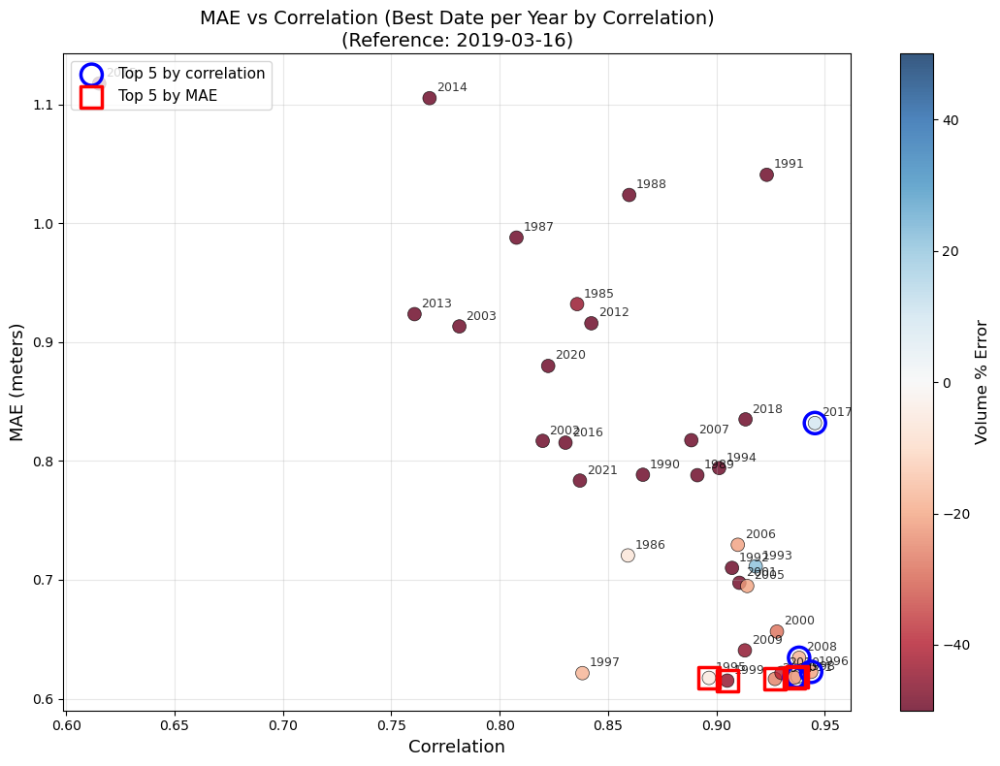


Top 5 years by correlation:
  2017: 2017-03-01 - Corr: 0.945, MAE: 0.832m, Vol%: 9.6%
  1996: 1996-03-08 - Corr: 0.944, MAE: 0.623m, Vol%: -20.4%
  2008: 2008-03-03 - Corr: 0.938, MAE: 0.634m, Vol%: -17.8%
  1998: 1998-03-15 - Corr: 0.937, MAE: 0.618m, Vol%: -2.4%
  2011: 2011-03-11 - Corr: 0.936, MAE: 0.618m, Vol%: -22.7%

Top 5 years by MAE (lowest):
  1999: 1999-03-01 - Corr: 0.905, MAE: 0.615m, Vol%: -44.8%
  2004: 2004-03-01 - Corr: 0.927, MAE: 0.617m, Vol%: -25.4%
  1995: 1995-03-12 - Corr: 0.897, MAE: 0.617m, Vol%: -4.8%
  2011: 2011-03-11 - Corr: 0.936, MAE: 0.618m, Vol%: -22.7%
  1998: 1998-03-15 - Corr: 0.937, MAE: 0.618m, Vol%: -2.4%


In [10]:
# MAE vs Correlation - Best date per year by correlation
# Extract year and get best date per year
combined['year'] = combined['date'].dt.year
best_per_year = combined.loc[combined.groupby('year')['correlation'].idxmax()].copy()

# Get top 5 years by correlation and by MAE
top5_corr = best_per_year.nlargest(5, 'correlation')
top5_mae = best_per_year.nsmallest(5, 'mae')

fig, ax = plt.subplots(figsize=(11, 8))

# Plot best date per year with volume % error as color
scatter = ax.scatter(best_per_year['correlation'], best_per_year['mae'], 
                     c=best_per_year['volume_pct_error'], cmap='RdBu',
                     alpha=0.8, s=100, vmin=-50, vmax=50,
                     edgecolors='black', linewidth=0.5)

# Circle top 5 by correlation (blue)
ax.scatter(top5_corr['correlation'], top5_corr['mae'], 
           s=250, facecolors='none', edgecolors='blue', 
           linewidth=2.5, label='Top 5 by correlation', zorder=5)

# Circle top 5 by MAE (red squares)
ax.scatter(top5_mae['correlation'], top5_mae['mae'], 
           s=250, facecolors='none', edgecolors='red', 
           linewidth=2.5, marker='s', label='Top 5 by MAE', zorder=5)

# Annotate each point with the year
for idx, row in best_per_year.iterrows():
    ax.annotate(str(row['year']), 
                (row['correlation'], row['mae']),
                textcoords='offset points', xytext=(5, 5),
                fontsize=9, alpha=0.8)

ax.set_xlabel('Correlation', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE vs Correlation (Best Date per Year by Correlation)\n(Reference: {ref_date})', fontsize=14)
ax.legend(fontsize=11, loc='upper left')
ax.grid(alpha=0.3)

# Add colorbar for volume % error
cbar = plt.colorbar(scatter, ax=ax, label='Volume % Error')
cbar.set_label('Volume % Error', fontsize=12)

plt.tight_layout()
plt.show()

# Print top 5 by correlation
print(f"\nTop 5 years by correlation:")
for idx, row in top5_corr.sort_values('correlation', ascending=False).iterrows():
    print(f"  {row['year']}: {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")

# Print top 5 by MAE
print(f"\nTop 5 years by MAE (lowest):")
for idx, row in top5_mae.sort_values('mae').iterrows():
    print(f"  {row['year']}: {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")

In [14]:
example_swe = xr.load_dataset('../data/reanalysis/daily_SWE_files/1985/day_001.nc')

In [15]:
example_swe

<xarray.Dataset> Size: 5MB
Dimensions:      (space: 1164373)
Coordinates:
    time         datetime64[ns] 8B 1985-01-01
    spatial_ref  int64 8B 0
Dimensions without coordinates: space
Data variables:
    SWE_Post     (space) float32 5MB nan nan nan nan nan ... nan nan nan nan nan

In [18]:
spatial_coords = xr.load_dataset('../data/reanalysis/daily_SWE_files/spatial_coords.nc')

In [19]:
spatial_coords

<xarray.Dataset> Size: 9MB
Dimensions:  (space: 1164373)
Dimensions without coordinates: space
Data variables:
    x        (space) float32 5MB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    y        (space) float32 5MB 34.82 34.82 34.82 34.82 ... 40.45 40.45 40.45
Attributes:
    n_points:     1164373
    description:  Spatial coordinates for stacked daily SWE files

Reference date: 2019-03-16

Best analog date (combined corr + MAE): 2011-03-13
  Correlation: 0.927
  MAE: 0.597 m
  Volume % Error: -23.8%
  Combined Score: 0.986


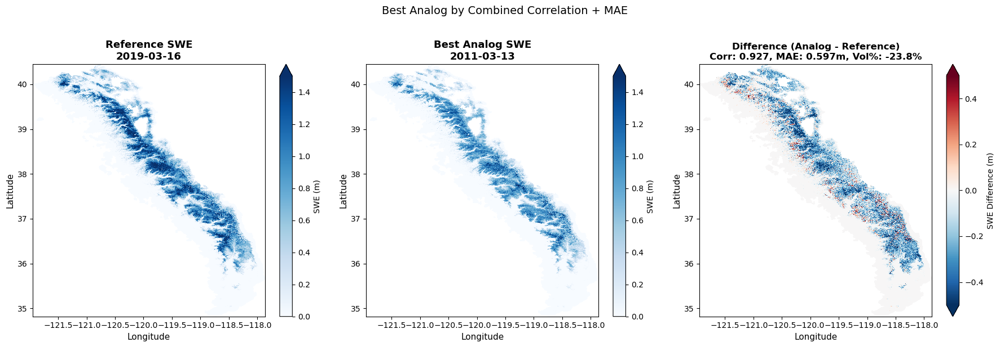

In [5]:
# Function to load SWE data for a given date
def load_swe_for_date(date):
    """Load 2D SWE data from daily files"""
    year = date.year
    doy = date.timetuple().tm_yday
    filepath = f'../data/reanalysis/daily_SWE_files/{year}/day_{doy:03d}.nc'
    
    # Load the data
    ds = xr.open_dataset(filepath)
    swe = ds['SWE_Post']
    
    # Check if data is already 2D or 1D stacked
    if 'space' in swe.dims:
        # 1D stacked - need to unstack
        spatial_coords_path = '../data/reanalysis/daily_SWE_files/spatial_coords.nc'
        spatial_info = xr.open_dataset(spatial_coords_path)
        x_coords = spatial_info.x.values
        y_coords = spatial_info.y.values
        spatial_info.close()
        
        swe_1d = swe.values
        swe_stacked = xr.DataArray(
            swe_1d,
            coords={
                'space': np.arange(len(swe_1d)),
                'x': (['space'], x_coords),
                'y': (['space'], y_coords)
            },
            dims=['space'],
            name='SWE_Post'
        )
        swe_stacked = swe_stacked.set_index(space=['y', 'x'])
        swe_2d = swe_stacked.unstack('space')
        ds.close()
        return swe_2d
    else:
        # Already 2D - just return as-is
        swe_2d = swe.copy()
        ds.close()
        return swe_2d

# Find the best analog by combined correlation and MAE
# Normalize both metrics to [0, 1] and combine (higher correlation is better, lower MAE is better)
combined['corr_norm'] = (combined['correlation'] - combined['correlation'].min()) / (combined['correlation'].max() - combined['correlation'].min())
combined['mae_norm'] = 1 - (combined['mae'] - combined['mae'].min()) / (combined['mae'].max() - combined['mae'].min())
combined['combined_score'] = (combined['corr_norm'] + combined['mae_norm']) / 2

# Get the best analog date (highest combined score)
best_analog = combined.loc[combined['combined_score'].idxmax()]
best_analog_date = best_analog['date']

print(f"Reference date: {ref_date}")
print(f"\nBest analog date (combined corr + MAE): {best_analog_date.strftime('%Y-%m-%d')}")
print(f"  Correlation: {best_analog['correlation']:.3f}")
print(f"  MAE: {best_analog['mae']:.3f} m")
print(f"  Volume % Error: {best_analog['volume_pct_error']:.1f}%")
print(f"  Combined Score: {best_analog['combined_score']:.3f}")

# Load reference and best analog SWE
ref_date_dt = pd.to_datetime(ref_date)
ref_swe = load_swe_for_date(ref_date_dt)
analog_swe = load_swe_for_date(best_analog_date)

# Calculate difference
swe_diff = analog_swe - ref_swe

# Create 3-panel plot: Reference, Analog, Difference
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot reference SWE map
ref_swe.plot(ax=axes[0], cmap='Blues', vmin=0, vmax=1.5,
             cbar_kwargs={'label': 'SWE (m)'})
axes[0].set_title(f'Reference SWE\n{ref_date}', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Longitude', fontsize=11)
axes[0].set_ylabel('Latitude', fontsize=11)

# Plot analog SWE map
analog_swe.plot(ax=axes[1], cmap='Blues', vmin=0, vmax=1.5,
                cbar_kwargs={'label': 'SWE (m)'})
axes[1].set_title(f'Best Analog SWE\n{best_analog_date.strftime("%Y-%m-%d")}', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Longitude', fontsize=11)
axes[1].set_ylabel('Latitude', fontsize=11)

# Plot difference map
swe_diff.plot(ax=axes[2], cmap='RdBu_r', center=0, vmin=-0.5, vmax=0.5,
              cbar_kwargs={'label': 'SWE Difference (m)'})
axes[2].set_title(f'Difference (Analog - Reference)\nCorr: {best_analog["correlation"]:.3f}, MAE: {best_analog["mae"]:.3f}m, Vol%: {best_analog["volume_pct_error"]:.1f}%',
                  fontsize=12, fontweight='bold')
axes[2].set_xlabel('Longitude', fontsize=11)
axes[2].set_ylabel('Latitude', fontsize=11)

plt.suptitle(f'Best Analog by Combined Correlation + MAE', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# Clean up
del ref_swe, analog_swe, swe_diff

Reference date: 2019-03-16

Top 5 analog dates by combined Correlation + MAE score:
1. 2011-03-13 - Corr: 0.927, MAE: 0.597m, Vol%: -23.8%, Score: 0.986
2. 2011-03-12 - Corr: 0.931, MAE: 0.605m, Vol%: -23.3%, Score: 0.981
3. 2011-03-14 - Corr: 0.924, MAE: 0.600m, Vol%: -23.7%, Score: 0.981
4. 2011-03-15 - Corr: 0.913, MAE: 0.595m, Vol%: -24.2%, Score: 0.979
5. 2011-03-16 - Corr: 0.912, MAE: 0.599m, Vol%: -23.4%, Score: 0.974


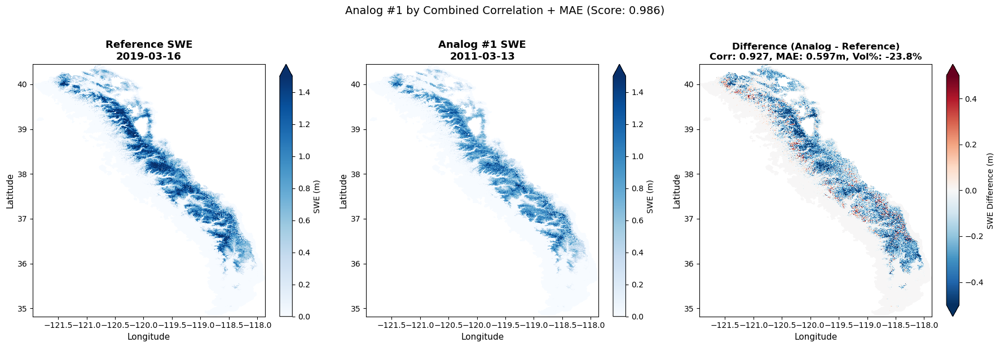

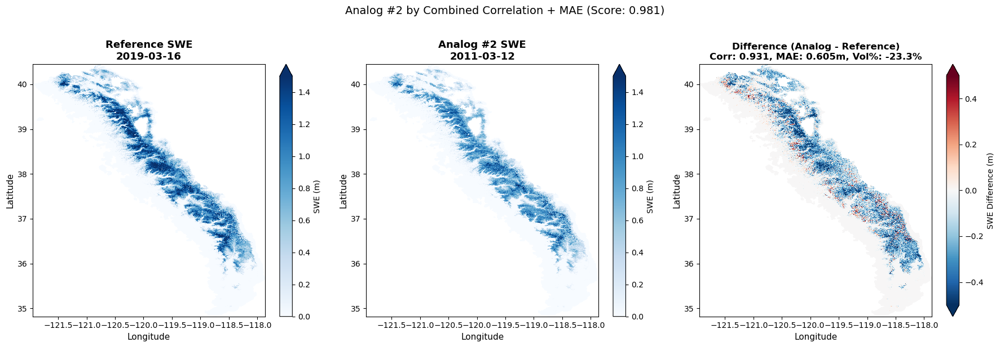

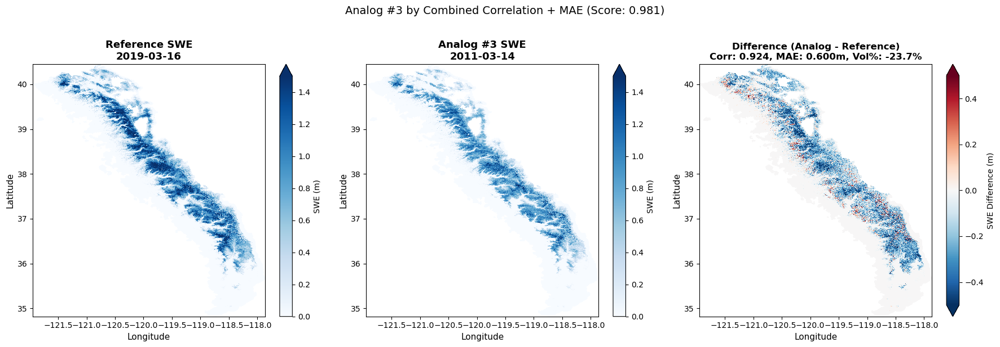

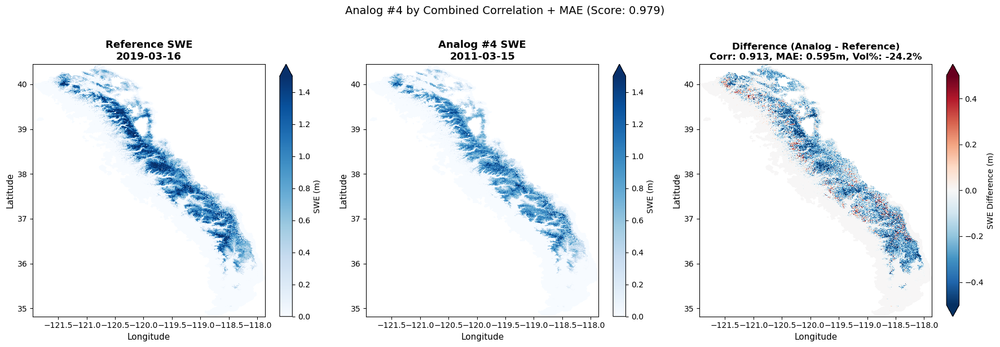

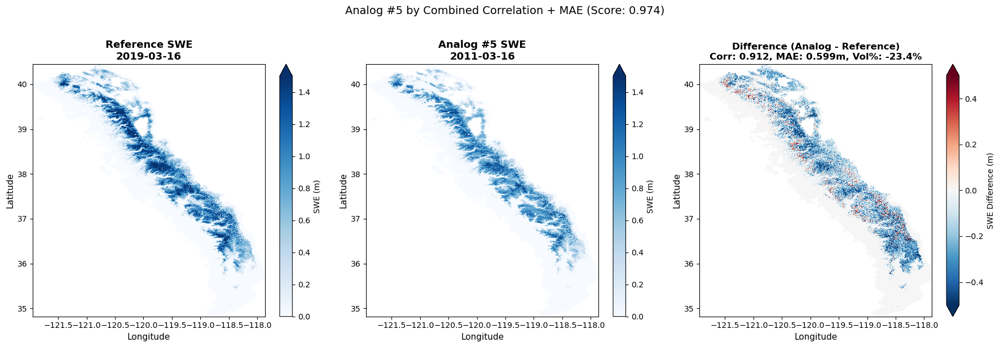

In [6]:
# Get top 5 analogs by combined score
top5_combined = combined.nlargest(5, 'combined_score').copy()

print(f"Reference date: {ref_date}")
print(f"\nTop 5 analog dates by combined Correlation + MAE score:")
for i, (idx, row) in enumerate(top5_combined.iterrows(), 1):
    print(f"{i}. {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%, Score: {row['combined_score']:.3f}")

# Load reference SWE once
ref_date_dt = pd.to_datetime(ref_date)
ref_swe = load_swe_for_date(ref_date_dt)

# Plot each of the top 5 analogs
for i, (idx, row) in enumerate(top5_combined.iterrows(), 1):
    analog_date = row['date']
    
    # Load analog SWE
    analog_swe = load_swe_for_date(analog_date)
    
    # Calculate difference
    swe_diff = analog_swe - ref_swe
    
    # Create 3-panel plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Plot reference SWE map
    ref_swe.plot(ax=axes[0], cmap='Blues', vmin=0, vmax=1.5,
                 cbar_kwargs={'label': 'SWE (m)'})
    axes[0].set_title(f'Reference SWE\n{ref_date}', fontsize=13, fontweight='bold')
    axes[0].set_xlabel('Longitude', fontsize=11)
    axes[0].set_ylabel('Latitude', fontsize=11)
    
    # Plot analog SWE map
    analog_swe.plot(ax=axes[1], cmap='Blues', vmin=0, vmax=1.5,
                    cbar_kwargs={'label': 'SWE (m)'})
    axes[1].set_title(f'Analog #{i} SWE\n{analog_date.strftime("%Y-%m-%d")}', fontsize=13, fontweight='bold')
    axes[1].set_xlabel('Longitude', fontsize=11)
    axes[1].set_ylabel('Latitude', fontsize=11)
    
    # Plot difference map
    swe_diff.plot(ax=axes[2], cmap='RdBu_r', center=0, vmin=-0.5, vmax=0.5,
                  cbar_kwargs={'label': 'SWE Difference (m)'})
    axes[2].set_title(f'Difference (Analog - Reference)\nCorr: {row["correlation"]:.3f}, MAE: {row["mae"]:.3f}m, Vol%: {row["volume_pct_error"]:.1f}%',
                      fontsize=12, fontweight='bold')
    axes[2].set_xlabel('Longitude', fontsize=11)
    axes[2].set_ylabel('Latitude', fontsize=11)
    
    plt.suptitle(f'Analog #{i} by Combined Correlation + MAE (Score: {row["combined_score"]:.3f})', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Clean up analog data after each iteration
    del analog_swe, swe_diff

# Clean up reference
del ref_swe

Reference date: 2019-03-16

Top 5 analog dates by combined Correlation + MAE score (one per year):
1. 2011-03-13 - Corr: 0.927, MAE: 0.597m, Vol%: -23.8%, Score: 0.986
2. 1998-03-13 - Corr: 0.937, MAE: 0.616m, Vol%: -1.3%, Score: 0.974
3. 1996-03-08 - Corr: 0.944, MAE: 0.623m, Vol%: -20.4%, Score: 0.973
4. 2000-03-03 - Corr: 0.926, MAE: 0.612m, Vol%: -37.3%, Score: 0.971
5. 2004-03-01 - Corr: 0.927, MAE: 0.617m, Vol%: -25.4%, Score: 0.968


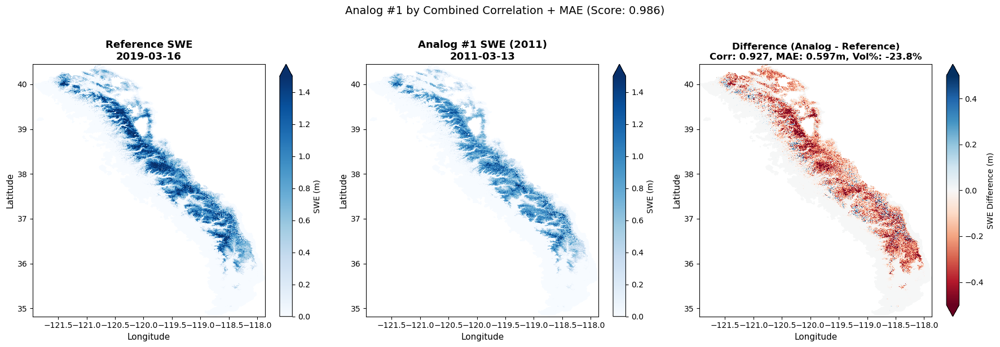

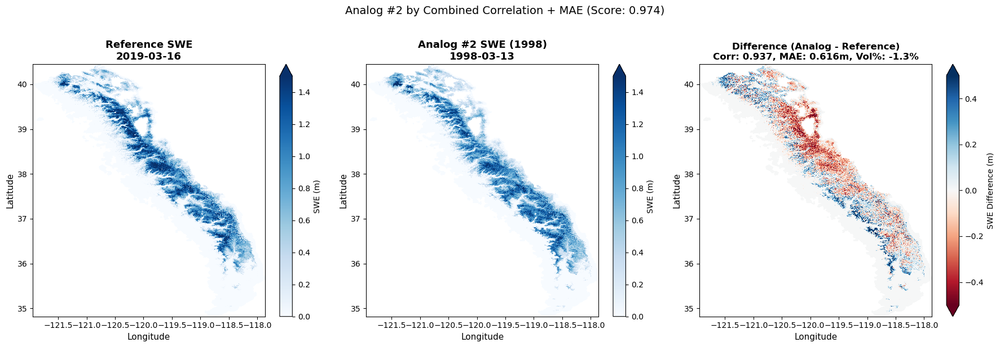

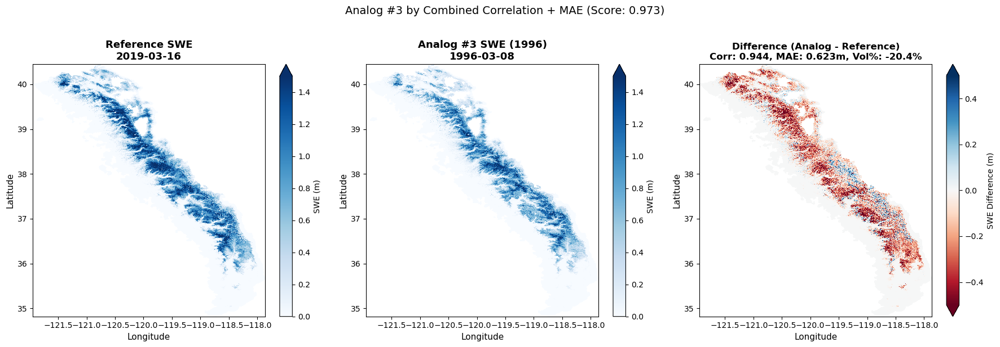

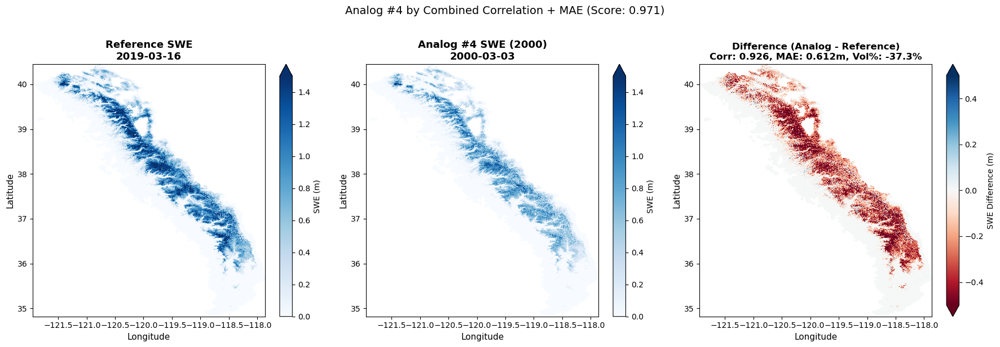

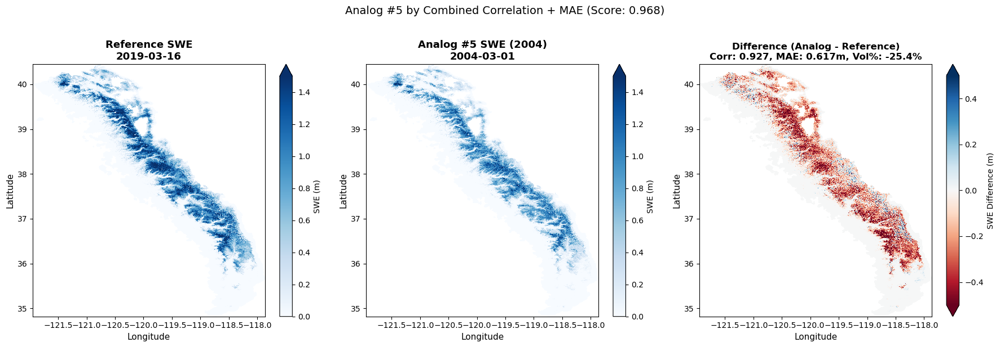

In [8]:
# Get top 5 analogs by combined score, each from a different year
combined['year'] = combined['date'].dt.year

# Get best analog from each year (by combined score)
best_per_year = combined.loc[combined.groupby('year')['combined_score'].idxmax()].copy()

# Get top 5 years by combined score
top5_combined = best_per_year.nlargest(5, 'combined_score').copy()

print(f"Reference date: {ref_date}")
print(f"\nTop 5 analog dates by combined Correlation + MAE score (one per year):")
for i, (idx, row) in enumerate(top5_combined.iterrows(), 1):
    print(f"{i}. {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%, Score: {row['combined_score']:.3f}")

# Load reference SWE once
ref_date_dt = pd.to_datetime(ref_date)
ref_swe = load_swe_for_date(ref_date_dt)

# Plot each of the top 5 analogs
for i, (idx, row) in enumerate(top5_combined.iterrows(), 1):
    analog_date = row['date']
    
    # Load analog SWE
    analog_swe = load_swe_for_date(analog_date)
    
    # Calculate difference
    swe_diff = analog_swe - ref_swe
    
    # Create 3-panel plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Plot reference SWE map
    ref_swe.plot(ax=axes[0], cmap='Blues', vmin=0, vmax=1.5,
                 cbar_kwargs={'label': 'SWE (m)'})
    axes[0].set_title(f'Reference SWE\n{ref_date}', fontsize=13, fontweight='bold')
    axes[0].set_xlabel('Longitude', fontsize=11)
    axes[0].set_ylabel('Latitude', fontsize=11)
    
    # Plot analog SWE map
    analog_swe.plot(ax=axes[1], cmap='Blues', vmin=0, vmax=1.5,
                    cbar_kwargs={'label': 'SWE (m)'})
    axes[1].set_title(f'Analog #{i} SWE ({row["year"]})\n{analog_date.strftime("%Y-%m-%d")}', fontsize=13, fontweight='bold')
    axes[1].set_xlabel('Longitude', fontsize=11)
    axes[1].set_ylabel('Latitude', fontsize=11)
    
    # Plot difference map
    swe_diff.plot(ax=axes[2], cmap='RdBu', center=0, vmin=-0.5, vmax=0.5,
                  cbar_kwargs={'label': 'SWE Difference (m)'})
    axes[2].set_title(f'Difference (Analog - Reference)\nCorr: {row["correlation"]:.3f}, MAE: {row["mae"]:.3f}m, Vol%: {row["volume_pct_error"]:.1f}%',
                      fontsize=12, fontweight='bold')
    axes[2].set_xlabel('Longitude', fontsize=11)
    axes[2].set_ylabel('Latitude', fontsize=11)
    
    plt.suptitle(f'Analog #{i} by Combined Correlation + MAE (Score: {row["combined_score"]:.3f})', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Clean up analog data after each iteration
    del analog_swe, swe_diff

# Clean up reference
del ref_swe

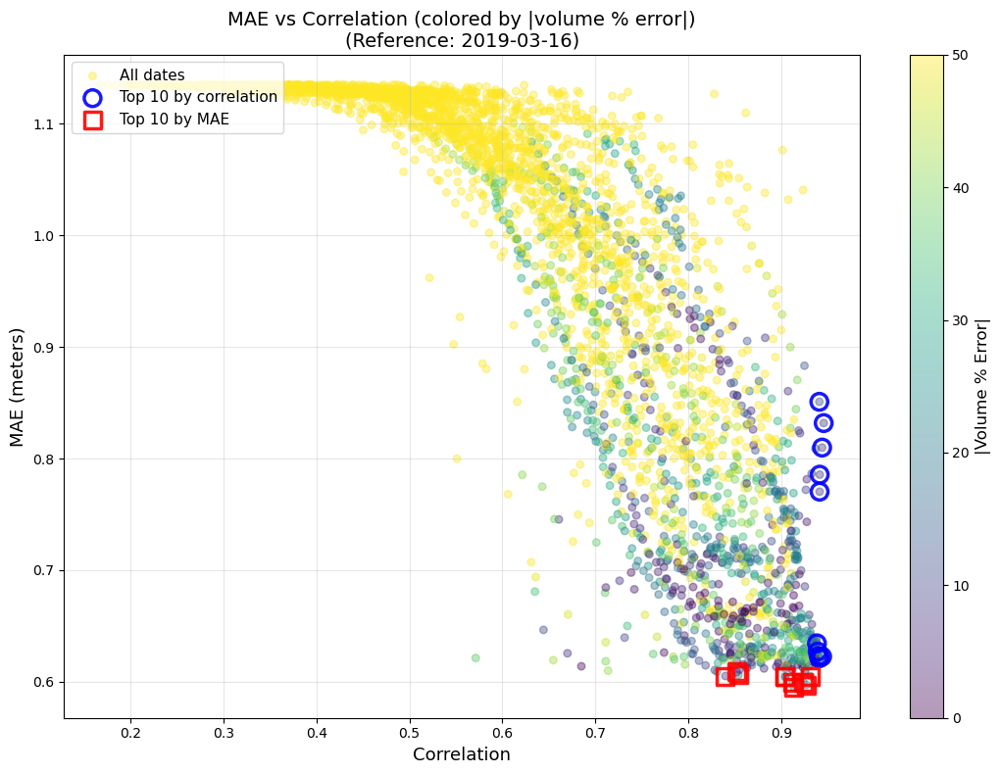


Number of dates in both top 10 lists: 0


In [84]:
# Scatter plot: MAE vs Correlation with absolute volume % error as color
fig, ax = plt.subplots(figsize=(11, 8))

# All dates with absolute volume % error as color
scatter_all = ax.scatter(combined['correlation'], combined['mae'], 
                         c=np.abs(combined['volume_pct_error']), cmap='viridis',
                         alpha=0.4, s=30, vmin=0, vmax=50,
                         label='All dates')

# Highlight top 10 by correlation
ax.scatter(top_corr['correlation'], top_corr['mae'], 
           alpha=0.9, s=150, edgecolors='blue', facecolors='none',
           linewidth=2.5, label='Top 10 by correlation', zorder=5)

# Highlight top 10 by MAE
ax.scatter(top_mae['correlation'], top_mae['mae'], 
           alpha=0.9, s=150, edgecolors='red', facecolors='none',
           linewidth=2.5, label='Top 10 by MAE', marker='s', zorder=5)

# Annotate overlap (dates in both top 10 lists)
overlap = set(top_corr['date']).intersection(set(top_mae['date']))
if overlap:
    overlap_data = combined[combined['date'].isin(overlap)]
    ax.scatter(overlap_data['correlation'], overlap_data['mae'], 
               alpha=0.9, s=200, edgecolors='green', facecolors='none',
               linewidth=3, label=f'Overlap ({len(overlap)})', marker='*', zorder=10)

ax.set_xlabel('Correlation', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE vs Correlation (colored by |volume % error|)\n(Reference: {ref_date})', fontsize=14)
ax.legend(fontsize=11, loc='upper left')
ax.grid(alpha=0.3)

# Add colorbar for absolute volume % error
cbar = plt.colorbar(scatter_all, ax=ax, label='|Volume % Error|')
cbar.set_label('|Volume % Error|', fontsize=12)

plt.tight_layout()
plt.show()

print(f"\nNumber of dates in both top 10 lists: {len(overlap)}")
if overlap:
    print("Dates in both lists:")
    for d in sorted(overlap):
        row = combined[combined['date'] == d].iloc[0]
        print(f"  {d.strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}% (|Vol%|: {abs(row['volume_pct_error']):.1f}%)")

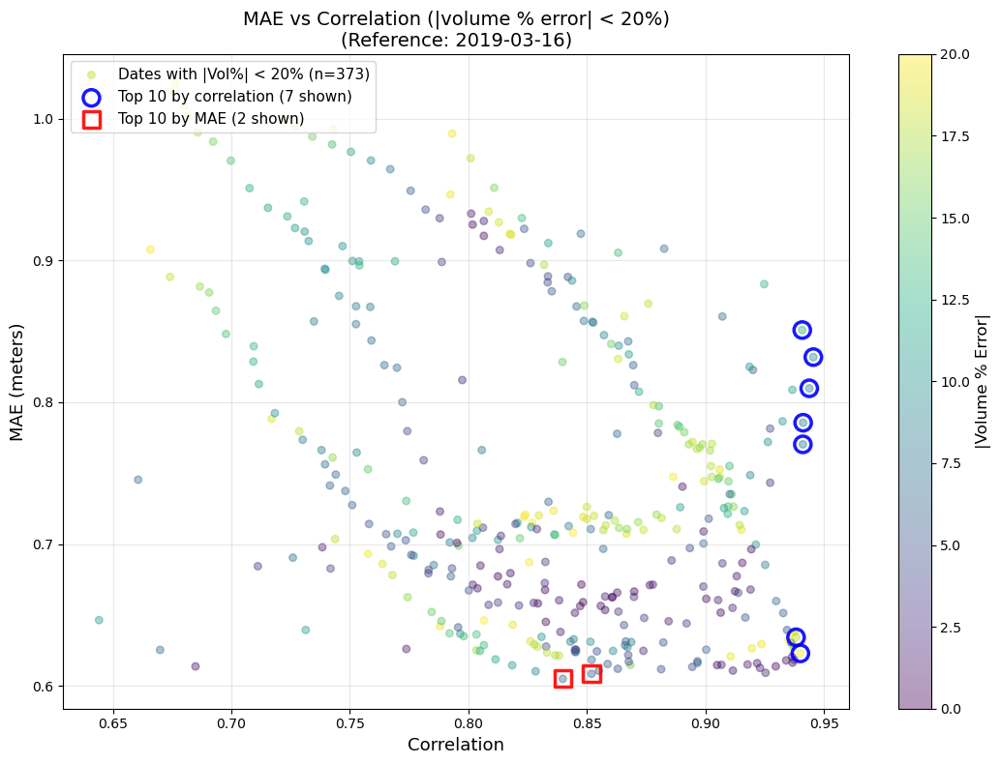


Filtered to 373 dates with |volume % error| < 20%
Top 10 by correlation in filtered set: 7
Top 10 by MAE in filtered set: 2
Overlap dates in filtered set: 0


In [91]:
# Scatter plot: MAE vs Correlation with absolute volume % error < 20%
# Filter to only dates with absolute volume % error < 20%
combined_filtered = combined[np.abs(combined['volume_pct_error']) < 20].copy()

fig, ax = plt.subplots(figsize=(11, 8))

# Filtered dates with absolute volume % error as color
scatter_all = ax.scatter(combined_filtered['correlation'], combined_filtered['mae'], 
                         c=np.abs(combined_filtered['volume_pct_error']), cmap='viridis',
                         alpha=0.4, s=30, vmin=0, vmax=20,
                         label=f'Dates with |Vol%| < 20% (n={len(combined_filtered)})')

# Highlight top 10 by correlation (if they're in the filtered set)
top_corr_filtered = top_corr[top_corr['date'].isin(combined_filtered['date'])]
if len(top_corr_filtered) > 0:
    ax.scatter(top_corr_filtered['correlation'], top_corr_filtered['mae'], 
               alpha=0.9, s=150, edgecolors='blue', facecolors='none',
               linewidth=2.5, label=f'Top 10 by correlation ({len(top_corr_filtered)} shown)', zorder=5)

# Highlight top 10 by MAE (if they're in the filtered set)
top_mae_filtered = top_mae[top_mae['date'].isin(combined_filtered['date'])]
if len(top_mae_filtered) > 0:
    ax.scatter(top_mae_filtered['correlation'], top_mae_filtered['mae'], 
               alpha=0.9, s=150, edgecolors='red', facecolors='none',
               linewidth=2.5, label=f'Top 10 by MAE ({len(top_mae_filtered)} shown)', marker='s', zorder=5)

# Annotate overlap (dates in both top 10 lists that are also in filtered set)
overlap_filtered = [d for d in overlap if d in combined_filtered['date'].values]
if overlap_filtered:
    overlap_data = combined_filtered[combined_filtered['date'].isin(overlap_filtered)]
    ax.scatter(overlap_data['correlation'], overlap_data['mae'], 
               alpha=0.9, s=200, edgecolors='green', facecolors='none',
               linewidth=3, label=f'Overlap ({len(overlap_filtered)})', marker='*', zorder=10)

ax.set_xlabel('Correlation', fontsize=13)
ax.set_ylabel('MAE (meters)', fontsize=13)
ax.set_title(f'MAE vs Correlation (|volume % error| < 20%)\n(Reference: {ref_date})', fontsize=14)
ax.legend(fontsize=11, loc='upper left')
ax.grid(alpha=0.3)

# Add colorbar for absolute volume % error
cbar = plt.colorbar(scatter_all, ax=ax, label='|Volume % Error|')
cbar.set_label('|Volume % Error|', fontsize=12)

plt.tight_layout()
plt.show()

print(f"\nFiltered to {len(combined_filtered)} dates with |volume % error| < 20%")
print(f"Top 10 by correlation in filtered set: {len(top_corr_filtered)}")
print(f"Top 10 by MAE in filtered set: {len(top_mae_filtered)}")
print(f"Overlap dates in filtered set: {len(overlap_filtered)}")

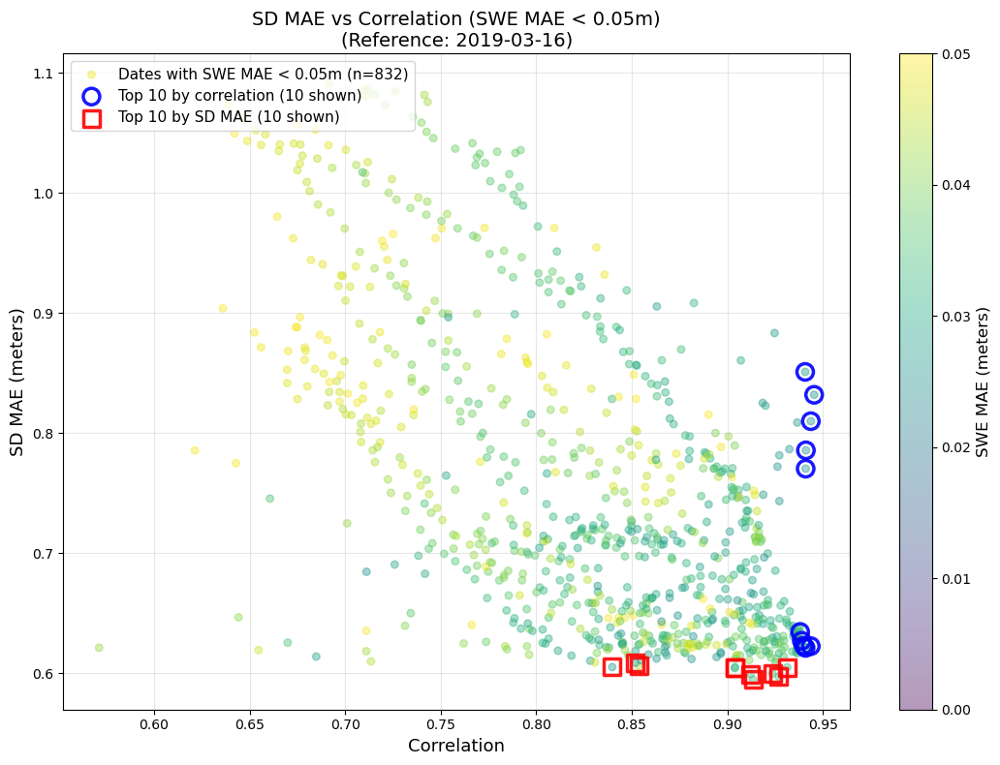


Filtered to 832 dates with SWE MAE < 0.05m
Top 10 by correlation in filtered set: 10
Top 10 by SD MAE in filtered set: 10
Overlap dates in filtered set: 0


In [95]:
# Scatter plot: Correlation vs SD MAE, filtered by SWE MAE < threshold
# Filter to only dates with SWE MAE below a threshold (e.g., 0.5 meters)
swe_mae_threshold = 0.05
combined_swe_filtered = combined[combined['swe_mae'] < swe_mae_threshold].copy()

fig, ax = plt.subplots(figsize=(11, 8))

# Filtered dates with SWE MAE as color
scatter_all = ax.scatter(combined_swe_filtered['correlation'], combined_swe_filtered['mae'], 
                         c=combined_swe_filtered['swe_mae'], cmap='viridis',
                         alpha=0.4, s=30, vmin=0, vmax=swe_mae_threshold,
                         label=f'Dates with SWE MAE < {swe_mae_threshold}m (n={len(combined_swe_filtered)})')

# Highlight top 10 by correlation (if they're in the filtered set)
top_corr_swe_filtered = top_corr[top_corr['date'].isin(combined_swe_filtered['date'])]
if len(top_corr_swe_filtered) > 0:
    ax.scatter(top_corr_swe_filtered['correlation'], top_corr_swe_filtered['mae'], 
               alpha=0.9, s=150, edgecolors='blue', facecolors='none',
               linewidth=2.5, label=f'Top 10 by correlation ({len(top_corr_swe_filtered)} shown)', zorder=5)

# Highlight top 10 by MAE (if they're in the filtered set)
top_mae_swe_filtered = top_mae[top_mae['date'].isin(combined_swe_filtered['date'])]
if len(top_mae_swe_filtered) > 0:
    ax.scatter(top_mae_swe_filtered['correlation'], top_mae_swe_filtered['mae'], 
               alpha=0.9, s=150, edgecolors='red', facecolors='none',
               linewidth=2.5, label=f'Top 10 by SD MAE ({len(top_mae_swe_filtered)} shown)', marker='s', zorder=5)

# Annotate overlap (dates in both top 10 lists that are also in filtered set)
overlap_swe_filtered = [d for d in overlap if d in combined_swe_filtered['date'].values]
if overlap_swe_filtered:
    overlap_data = combined_swe_filtered[combined_swe_filtered['date'].isin(overlap_swe_filtered)]
    ax.scatter(overlap_data['correlation'], overlap_data['mae'], 
               alpha=0.9, s=200, edgecolors='green', facecolors='none',
               linewidth=3, label=f'Overlap ({len(overlap_swe_filtered)})', marker='*', zorder=10)

ax.set_xlabel('Correlation', fontsize=13)
ax.set_ylabel('SD MAE (meters)', fontsize=13)
ax.set_title(f'SD MAE vs Correlation (SWE MAE < {swe_mae_threshold}m)\n(Reference: {ref_date})', fontsize=14)
ax.legend(fontsize=11, loc='upper left')
ax.grid(alpha=0.3)

# Add colorbar for SWE MAE
cbar = plt.colorbar(scatter_all, ax=ax, label='SWE MAE (meters)')
cbar.set_label('SWE MAE (meters)', fontsize=12)

plt.tight_layout()
plt.show()

print(f"\nFiltered to {len(combined_swe_filtered)} dates with SWE MAE < {swe_mae_threshold}m")
print(f"Top 10 by correlation in filtered set: {len(top_corr_swe_filtered)}")
print(f"Top 10 by SD MAE in filtered set: {len(top_mae_swe_filtered)}")
print(f"Overlap dates in filtered set: {len(overlap_swe_filtered)}")

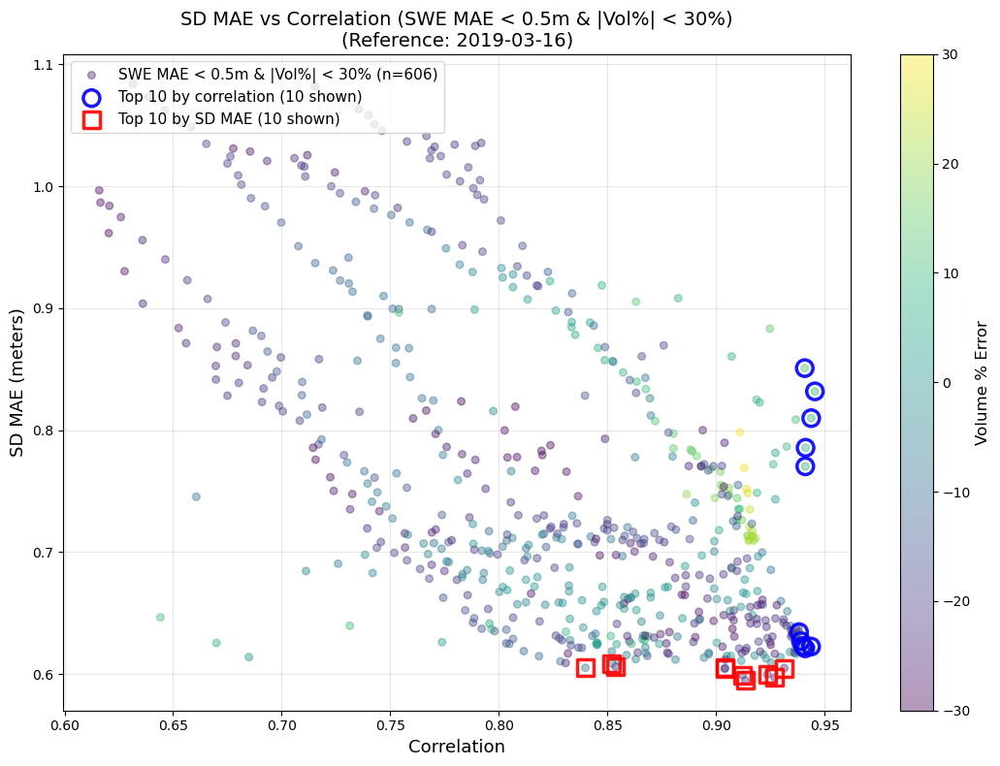


Reference date: 2019-03-16
Filtered to 606 dates with SWE MAE < 0.5m AND |Vol%| < 30%
Top 10 by correlation in filtered set: 10
Top 10 by SD MAE in filtered set: 10
Overlap dates in filtered set: 0

Top 10 by Correlation (shown in blue):
  1. 2017-03-01 - Corr: 0.945, SD MAE: 0.832m, Vol%: 9.6%
  2. 2017-03-02 - Corr: 0.944, SD MAE: 0.810m, Vol%: 9.2%
  3. 1996-03-08 - Corr: 0.944, SD MAE: 0.623m, Vol%: -20.4%
  4. 2017-03-03 - Corr: 0.941, SD MAE: 0.786m, Vol%: 8.7%
  5. 2017-03-04 - Corr: 0.941, SD MAE: 0.770m, Vol%: 8.2%
  6. 1996-03-09 - Corr: 0.941, SD MAE: 0.621m, Vol%: -21.4%
  7. 2017-03-09 - Corr: 0.941, SD MAE: 0.851m, Vol%: 12.4%
  8. 1996-03-07 - Corr: 0.940, SD MAE: 0.623m, Vol%: -19.8%
  9. 1996-03-12 - Corr: 0.939, SD MAE: 0.627m, Vol%: -21.1%
  10. 2008-03-03 - Corr: 0.938, SD MAE: 0.634m, Vol%: -17.8%

Top 10 by SD MAE (shown in red):
  1. 2011-03-15 - Corr: 0.913, SD MAE: 0.595m, Vol%: -24.2%
  2. 2011-03-13 - Corr: 0.927, SD MAE: 0.597m, Vol%: -23.8%
  3. 2011-03-16

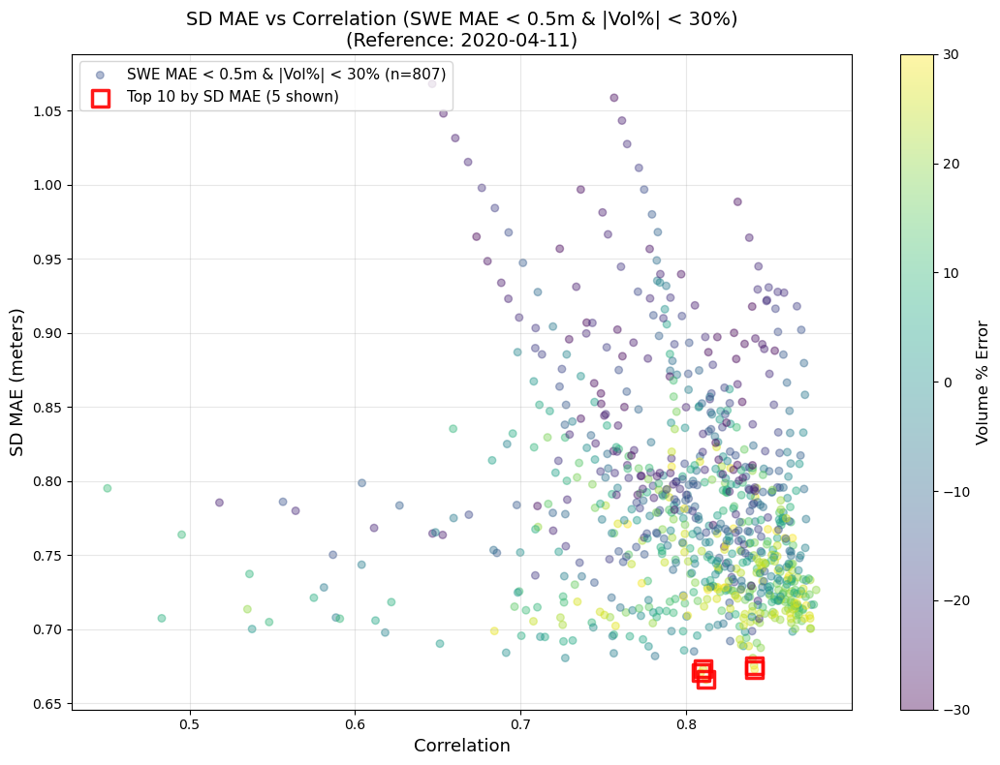


Reference date: 2020-04-11
Filtered to 807 dates with SWE MAE < 0.5m AND |Vol%| < 30%
Top 10 by correlation in filtered set: 0
Top 10 by SD MAE in filtered set: 5
Overlap dates in filtered set: 0

Top 10 by SD MAE (shown in red):
  1. 2002-03-06 - Corr: 0.812, SD MAE: 0.666m, Vol%: 27.7%
  2. 2002-03-04 - Corr: 0.809, SD MAE: 0.670m, Vol%: 28.5%
  3. 2002-04-03 - Corr: 0.841, SD MAE: 0.673m, Vol%: 29.6%
  4. 2002-03-05 - Corr: 0.810, SD MAE: 0.673m, Vol%: 27.1%
  5. 2002-04-04 - Corr: 0.841, SD MAE: 0.675m, Vol%: 25.4%



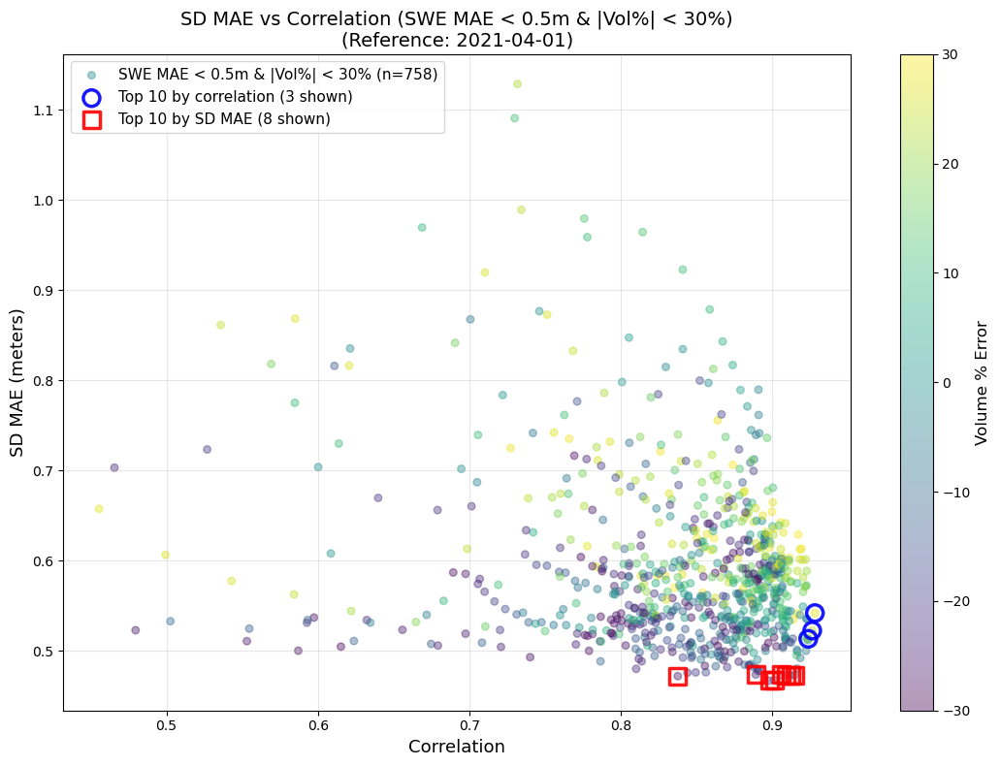


Reference date: 2021-04-01
Filtered to 758 dates with SWE MAE < 0.5m AND |Vol%| < 30%
Top 10 by correlation in filtered set: 3
Top 10 by SD MAE in filtered set: 8
Overlap dates in filtered set: 0

Top 10 by Correlation (shown in blue):
  1. 2016-04-04 - Corr: 0.928, SD MAE: 0.542m, Vol%: 27.1%
  2. 2016-04-05 - Corr: 0.926, SD MAE: 0.523m, Vol%: 23.5%
  3. 2016-04-06 - Corr: 0.924, SD MAE: 0.513m, Vol%: 19.5%

Top 10 by SD MAE (shown in red):
  1. 2013-03-29 - Corr: 0.898, SD MAE: 0.467m, Vol%: -20.0%
  2. 2013-03-28 - Corr: 0.901, SD MAE: 0.468m, Vol%: -18.1%
  3. 2008-05-14 - Corr: 0.838, SD MAE: 0.472m, Vol%: -26.1%
  4. 2013-03-25 - Corr: 0.912, SD MAE: 0.473m, Vol%: -12.7%
  5. 2013-03-26 - Corr: 0.909, SD MAE: 0.473m, Vol%: -14.4%
  6. 2013-03-24 - Corr: 0.915, SD MAE: 0.473m, Vol%: -10.4%
  7. 2013-03-27 - Corr: 0.906, SD MAE: 0.474m, Vol%: -16.3%
  8. 2013-03-31 - Corr: 0.889, SD MAE: 0.474m, Vol%: -23.5%



In [102]:
# Create SWE MAE filtered plots for multiple reference dates
ref_dates = ['2019-03-16', '2020-04-11', '2021-04-01']
swe_mae_threshold = 0.5

for ref_date in ref_dates:
    # Load data for this reference date
    corr = xr.open_dataarray(f'../data/reanalysis/fsca_correlation/correlation_{ref_date}.nc')
    mae = xr.open_dataarray(f'../data/reanalysis/sd_mae/sd_mae_{ref_date}.nc')
    swe_metrics = xr.open_dataset(f'../data/reanalysis/swe_metrics/swe_metrics_{ref_date}.nc')
    
    # Convert to DataFrames
    corr_df = pd.DataFrame({
        'date': pd.to_datetime(corr.time.values),
        'correlation': corr.values
    })
    
    mae_df = pd.DataFrame({
        'date': pd.to_datetime(mae.time.values),
        'mae': mae.values
    })
    
    swe_df = pd.DataFrame({
        'date': pd.to_datetime(swe_metrics.time.values),
        'swe_mae': swe_metrics['mae'].values,
        'volume_pct_error': swe_metrics['volume_pct_error'].values
    })
    
    # Merge on date
    combined_temp = corr_df.merge(mae_df, on='date', how='inner')
    combined_temp = combined_temp.merge(swe_df, on='date', how='inner')
    
    # Get top 10 by correlation (highest)
    top_corr_temp = combined_temp.nlargest(10, 'correlation').copy()
    
    # Get top 10 by MAE (lowest)
    top_mae_temp = combined_temp.nsmallest(10, 'mae').copy()
    
    # Calculate overlap
    overlap_temp = set(top_corr_temp['date']).intersection(set(top_mae_temp['date']))
    
    # Filter by SWE MAE threshold and volume % error
    combined_swe_filtered = combined_temp[
        (combined_temp['swe_mae'] < swe_mae_threshold) & 
        (combined_temp['volume_pct_error'] >= -30) & 
        (combined_temp['volume_pct_error'] <= 30)
    ].copy()
    
    # Create plot
    fig, ax = plt.subplots(figsize=(11, 8))
    
    # Filtered dates with volume % error as color
    scatter_all = ax.scatter(combined_swe_filtered['correlation'], combined_swe_filtered['mae'], 
                             c=combined_swe_filtered['volume_pct_error'], cmap='viridis',
                             alpha=0.4, s=30, vmin=-30, vmax=30,
                             label=f'SWE MAE < {swe_mae_threshold}m & |Vol%| < 30% (n={len(combined_swe_filtered)})')
    
    # Highlight top 10 by correlation (if they're in the filtered set)
    top_corr_swe_filtered = top_corr_temp[top_corr_temp['date'].isin(combined_swe_filtered['date'])]
    if len(top_corr_swe_filtered) > 0:
        ax.scatter(top_corr_swe_filtered['correlation'], top_corr_swe_filtered['mae'], 
                   alpha=0.9, s=150, edgecolors='blue', facecolors='none',
                   linewidth=2.5, label=f'Top 10 by correlation ({len(top_corr_swe_filtered)} shown)', zorder=5)
    
    # Highlight top 10 by MAE (if they're in the filtered set)
    top_mae_swe_filtered = top_mae_temp[top_mae_temp['date'].isin(combined_swe_filtered['date'])]
    if len(top_mae_swe_filtered) > 0:
        ax.scatter(top_mae_swe_filtered['correlation'], top_mae_swe_filtered['mae'], 
                   alpha=0.9, s=150, edgecolors='red', facecolors='none',
                   linewidth=2.5, label=f'Top 10 by SD MAE ({len(top_mae_swe_filtered)} shown)', marker='s', zorder=5)
    
    # Annotate overlap (dates in both top 10 lists that are also in filtered set)
    overlap_swe_filtered = [d for d in overlap_temp if d in combined_swe_filtered['date'].values]
    if overlap_swe_filtered:
        overlap_data = combined_swe_filtered[combined_swe_filtered['date'].isin(overlap_swe_filtered)]
        ax.scatter(overlap_data['correlation'], overlap_data['mae'], 
                   alpha=0.9, s=200, edgecolors='green', facecolors='none',
                   linewidth=3, label=f'Overlap ({len(overlap_swe_filtered)})', marker='*', zorder=10)
    
    ax.set_xlabel('Correlation', fontsize=13)
    ax.set_ylabel('SD MAE (meters)', fontsize=13)
    ax.set_title(f'SD MAE vs Correlation (SWE MAE < {swe_mae_threshold}m & |Vol%| < 30%)\n(Reference: {ref_date})', fontsize=14)
    ax.legend(fontsize=11, loc='upper left')
    ax.grid(alpha=0.3)
    
    # Add colorbar for Volume % Error
    cbar = plt.colorbar(scatter_all, ax=ax, label='Volume % Error')
    cbar.set_label('Volume % Error', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n{'='*60}")
    print(f"Reference date: {ref_date}")
    print(f"Filtered to {len(combined_swe_filtered)} dates with SWE MAE < {swe_mae_threshold}m AND |Vol%| < 30%")
    print(f"Top 10 by correlation in filtered set: {len(top_corr_swe_filtered)}")
    print(f"Top 10 by SD MAE in filtered set: {len(top_mae_swe_filtered)}")
    print(f"Overlap dates in filtered set: {len(overlap_swe_filtered)}")
    
    # Print detailed info for top 10 by correlation
    if len(top_corr_swe_filtered) > 0:
        print(f"\nTop 10 by Correlation (shown in blue):")
        for i, (idx, row) in enumerate(top_corr_swe_filtered.iterrows(), 1):
            print(f"  {i}. {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, SD MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")
    
    # Print detailed info for top 10 by MAE
    if len(top_mae_swe_filtered) > 0:
        print(f"\nTop 10 by SD MAE (shown in red):")
        for i, (idx, row) in enumerate(top_mae_swe_filtered.iterrows(), 1):
            print(f"  {i}. {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, SD MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")
    
    # Print detailed info for overlap
    if overlap_swe_filtered:
        print(f"\nOverlap dates (in both top 10 lists, shown in green):")
        for i, d in enumerate(sorted(overlap_swe_filtered), 1):
            row = combined_swe_filtered[combined_swe_filtered['date'] == d].iloc[0]
            print(f"  {i}. {d.strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, SD MAE: {row['mae']:.3f}m, Vol%: {row['volume_pct_error']:.1f}%")
    
    print(f"{'='*60}\n")

In [ ]:
# Create a file with spatial coordinates from the actual processing that created daily files
# This recreates the exact clipping/stacking that was done
polygon = gpd.read_file('../data/misc/sierras_polygon_gmba.geojson').to_crs('EPSG:4326')
sample_file = '../swe_reanalysis_pca/data/download/2019/SWE_SCA_POST_2019.nc'

# Replicate the exact processing from process_yearly_files_to_daily
ds = xr.open_dataset(sample_file)
ds = ds.rio.write_crs("EPSG:4326", inplace=False)
ds = ds.rename({'Latitude': 'y', 'Longitude': 'x'})
ds = ds.rio.set_spatial_dims(x_dim="x", y_dim="y", inplace=False)

# Clip to polygon (same as in the daily file creation)
poly_crs = polygon.to_crs(ds.rio.crs)
ds_clip = ds.rio.clip(poly_crs.geometry, poly_crs.crs, drop=True)

# Get one time slice to extract spatial coords
day_data = ds_clip['SWE_Post'].isel(time=0)

# Stack to see the mapping (same as in daily file creation)
day_stacked = day_data.stack(space=('y', 'x'))

# Save the x,y coords BEFORE they're dropped
x_coords = day_stacked.x.values
y_coords = day_stacked.y.values

# Save spatial mapping info
spatial_info = xr.Dataset({
    'x': (['space'], x_coords),
    'y': (['space'], y_coords),
})
spatial_info.attrs['n_points'] = len(x_coords)
spatial_info.attrs['description'] = 'Spatial coordinates for stacked daily SWE files'

spatial_info.to_netcdf('../data/reanalysis/daily_SWE_files/spatial_coords.nc')
print("Saved spatial coordinates to spatial_coords.nc")
print(f"Number of spatial points: {len(x_coords)}")
print(f"X range: {x_coords.min():.4f} to {x_coords.max():.4f}")
print(f"Y range: {y_coords.min():.4f} to {y_coords.max():.4f}")

ds.close()
del ds, ds_clip, day_data, day_stacked
gc.collect()


Processing reference date: 2019-03-16


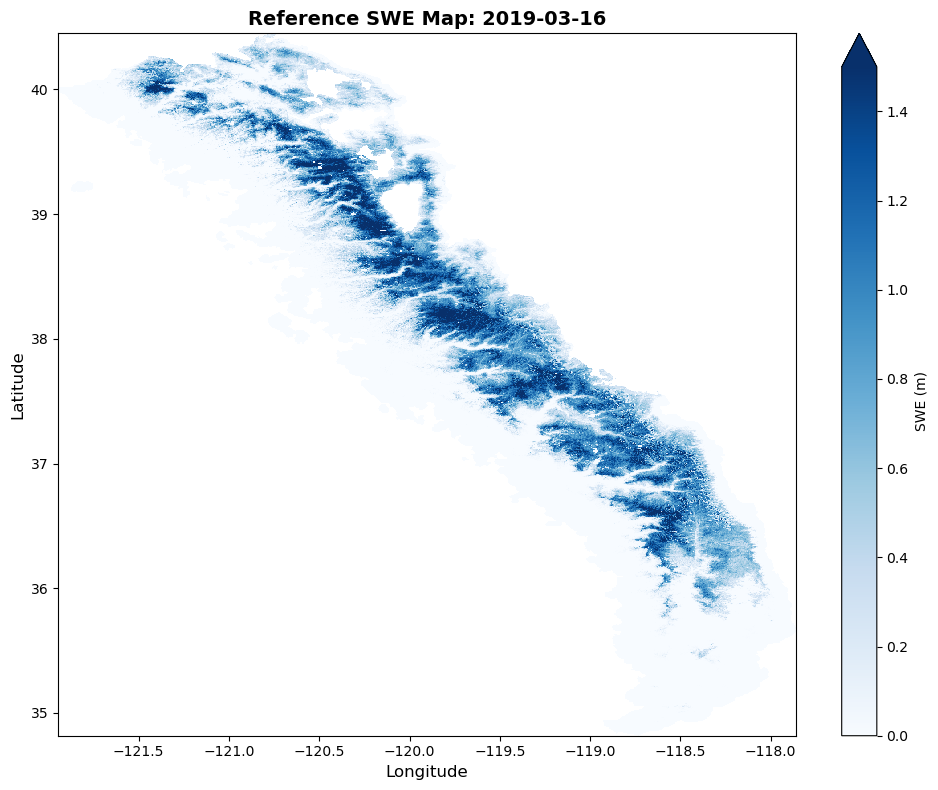


Top 5 analog dates by correlation:
1. 2017-03-01 - Corr: 0.945, Vol%: 9.6%
2. 2017-03-02 - Corr: 0.944, Vol%: 9.2%
3. 1996-03-08 - Corr: 0.944, Vol%: -20.4%
4. 2017-03-03 - Corr: 0.941, Vol%: 8.7%
5. 2017-03-04 - Corr: 0.941, Vol%: 8.2%


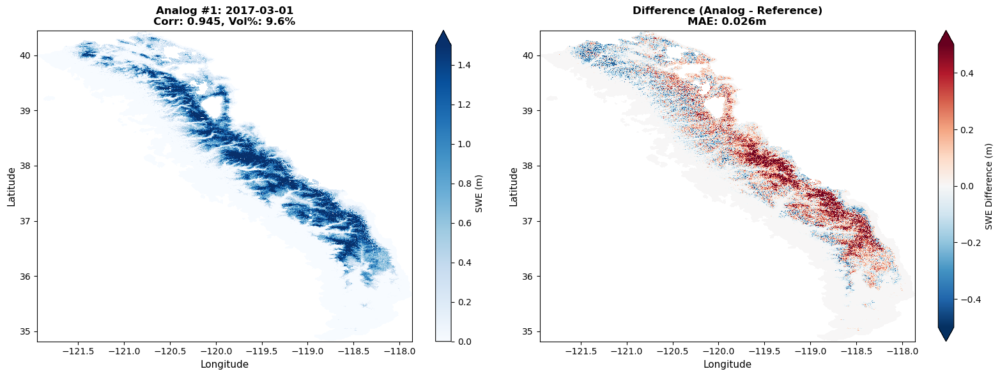

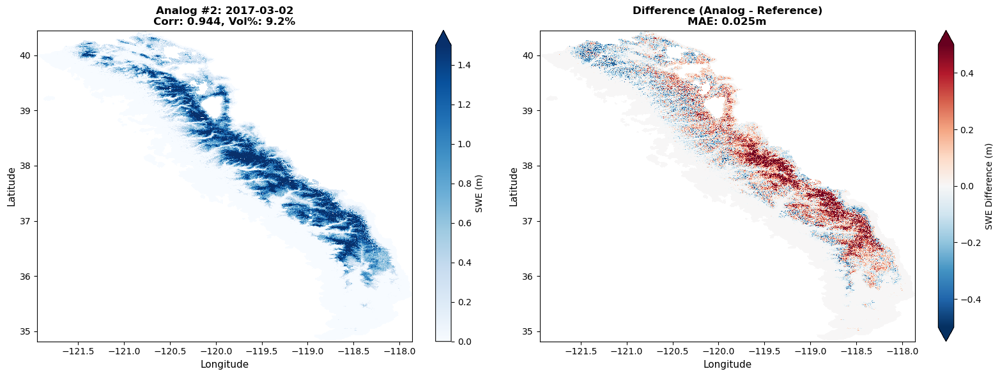

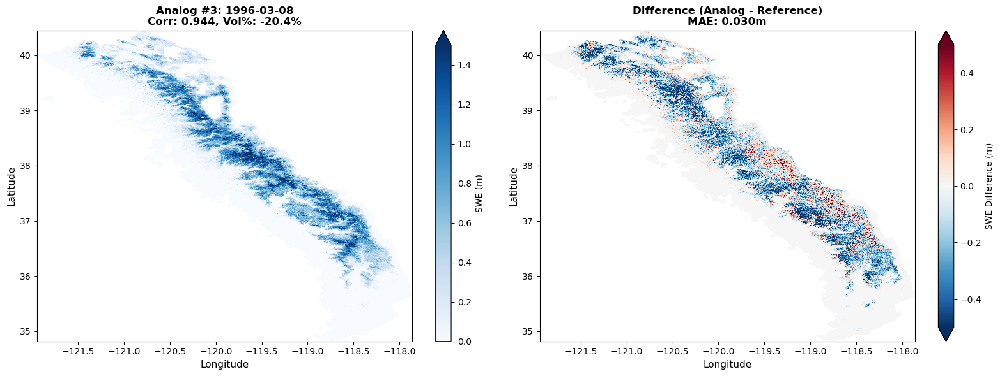

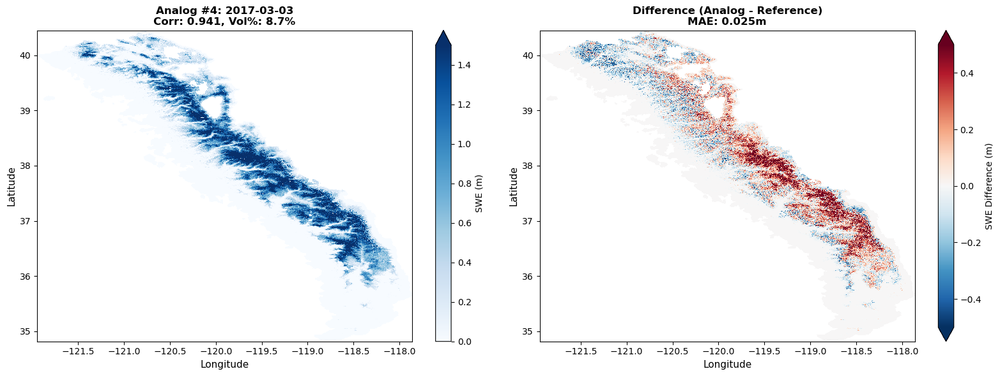

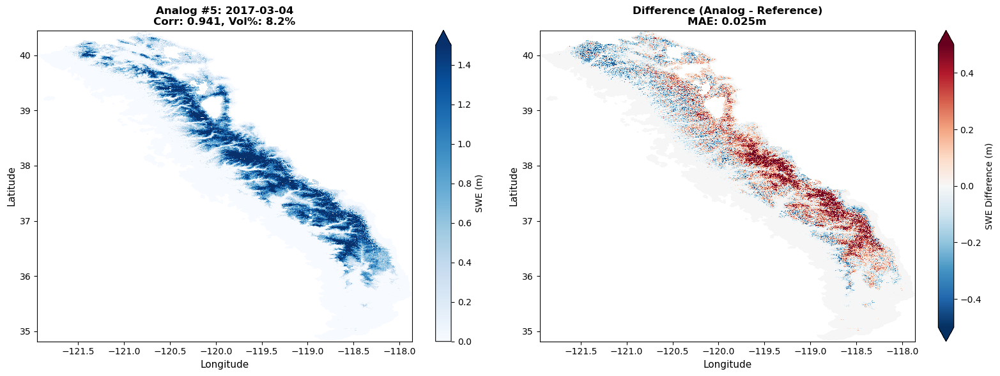




Processing reference date: 2020-04-11


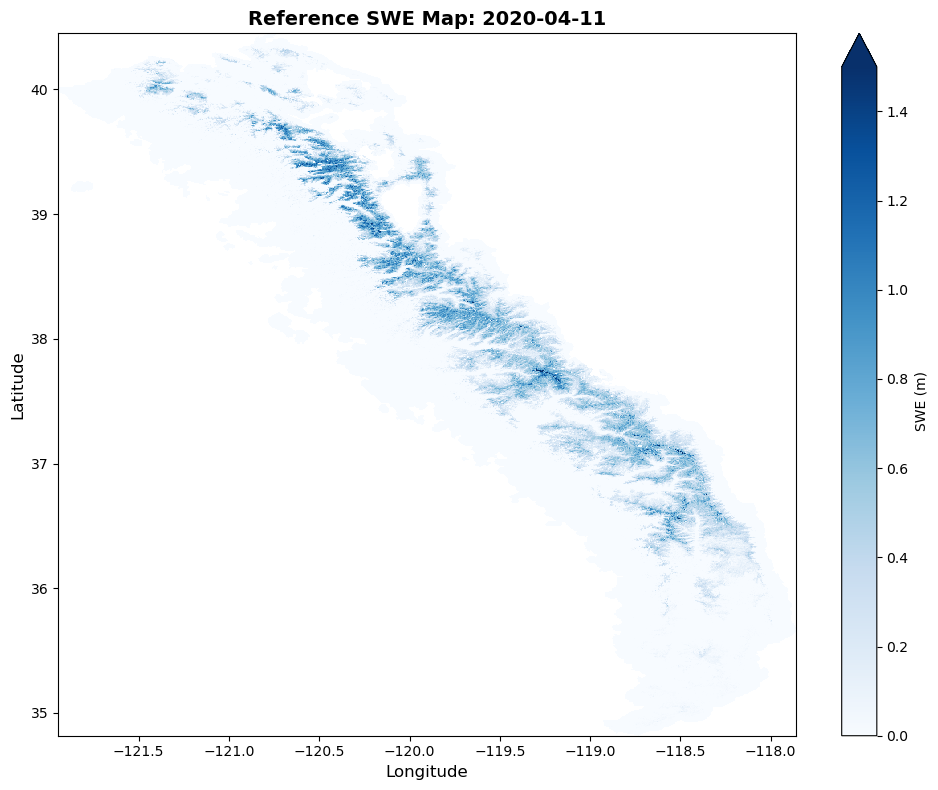


Top 5 analog dates by correlation:
1. 2005-05-07 - Corr: 0.887, Vol%: 90.6%
2. 2005-05-08 - Corr: 0.887, Vol%: 88.0%
3. 2005-05-06 - Corr: 0.886, Vol%: 91.7%
4. 2005-05-12 - Corr: 0.886, Vol%: 89.0%
5. 2005-05-05 - Corr: 0.886, Vol%: 89.7%


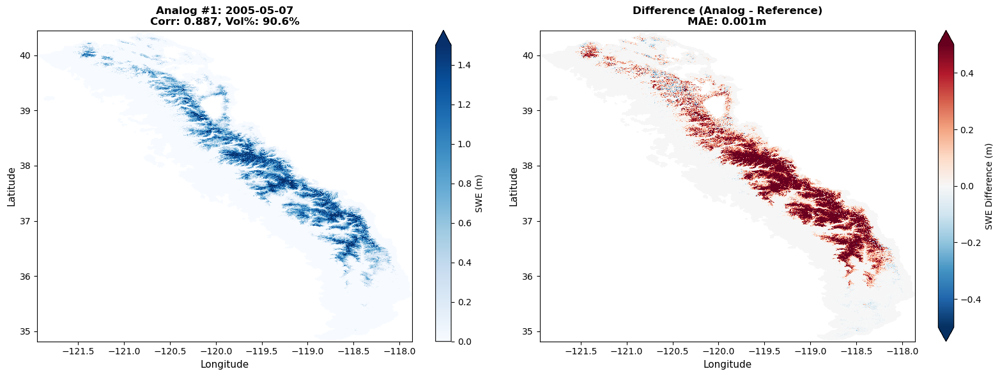

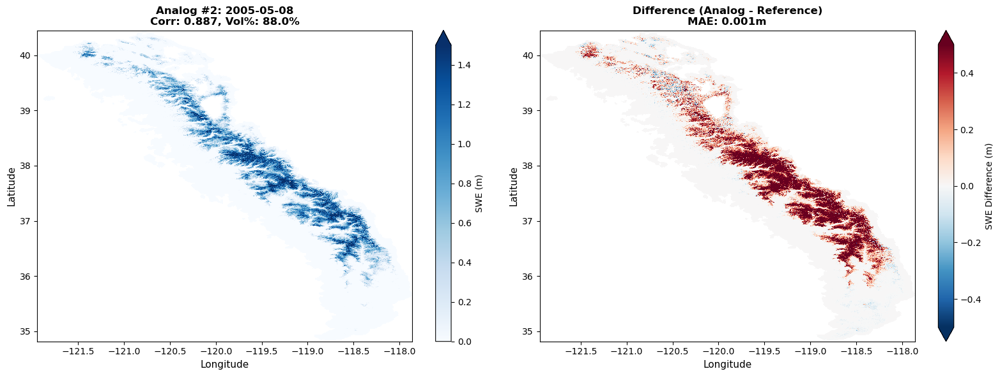

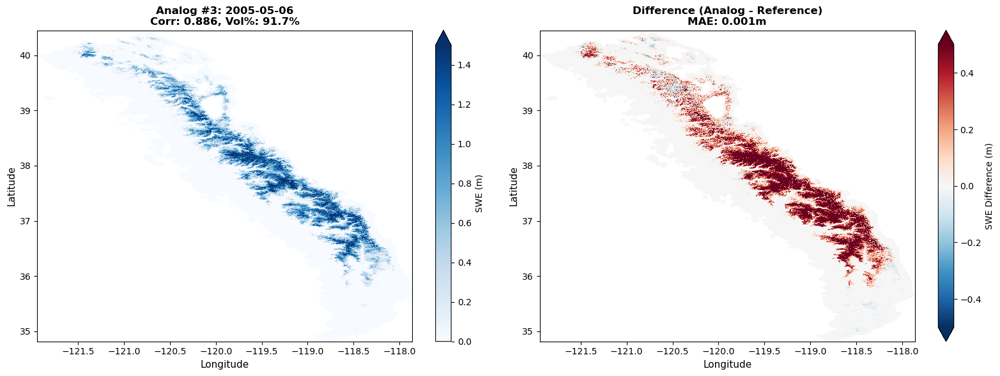

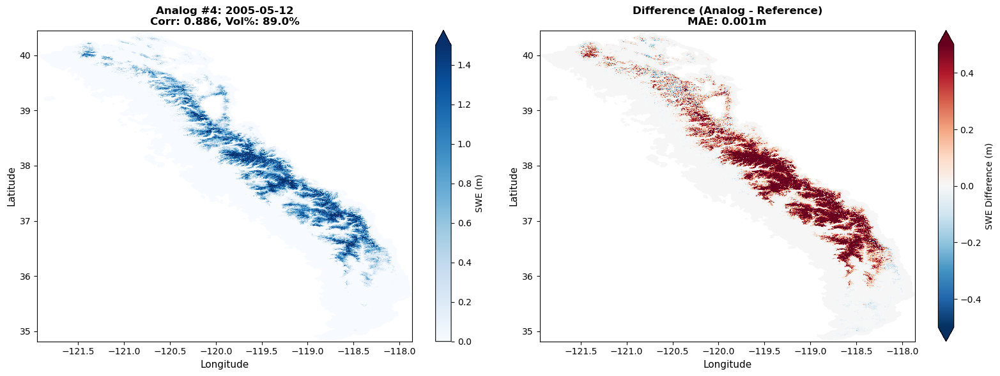

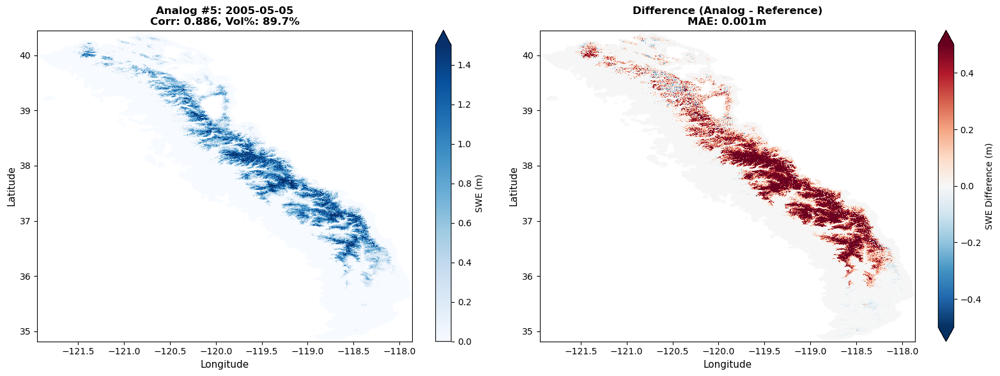




Processing reference date: 2021-04-01


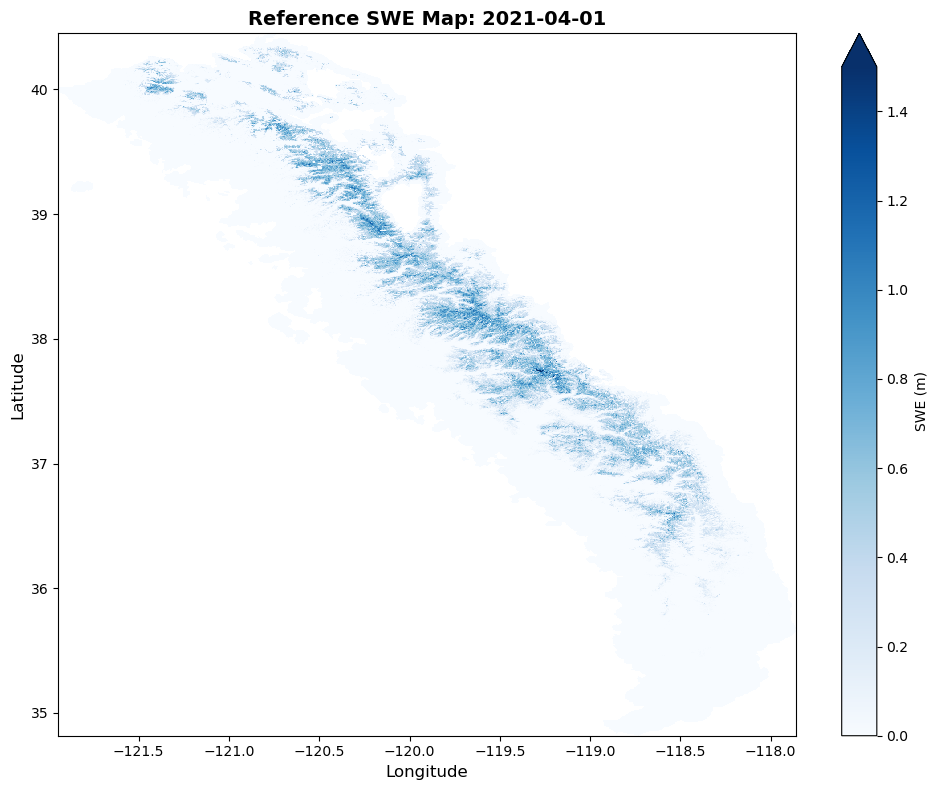


Top 5 analog dates by correlation:
1. 2016-04-01 - Corr: 0.930, Vol%: 38.4%
2. 2016-04-02 - Corr: 0.930, Vol%: 34.8%
3. 2016-04-03 - Corr: 0.930, Vol%: 30.8%
4. 2016-03-27 - Corr: 0.928, Vol%: 39.9%
5. 2016-04-04 - Corr: 0.928, Vol%: 27.1%


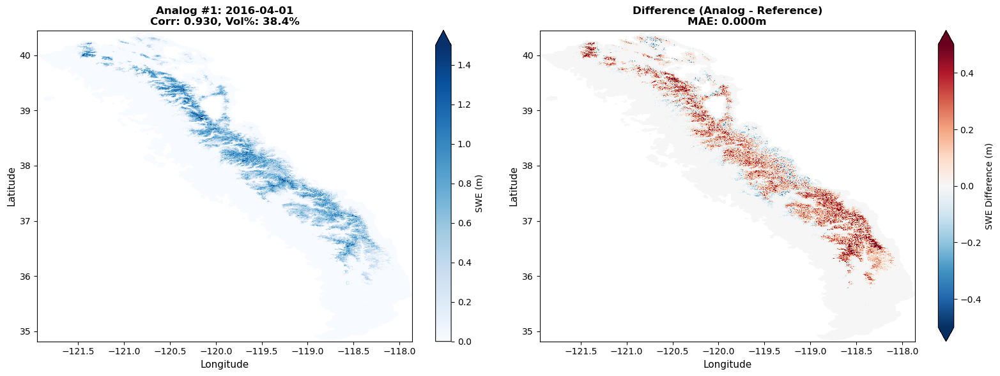

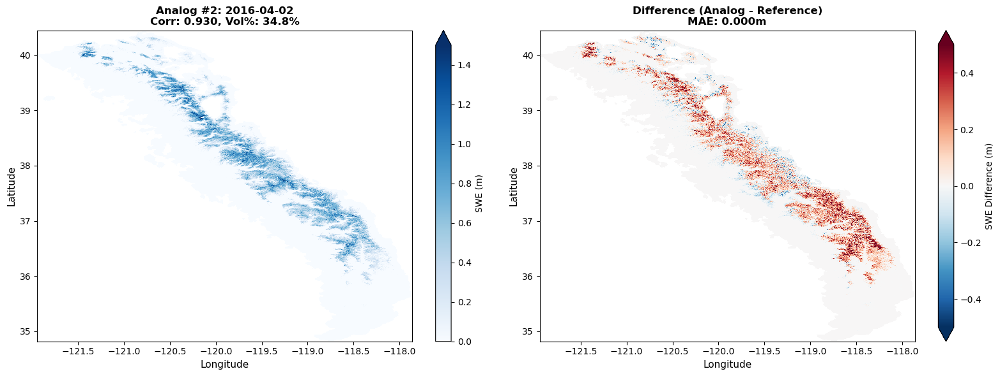

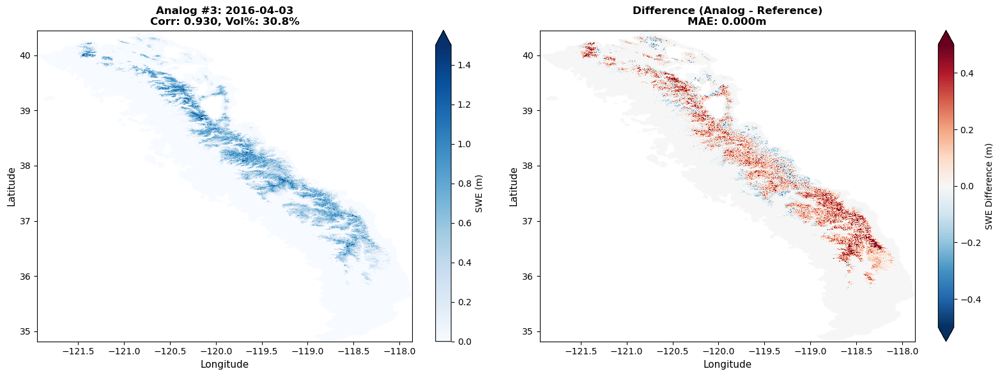

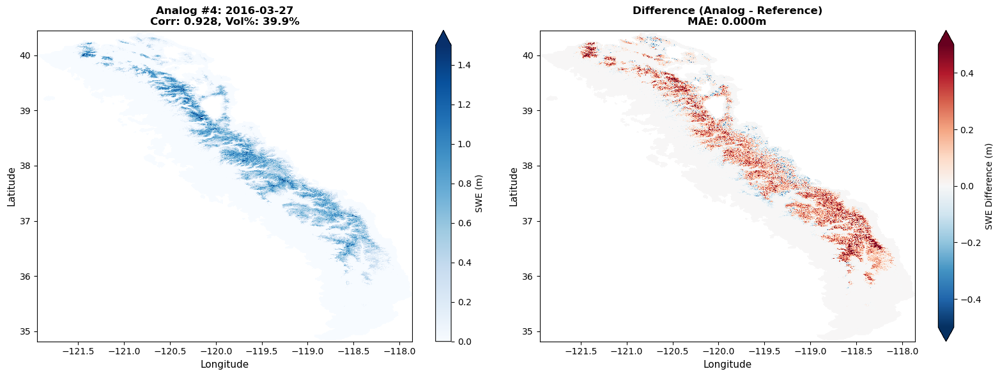

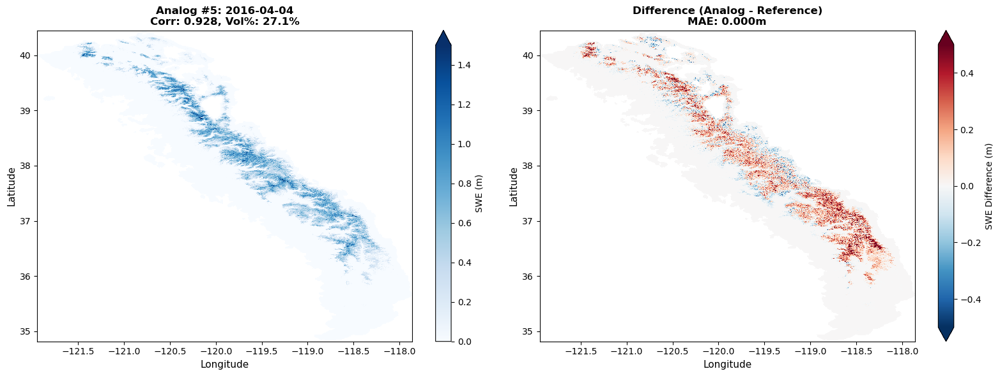

In [2]:
# Function to load SWE data for a given date
def load_swe_for_date(date):
    """Load 2D SWE data from daily files"""
    year = date.year
    doy = date.timetuple().tm_yday
    filepath = f'../data/reanalysis/daily_SWE_files/{year}/day_{doy:03d}.nc'
    
    # Load the data
    ds = xr.open_dataset(filepath)
    swe = ds['SWE_Post']
    
    # Check if data is already 2D or 1D stacked
    if 'space' in swe.dims:
        # 1D stacked - need to unstack
        spatial_coords_path = '../data/reanalysis/daily_SWE_files/spatial_coords.nc'
        spatial_info = xr.open_dataset(spatial_coords_path)
        x_coords = spatial_info.x.values
        y_coords = spatial_info.y.values
        spatial_info.close()
        
        swe_1d = swe.values
        swe_stacked = xr.DataArray(
            swe_1d,
            coords={
                'space': np.arange(len(swe_1d)),
                'x': (['space'], x_coords),
                'y': (['space'], y_coords)
            },
            dims=['space'],
            name='SWE_Post'
        )
        swe_stacked = swe_stacked.set_index(space=['y', 'x'])
        swe_2d = swe_stacked.unstack('space')
        ds.close()
        return swe_2d
    else:
        # Already 2D - just return as-is
        swe_2d = swe.copy()
        ds.close()
        return swe_2d

# Plot SWE maps for reference dates and their top analog dates
ref_dates = ['2019-03-16', '2020-04-11', '2021-04-01']

for ref_date in ref_dates:
    print(f"\n{'='*70}")
    print(f"Processing reference date: {ref_date}")
    print(f"{'='*70}")
    
    # Load data for this reference date
    corr = xr.open_dataarray(f'../data/reanalysis/fsca_correlation/correlation_{ref_date}.nc')
    mae = xr.open_dataarray(f'../data/reanalysis/sd_mae/sd_mae_{ref_date}.nc')
    swe_metrics = xr.open_dataset(f'../data/reanalysis/swe_metrics/swe_metrics_{ref_date}.nc')
    
    # Convert to DataFrames
    corr_df = pd.DataFrame({
        'date': pd.to_datetime(corr.time.values),
        'correlation': corr.values
    })
    
    mae_df = pd.DataFrame({
        'date': pd.to_datetime(mae.time.values),
        'mae': mae.values
    })
    
    swe_df = pd.DataFrame({
        'date': pd.to_datetime(swe_metrics.time.values),
        'swe_mae': swe_metrics['mae'].values,
        'volume_pct_error': swe_metrics['volume_pct_error'].values
    })
    
    # Merge on date
    combined_temp = corr_df.merge(mae_df, on='date', how='inner')
    combined_temp = combined_temp.merge(swe_df, on='date', how='inner')
    
    # Get top 5 by correlation (no filtering)
    top_5_analogs = combined_temp.nlargest(5, 'correlation').copy()
    
    # Load reference SWE map
    ref_date_dt = pd.to_datetime(ref_date)
    ref_swe = load_swe_for_date(ref_date_dt)
    
    # Plot reference SWE map
    fig, ax = plt.subplots(figsize=(10, 8))
    im = ref_swe.plot(ax=ax, cmap='Blues', vmin=0, vmax=1.5, 
                      cbar_kwargs={'label': 'SWE (m)'})
    ax.set_title(f'Reference SWE Map: {ref_date}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Longitude', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=12)
    plt.tight_layout()
    plt.show()
    
    print(f"\nTop 5 analog dates by correlation:")
    for i, (idx, row) in enumerate(top_5_analogs.iterrows(), 1):
        print(f"{i}. {row['date'].strftime('%Y-%m-%d')} - Corr: {row['correlation']:.3f}, Vol%: {row['volume_pct_error']:.1f}%")
    
    # Plot SWE maps and difference maps for top 5 analogs
    for i, (idx, row) in enumerate(top_5_analogs.iterrows(), 1):
        analog_date = row['date']
        
        # Load analog SWE map
        analog_swe = load_swe_for_date(analog_date)
        
        # Calculate difference
        swe_diff = analog_swe - ref_swe
        
        # Create side-by-side plot
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        # Plot analog SWE map
        im1 = analog_swe.plot(ax=axes[0], cmap='Blues', vmin=0, vmax=1.5,
                              cbar_kwargs={'label': 'SWE (m)'})
        axes[0].set_title(f'Analog #{i}: {analog_date.strftime("%Y-%m-%d")}\n' + 
                         f'Corr: {row["correlation"]:.3f}, Vol%: {row["volume_pct_error"]:.1f}%',
                         fontsize=12, fontweight='bold')
        axes[0].set_xlabel('Longitude', fontsize=11)
        axes[0].set_ylabel('Latitude', fontsize=11)
        
        # Plot difference map
        im2 = swe_diff.plot(ax=axes[1], cmap='RdBu_r', center=0, vmin=-0.5, vmax=0.5,
                            cbar_kwargs={'label': 'SWE Difference (m)'})
        axes[1].set_title(f'Difference (Analog - Reference)\nMAE: {row["swe_mae"]:.3f}m',
                         fontsize=12, fontweight='bold')
        axes[1].set_xlabel('Longitude', fontsize=11)
        axes[1].set_ylabel('Latitude', fontsize=11)
        
        plt.tight_layout()
        plt.show()
    
    print(f"\n{'='*70}\n")

In [105]:
# Check the structure of a SWE daily file
test_ds = xr.open_dataset('../data/reanalysis/daily_SWE_files/2019/day_075.nc')
print(test_ds)
test_ds.close()

<xarray.Dataset> Size: 5MB
Dimensions:      (space: 1164373)
Coordinates:
    time         datetime64[ns] 8B ...
    spatial_ref  int64 8B ...
Dimensions without coordinates: space
Data variables:
    SWE_Post     (space) float32 5MB ...


In [ ]:
# Plot the swe map for the date of interest (loop through the 3 highlight years), then for the top 5 dates based on correlation and swe volume, plot the swe maps and swe difference maps compared to the highlight date.

In [42]:
corr_example_514 = xr.open_dataarray('../data/reanalysis/fsca_correlation/correlation_2019-05-14.nc')

In [43]:
# Add water year to the correlation data
# Water year runs Oct 1 - Sep 30, named by ending year
# For March-May dates, water year = current year (since Oct-Sep period)
def get_water_year(date):
    if date.month >= 10:
        return date.year + 1
    else:
        return date.year

# Convert to DataFrame for easier plotting
import pandas as pd
corr_df_514 = pd.DataFrame({
    'correlation': corr_example_514.values,
    'date': pd.to_datetime(corr_example_514.time.values)
})
corr_df_514['water_year'] = corr_df_514['date'].apply(get_water_year)

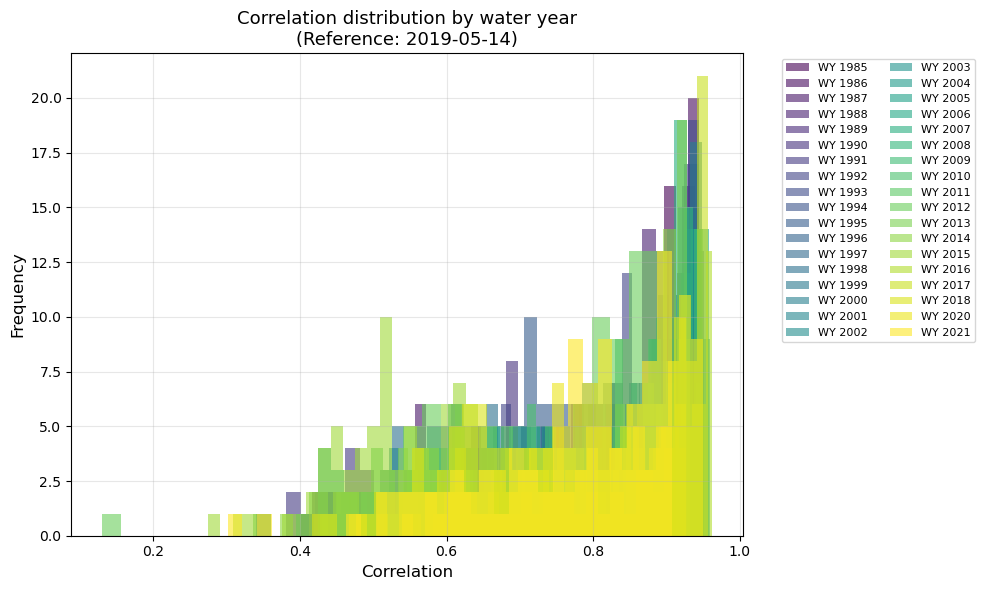

In [44]:
# Histogram colored by water year
fig, ax = plt.subplots(figsize=(10, 6))

# Get unique water years and create colormap
water_years = sorted(corr_df_514['water_year'].unique())
colors = plt.cm.viridis(np.linspace(0, 1, len(water_years)))

# Plot histogram with different colors for each water year
for i, wy in enumerate(water_years):
    data = corr_df_514[corr_df_514['water_year'] == wy]['correlation']
    ax.hist(data, bins=30, alpha=0.6, label=f'WY {wy}', color=colors[i])

ax.set_xlabel('Correlation', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.set_title(f'Correlation distribution by water year\n(Reference: {corr_example_514.attrs["reference_date"]})', fontsize=13)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

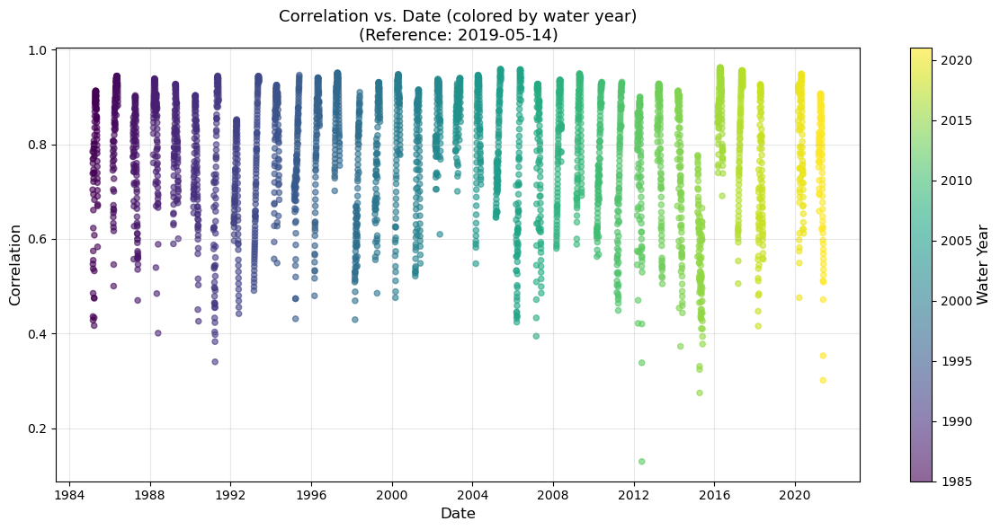

In [45]:
# Scatter plot: correlation vs. date, colored by water year
fig, ax = plt.subplots(figsize=(12, 6))

# Create scatter with color based on water year
scatter = ax.scatter(corr_df_514['date'], corr_df_514['correlation'], 
                     c=corr_df_514['water_year'], cmap='viridis', 
                     alpha=0.6, s=20)

ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Correlation', fontsize=12)
ax.set_title(f'Correlation vs. Date (colored by water year)\n(Reference: {corr_example_514.attrs["reference_date"]})', fontsize=13)
ax.grid(alpha=0.3)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Water Year', fontsize=12)

plt.tight_layout()
plt.show()

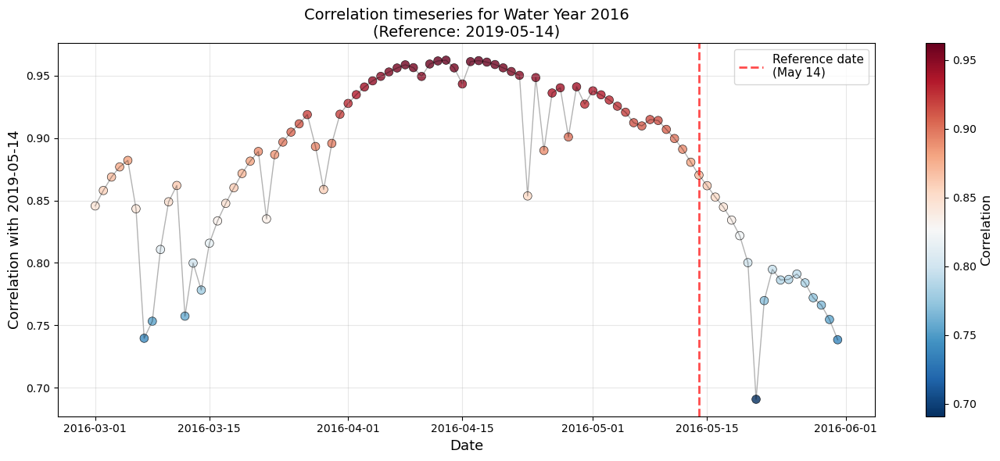

In [47]:
# Filter to just water year 2016 data
corr_2016 = corr_df_514[corr_df_514['water_year'] == 2016].copy()
corr_2016 = corr_2016.sort_values('date')

# Timeseries scatter plot for 2016
fig, ax = plt.subplots(figsize=(14, 6))

ax.scatter(corr_2016['date'], corr_2016['correlation'], 
           c=corr_2016['correlation'], cmap='RdBu_r', 
           s=60, alpha=0.8, edgecolors='black', linewidth=0.5)

# Add line connecting points
ax.plot(corr_2016['date'], corr_2016['correlation'], 
        'k-', alpha=0.3, linewidth=1, zorder=1)

# Add vertical line for reference date (same day/month in 2016)
ref_date_str = corr_example_514.attrs["reference_date"]  # '2019-05-14'
ref_date_2019 = pd.to_datetime(ref_date_str)
ref_date_2016 = ref_date_2019.replace(year=2016)  # May 14, 2016
ax.axvline(ref_date_2016, color='red', linestyle='--', linewidth=2, 
           label=f'Reference date\n({ref_date_2019.strftime("%b %d")})', alpha=0.7)

ax.set_xlabel('Date', fontsize=13)
ax.set_ylabel('Correlation with 2019-05-14', fontsize=13)
ax.set_title(f'Correlation timeseries for Water Year 2016\n(Reference: {corr_example_514.attrs["reference_date"]})', fontsize=14)
ax.legend(fontsize=11)
ax.grid(alpha=0.3, zorder=0)

# Add colorbar
sm = plt.cm.ScalarMappable(cmap='RdBu_r', 
                           norm=plt.Normalize(vmin=corr_2016['correlation'].min(), 
                                             vmax=corr_2016['correlation'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Correlation', fontsize=12)

plt.tight_layout()
plt.show()

In [50]:
corr_example_418 = xr.open_dataarray('../data/reanalysis/fsca_correlation/correlation_2019-04-18.nc')

In [51]:
# Add water year to the correlation data
# Water year runs Oct 1 - Sep 30, named by ending year
# For March-May dates, water year = current year (since Oct-Sep period)
def get_water_year(date):
    if date.month >= 10:
        return date.year + 1
    else:
        return date.year

# Convert to DataFrame for easier plotting
import pandas as pd
corr_df_418 = pd.DataFrame({
    'correlation': corr_example_418.values,
    'date': pd.to_datetime(corr_example_418.time.values)
})
corr_df_418['water_year'] = corr_df_418['date'].apply(get_water_year)

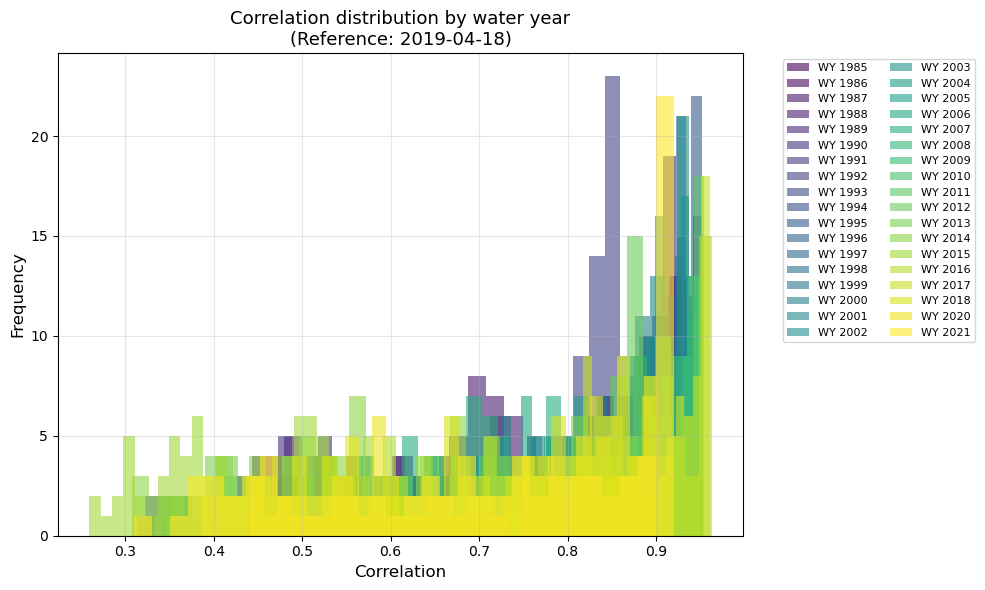

In [53]:
# Histogram colored by water year
fig, ax = plt.subplots(figsize=(10, 6))

# Get unique water years and create colormap
water_years = sorted(corr_df_418['water_year'].unique())
colors = plt.cm.viridis(np.linspace(0, 1, len(water_years)))

# Plot histogram with different colors for each water year
for i, wy in enumerate(water_years):
    data = corr_df_418[corr_df_418['water_year'] == wy]['correlation']
    ax.hist(data, bins=30, alpha=0.6, label=f'WY {wy}', color=colors[i])

ax.set_xlabel('Correlation', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.set_title(f'Correlation distribution by water year\n(Reference: {corr_example_418.attrs["reference_date"]})', fontsize=13)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

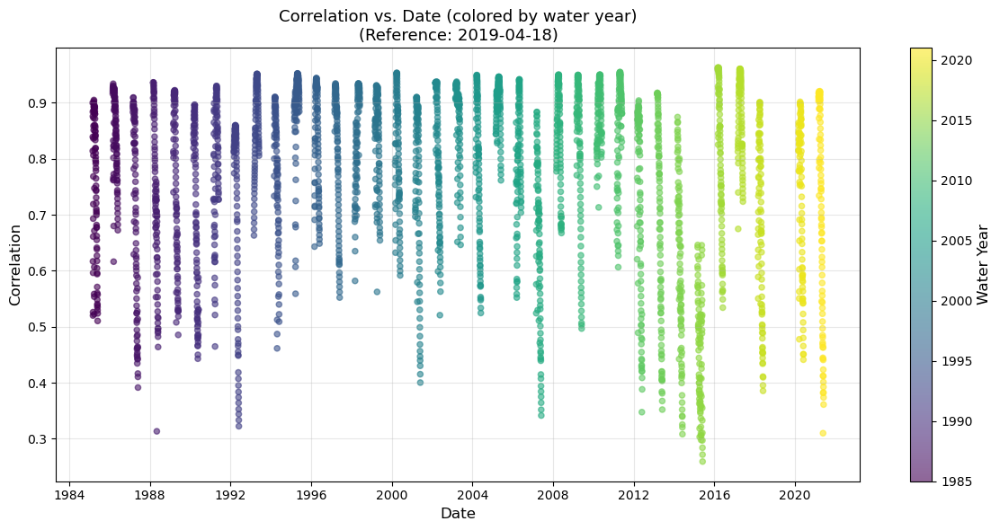

In [54]:
# Scatter plot: correlation vs. date, colored by water year
fig, ax = plt.subplots(figsize=(12, 6))

# Create scatter with color based on water year
scatter = ax.scatter(corr_df_418['date'], corr_df_418['correlation'], 
                     c=corr_df_418['water_year'], cmap='viridis', 
                     alpha=0.6, s=20)

ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Correlation', fontsize=12)
ax.set_title(f'Correlation vs. Date (colored by water year)\n(Reference: {corr_example_418.attrs["reference_date"]})', fontsize=13)
ax.grid(alpha=0.3)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Water Year', fontsize=12)

plt.tight_layout()
plt.show()

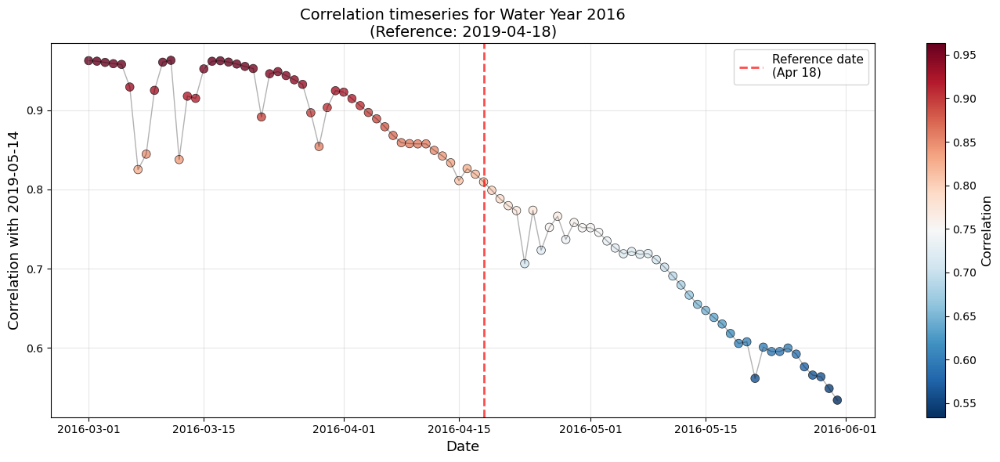

In [55]:
# Filter to just water year 2016 data
corr_2016 = corr_df_418[corr_df_418['water_year'] == 2016].copy()
corr_2016 = corr_2016.sort_values('date')

# Timeseries scatter plot for 2016
fig, ax = plt.subplots(figsize=(14, 6))

ax.scatter(corr_2016['date'], corr_2016['correlation'], 
           c=corr_2016['correlation'], cmap='RdBu_r', 
           s=60, alpha=0.8, edgecolors='black', linewidth=0.5)

# Add line connecting points
ax.plot(corr_2016['date'], corr_2016['correlation'], 
        'k-', alpha=0.3, linewidth=1, zorder=1)

# Add vertical line for reference date (same day/month in 2016)
ref_date_str = corr_example_514.attrs["reference_date"]  # '2019-05-14'
ref_date_2019 = pd.to_datetime(ref_date_str)
ref_date_2016 = ref_date_2019.replace(year=2016)  # May 14, 2016
ax.axvline(ref_date_2016, color='red', linestyle='--', linewidth=2, 
           label=f'Reference date\n({ref_date_2019.strftime("%b %d")})', alpha=0.7)

ax.set_xlabel('Date', fontsize=13)
ax.set_ylabel('Correlation with 2019-05-14', fontsize=13)
ax.set_title(f'Correlation timeseries for Water Year 2016\n(Reference: {corr_example_514.attrs["reference_date"]})', fontsize=14)
ax.legend(fontsize=11)
ax.grid(alpha=0.3, zorder=0)

# Add colorbar
sm = plt.cm.ScalarMappable(cmap='RdBu_r', 
                           norm=plt.Normalize(vmin=corr_2016['correlation'].min(), 
                                             vmax=corr_2016['correlation'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Correlation', fontsize=12)

plt.tight_layout()
plt.show()

# Unit Tests for Correlation, MAE, and Volume Percent Calculations

These tests verify that our metric calculations work as expected using synthetic data with known properties.

In [3]:
import scipy.stats as stats

# ============================================================================
# Test 1: Pearson Correlation (used for SCA correlation)
# ============================================================================
print("=" * 70)
print("TEST 1: Pearson Correlation")
print("=" * 70)

# Test 1a: Perfect positive correlation (r = 1.0)
ref_perfect = np.array([1, 2, 3, 4, 5])
comp_perfect = np.array([2, 4, 6, 8, 10])  # Exactly 2x reference
r_perfect, _ = stats.pearsonr(ref_perfect, comp_perfect)
print(f"\n1a. Perfect positive correlation:")
print(f"    Reference: {ref_perfect}")
print(f"    Comparison: {comp_perfect} (2x reference)")
print(f"    Expected r = 1.0, Got r = {r_perfect:.6f}")
assert np.isclose(r_perfect, 1.0), f"Failed: Expected 1.0, got {r_perfect}"
print("    ✓ PASSED")

# Test 1b: Perfect negative correlation (r = -1.0)
ref_neg = np.array([1, 2, 3, 4, 5])
comp_neg = np.array([5, 4, 3, 2, 1])  # Reversed
r_neg, _ = stats.pearsonr(ref_neg, comp_neg)
print(f"\n1b. Perfect negative correlation:")
print(f"    Reference: {ref_neg}")
print(f"    Comparison: {comp_neg} (reversed)")
print(f"    Expected r = -1.0, Got r = {r_neg:.6f}")
assert np.isclose(r_neg, -1.0), f"Failed: Expected -1.0, got {r_neg}"
print("    ✓ PASSED")

# Test 1c: No correlation (r ≈ 0)
np.random.seed(42)
ref_rand = np.random.randn(1000)
comp_rand = np.random.randn(1000)
r_rand, _ = stats.pearsonr(ref_rand, comp_rand)
print(f"\n1c. No correlation (random data):")
print(f"    1000 random samples each")
print(f"    Expected r ≈ 0, Got r = {r_rand:.6f}")
assert np.abs(r_rand) < 0.1, f"Failed: Expected ~0, got {r_rand}"
print("    ✓ PASSED")

# Test 1d: Correlation with NaN handling (as done in the actual function)
ref_nan = np.array([1, 2, np.nan, 4, 5])
comp_nan = np.array([10, 20, 30, 40, 50])
valid_mask = ~(np.isnan(ref_nan) | np.isnan(comp_nan))
r_nan, _ = stats.pearsonr(ref_nan[valid_mask], comp_nan[valid_mask])
print(f"\n1d. Correlation with NaN handling:")
print(f"    Reference: {ref_nan}")
print(f"    Comparison: {comp_nan}")
print(f"    Valid pairs: {valid_mask.sum()} (excluding NaN)")
print(f"    Expected r = 1.0, Got r = {r_nan:.6f}")
assert np.isclose(r_nan, 1.0), f"Failed: Expected 1.0, got {r_nan}"
print("    ✓ PASSED")

print("\n" + "=" * 70)
print("All correlation tests PASSED!")
print("=" * 70)

TEST 1: Pearson Correlation

1a. Perfect positive correlation:
    Reference: [1 2 3 4 5]
    Comparison: [ 2  4  6  8 10] (2x reference)
    Expected r = 1.0, Got r = 1.000000
    ✓ PASSED

1b. Perfect negative correlation:
    Reference: [1 2 3 4 5]
    Comparison: [5 4 3 2 1] (reversed)
    Expected r = -1.0, Got r = -1.000000
    ✓ PASSED

1c. No correlation (random data):
    1000 random samples each
    Expected r ≈ 0, Got r = -0.040400
    ✓ PASSED

1d. Correlation with NaN handling:
    Reference: [ 1.  2. nan  4.  5.]
    Comparison: [10 20 30 40 50]
    Valid pairs: 4 (excluding NaN)
    Expected r = 1.0, Got r = 1.000000
    ✓ PASSED

All correlation tests PASSED!


In [4]:
# ============================================================================
# Test 2: Median Absolute Error (MAE) - used for SD and SWE
# ============================================================================
print("=" * 70)
print("TEST 2: Median Absolute Error (MAE)")
print("=" * 70)

# Test 2a: Perfect match (MAE = 0)
ref_match = np.array([1.0, 2.0, 3.0, 4.0, 5.0])
comp_match = np.array([1.0, 2.0, 3.0, 4.0, 5.0])  # Identical
abs_diff_match = np.abs(ref_match - comp_match)
mae_match = np.median(abs_diff_match)
print(f"\n2a. Perfect match:")
print(f"    Reference: {ref_match}")
print(f"    Comparison: {comp_match}")
print(f"    Expected MAE = 0.0, Got MAE = {mae_match:.6f}")
assert np.isclose(mae_match, 0.0), f"Failed: Expected 0.0, got {mae_match}"
print("    ✓ PASSED")

# Test 2b: Constant offset (MAE = offset)
ref_offset = np.array([1.0, 2.0, 3.0, 4.0, 5.0])
comp_offset = np.array([2.0, 3.0, 4.0, 5.0, 6.0])  # All +1.0
abs_diff_offset = np.abs(ref_offset - comp_offset)
mae_offset = np.median(abs_diff_offset)
print(f"\n2b. Constant offset (+1.0):")
print(f"    Reference: {ref_offset}")
print(f"    Comparison: {comp_offset}")
print(f"    Absolute differences: {abs_diff_offset}")
print(f"    Expected MAE = 1.0, Got MAE = {mae_offset:.6f}")
assert np.isclose(mae_offset, 1.0), f"Failed: Expected 1.0, got {mae_offset}"
print("    ✓ PASSED")

# Test 2c: Median is robust to outliers
ref_outlier = np.array([1.0, 2.0, 3.0, 4.0, 5.0])
comp_outlier = np.array([1.5, 2.5, 3.5, 4.5, 100.0])  # One huge outlier
abs_diff_outlier = np.abs(ref_outlier - comp_outlier)
mae_outlier = np.median(abs_diff_outlier)
mean_outlier = np.mean(abs_diff_outlier)
print(f"\n2c. Median is robust to outliers:")
print(f"    Reference: {ref_outlier}")
print(f"    Comparison: {comp_outlier} (outlier at end)")
print(f"    Absolute differences: {abs_diff_outlier}")
print(f"    Median: {mae_outlier:.2f}, Mean: {mean_outlier:.2f}")
print(f"    Expected MAE = 0.5, Got MAE = {mae_outlier:.6f}")
assert np.isclose(mae_outlier, 0.5), f"Failed: Expected 0.5, got {mae_outlier}"
print("    ✓ PASSED (median ignores outlier, mean would be ~19)")

# Test 2d: MAE with NaN handling (as done in the actual function)
ref_mae_nan = np.array([1.0, 2.0, np.nan, 4.0, 5.0])
comp_mae_nan = np.array([1.5, 2.5, 3.5, np.nan, 5.5])
abs_diff_nan = np.abs(ref_mae_nan - comp_mae_nan)
valid_mask_mae = ~np.isnan(abs_diff_nan)
mae_nan = np.median(abs_diff_nan[valid_mask_mae])
print(f"\n2d. MAE with NaN handling:")
print(f"    Reference: {ref_mae_nan}")
print(f"    Comparison: {comp_mae_nan}")
print(f"    Absolute differences: {abs_diff_nan}")
print(f"    Valid values: {abs_diff_nan[valid_mask_mae]}")
print(f"    Expected MAE = 0.5, Got MAE = {mae_nan:.6f}")
assert np.isclose(mae_nan, 0.5), f"Failed: Expected 0.5, got {mae_nan}"
print("    ✓ PASSED")

print("\n" + "=" * 70)
print("All MAE tests PASSED!")
print("=" * 70)

TEST 2: Median Absolute Error (MAE)

2a. Perfect match:
    Reference: [1. 2. 3. 4. 5.]
    Comparison: [1. 2. 3. 4. 5.]
    Expected MAE = 0.0, Got MAE = 0.000000
    ✓ PASSED

2b. Constant offset (+1.0):
    Reference: [1. 2. 3. 4. 5.]
    Comparison: [2. 3. 4. 5. 6.]
    Absolute differences: [1. 1. 1. 1. 1.]
    Expected MAE = 1.0, Got MAE = 1.000000
    ✓ PASSED

2c. Median is robust to outliers:
    Reference: [1. 2. 3. 4. 5.]
    Comparison: [  1.5   2.5   3.5   4.5 100. ] (outlier at end)
    Absolute differences: [ 0.5  0.5  0.5  0.5 95. ]
    Median: 0.50, Mean: 19.40
    Expected MAE = 0.5, Got MAE = 0.500000
    ✓ PASSED (median ignores outlier, mean would be ~19)

2d. MAE with NaN handling:
    Reference: [ 1.  2. nan  4.  5.]
    Comparison: [1.5 2.5 3.5 nan 5.5]
    Absolute differences: [0.5 0.5 nan nan 0.5]
    Valid values: [0.5 0.5 0.5]
    Expected MAE = 0.5, Got MAE = 0.500000
    ✓ PASSED

All MAE tests PASSED!


In [5]:
# ============================================================================
# Test 3: Volume Percent Error (used for SWE)
# ============================================================================
print("=" * 70)
print("TEST 3: Volume Percent Error")
print("=" * 70)

# Formula: volume_pct_error = ((comp_volume - ref_volume) / ref_volume) * 100
# where volume = sum(SWE) * cell_area

cell_area = 250000  # m² (500m x 500m grid cells)

# Test 3a: Perfect match (0% error)
ref_swe_3a = np.array([0.5, 1.0, 0.8, 0.3])  # SWE in meters
comp_swe_3a = np.array([0.5, 1.0, 0.8, 0.3])  # Identical
ref_vol_3a = np.nansum(ref_swe_3a) * cell_area
comp_vol_3a = np.nansum(comp_swe_3a) * cell_area
vol_pct_3a = ((comp_vol_3a - ref_vol_3a) / ref_vol_3a) * 100
print(f"\n3a. Perfect volume match:")
print(f"    Reference SWE: {ref_swe_3a} → Volume: {ref_vol_3a:,.0f} m³")
print(f"    Comparison SWE: {comp_swe_3a} → Volume: {comp_vol_3a:,.0f} m³")
print(f"    Expected Vol% = 0.0%, Got Vol% = {vol_pct_3a:.6f}%")
assert np.isclose(vol_pct_3a, 0.0), f"Failed: Expected 0.0%, got {vol_pct_3a}%"
print("    ✓ PASSED")

# Test 3b: Comparison has 10% more snow
ref_swe_3b = np.array([1.0, 1.0, 1.0, 1.0])  # 4 m total SWE
comp_swe_3b = np.array([1.1, 1.1, 1.1, 1.1])  # 4.4 m total SWE (10% more)
ref_vol_3b = np.nansum(ref_swe_3b) * cell_area
comp_vol_3b = np.nansum(comp_swe_3b) * cell_area
vol_pct_3b = ((comp_vol_3b - ref_vol_3b) / ref_vol_3b) * 100
print(f"\n3b. Comparison has 10% more snow:")
print(f"    Reference total SWE: {np.sum(ref_swe_3b):.1f} m → Volume: {ref_vol_3b:,.0f} m³")
print(f"    Comparison total SWE: {np.sum(comp_swe_3b):.1f} m → Volume: {comp_vol_3b:,.0f} m³")
print(f"    Expected Vol% = +10.0%, Got Vol% = {vol_pct_3b:.6f}%")
assert np.isclose(vol_pct_3b, 10.0), f"Failed: Expected 10.0%, got {vol_pct_3b}%"
print("    ✓ PASSED")

# Test 3c: Comparison has 25% less snow
ref_swe_3c = np.array([1.0, 1.0, 1.0, 1.0])  # 4 m total SWE
comp_swe_3c = np.array([0.75, 0.75, 0.75, 0.75])  # 3 m total SWE (25% less)
ref_vol_3c = np.nansum(ref_swe_3c) * cell_area
comp_vol_3c = np.nansum(comp_swe_3c) * cell_area
vol_pct_3c = ((comp_vol_3c - ref_vol_3c) / ref_vol_3c) * 100
print(f"\n3c. Comparison has 25% less snow:")
print(f"    Reference total SWE: {np.sum(ref_swe_3c):.1f} m → Volume: {ref_vol_3c:,.0f} m³")
print(f"    Comparison total SWE: {np.sum(comp_swe_3c):.1f} m → Volume: {comp_vol_3c:,.0f} m³")
print(f"    Expected Vol% = -25.0%, Got Vol% = {vol_pct_3c:.6f}%")
assert np.isclose(vol_pct_3c, -25.0), f"Failed: Expected -25.0%, got {vol_pct_3c}%"
print("    ✓ PASSED")

# Test 3d: Volume with NaN handling
ref_swe_3d = np.array([1.0, np.nan, 1.0, 1.0])  # 3 m total (excluding NaN)
comp_swe_3d = np.array([1.0, 1.0, np.nan, 1.0])  # 3 m total (excluding NaN)
ref_vol_3d = np.nansum(ref_swe_3d) * cell_area
comp_vol_3d = np.nansum(comp_swe_3d) * cell_area
vol_pct_3d = ((comp_vol_3d - ref_vol_3d) / ref_vol_3d) * 100
print(f"\n3d. Volume with NaN handling (nansum):")
print(f"    Reference SWE: {ref_swe_3d} → nansum = {np.nansum(ref_swe_3d):.1f}")
print(f"    Comparison SWE: {comp_swe_3d} → nansum = {np.nansum(comp_swe_3d):.1f}")
print(f"    Expected Vol% = 0.0%, Got Vol% = {vol_pct_3d:.6f}%")
assert np.isclose(vol_pct_3d, 0.0), f"Failed: Expected 0.0%, got {vol_pct_3d}%"
print("    ✓ PASSED")

# Test 3e: Comparison has double the snow
ref_swe_3e = np.array([0.5, 0.5, 0.5, 0.5])  # 2 m total
comp_swe_3e = np.array([1.0, 1.0, 1.0, 1.0])  # 4 m total (100% more)
ref_vol_3e = np.nansum(ref_swe_3e) * cell_area
comp_vol_3e = np.nansum(comp_swe_3e) * cell_area
vol_pct_3e = ((comp_vol_3e - ref_vol_3e) / ref_vol_3e) * 100
print(f"\n3e. Comparison has double the snow:")
print(f"    Reference total SWE: {np.sum(ref_swe_3e):.1f} m")
print(f"    Comparison total SWE: {np.sum(comp_swe_3e):.1f} m")
print(f"    Expected Vol% = +100.0%, Got Vol% = {vol_pct_3e:.6f}%")
assert np.isclose(vol_pct_3e, 100.0), f"Failed: Expected 100.0%, got {vol_pct_3e}%"
print("    ✓ PASSED")

print("\n" + "=" * 70)
print("All volume percent error tests PASSED!")
print("=" * 70)

TEST 3: Volume Percent Error

3a. Perfect volume match:
    Reference SWE: [0.5 1.  0.8 0.3] → Volume: 650,000 m³
    Comparison SWE: [0.5 1.  0.8 0.3] → Volume: 650,000 m³
    Expected Vol% = 0.0%, Got Vol% = 0.000000%
    ✓ PASSED

3b. Comparison has 10% more snow:
    Reference total SWE: 4.0 m → Volume: 1,000,000 m³
    Comparison total SWE: 4.4 m → Volume: 1,100,000 m³
    Expected Vol% = +10.0%, Got Vol% = 10.000000%
    ✓ PASSED

3c. Comparison has 25% less snow:
    Reference total SWE: 4.0 m → Volume: 1,000,000 m³
    Comparison total SWE: 3.0 m → Volume: 750,000 m³
    Expected Vol% = -25.0%, Got Vol% = -25.000000%
    ✓ PASSED

3d. Volume with NaN handling (nansum):
    Reference SWE: [ 1. nan  1.  1.] → nansum = 3.0
    Comparison SWE: [ 1.  1. nan  1.] → nansum = 3.0
    Expected Vol% = 0.0%, Got Vol% = 0.000000%
    ✓ PASSED

3e. Comparison has double the snow:
    Reference total SWE: 2.0 m
    Comparison total SWE: 4.0 m
    Expected Vol% = +100.0%, Got Vol% = 100.00000

In [6]:
print("=" * 70)
print("ALL TESTS PASSED!")
print("=" * 70)
print("\nSummary of metric calculations:")
print("  • Correlation: Pearson's r between flattened SCA grids")
print("  • MAE: Median of |reference - comparison| for SD/SWE")
print("  • Volume %: ((comp_sum - ref_sum) / ref_sum) * 100 for SWE")
print("=" * 70)

ALL TESTS PASSED!

Summary of metric calculations:
  • Correlation: Pearson's r between flattened SCA grids
  • MAE: Median of |reference - comparison| for SD/SWE
  • Volume %: ((comp_sum - ref_sum) / ref_sum) * 100 for SWE
